# F20AA Applied Text Analytics Coursework 2

## UG_CwGroup 2

### Authors:

### Baber Jan - bj58
### Gaurav Gosain - gg68
### Muhammad Assad Khan - mk227
### Ashab Uddin - mu15

[Link To this notebook as HTML](http://gaurav-gosain.github.io/F20AA_CW2_Submission)

[Link to this notebook uploaded on Colab]()

[Link to this notebook uploaded on Github]()

[Link to this notebook uploaded on Google Drive](https://drive.google.com/drive/folders/1qEIvhA2Kw1-Bx36u3NeOo_AGvsWW1zjn?usp=sharing)

# Environment Setup

Python environment should be Python 3.6

In [42]:
from textblob import TextBlob
import sys,os,time
import matplotlib.pyplot as plt
import json
import demoji
import pandas as pd
import numpy as np
import preprocessor as pp
import re
import spacy
import gc
from spacy.tokenizer import Tokenizer
from spacy.lang.en import English
from nltk.stem import PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import word_tokenize
from IPython.display import clear_output
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
# Multinomial Naive Bayes
from sklearn.naive_bayes import MultinomialNB
# Gausian Naive Bayes
from sklearn.naive_bayes import GaussianNB
# Categorical Naive Bayes
from sklearn.naive_bayes import CategoricalNB
# Bernoulli Naive Bayes
from sklearn.naive_bayes import BernoulliNB
# K-Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier
# SVM
from sklearn.svm import SVC
# Linear Model
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
# Grid Search
from sklearn.model_selection import GridSearchCV
# Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score, precision_score, recall_score
import seaborn as sns
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D, Bidirectional
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils.np_utils import to_categorical
from IPython.display import display, Markdown
import threading
from sklearn.model_selection import StratifiedKFold
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import warnings
import torch
import torch.nn.functional as F
import torch.nn as nn
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import MultiHeadAttention, LayerNormalization, Dropout, Layer
from tensorflow.keras.layers import Embedding, Input, GlobalAveragePooling1D, Dense
from tensorflow.keras.models import Sequential, Model
import pickle
# plot 3D PCA using plotly
from plotly.offline import iplot
import plotly.graph_objs as go
import pyLDAvis
import pyLDAvis.sklearn
import multiprocessing
import cufflinks as cf
from tqdm import tqdm
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

pyLDAvis.enable_notebook()

# tqdm.pandas(desc='Progress')
warnings.filterwarnings("ignore")

def printmd(string):
    display(Markdown(string))

%matplotlib inline

In [43]:
class Normalizer(BaseEstimator, TransformerMixin):
    def __init__(self, options):

        self.verbose = False

        if isinstance(options, tuple):
            options, self.verbose = options

        self.nlp = spacy.load("en_core_web_sm")
        pp.set_options(pp.OPT.URL)
        if 'l' not in options and 's' not in options and 'r' not in options and 'c' not in options:
            print("Options: (r | l | s | c)")
            raise Error

        char_map = {'l': 'Lemmatization', 's': 'Stemming', 'r': 'Removal of Stopwords', 'c': 'Clean Text'}

        if self.verbose:
            printmd("## Using " +
                    " + ".join([f"{char_map[option]}" for option in options]))

        self.options = options
        self.stemmer = SnowballStemmer(language='english')

    def lemmatize_text(self, current_text):
        lemmatized_text_text = []

        if self.verbose:
            printmd("## Lemmatizing text")

        if type(current_text) != str:
            current_text = " ".join(current_text)
        doc = self.nlp(current_text)
        for token in doc:
            lemmatized_text_text.append(token.lemma_)

        if self.verbose:

            printmd(f'''
| **text** | **Lemmatized text** |
| --- | -- |
| {current_text} | {lemmatized_text_text} |
''')

        return lemmatized_text_text

    def stemitize_text(self, current_text):

        if self.verbose:
            printmd("## Stemming text")

        stemitized_text_text = []
        if type(current_text) == str:
            current_text = current_text.split()
        for token in current_text:
            stemitized_text_text.append(self.stemmer.stem(token))

        if self.verbose:

            printmd(f'''
| **text** | **text after Stemming** |
| --- | -- |
| {current_text} | {stemitized_text_text} |
''')

        return stemitized_text_text

    def remove_stopwords(self, current_text):
        stopwords_removed_text = []
        if type(current_text) == str:
            current_text = current_text.split()
        for word in current_text:
            if word not in self.nlp.Defaults.stop_words:
                stopwords_removed_text.append(word)
        return stopwords_removed_text

    def remove_html_tags(self, current_text):
        return re.sub('<[^<]+?>', ' ', current_text)

    def remove_urls(self, current_text):
        return re.sub(r'http\S+', ' ', current_text)

    def remove_punctuation(self, current_text):
        return re.sub('[^a-zA-Z]', ' ', current_text)

    def remove_numbers(self, current_text):
        return re.sub('[0-9]', ' ', current_text)

    def remove_non_ascii(self, current_text):
        return re.sub(r'[^\x00-\x7F]+', ' ', current_text)

    def clean_text(self, current_text):
        current_text = current_text.replace("'", "")
        current_text = self.remove_urls(current_text)
        current_text = self.remove_html_tags(current_text)
        current_text = self.remove_punctuation(current_text)
        current_text = self.remove_numbers(current_text)
        current_text = self.remove_non_ascii(current_text)
        current_text = current_text.lower()
        # remove single characters
        current_text = re.sub('\s[a-zA-Z]\s', ' ', current_text)
        # replace multiple spaces with a single space
        current_text = re.sub(' +', ' ', current_text)
        # remove leading and trailing spaces
        current_text = current_text.strip()
        return current_text


    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        lemmatize_text_list = []
        for index, datum in tqdm(X.items()):

            cleaned_text = datum

            # Check for the options
            for c in self.options:

                if type(cleaned_text) != str:
                    cleaned_text = " ".join(cleaned_text)
                    
                if c == "l":
                    # Lemmatize the text
                    cleaned_text = self.lemmatize_text(
                        current_text=cleaned_text)
                elif c == 's':
                    # Stem the text
                    cleaned_text = self.stemitize_text(
                        current_text=cleaned_text)
                
                elif c == 'r':
                    # Remove stopwords
                    cleaned_text = self.remove_stopwords(
                        current_text=cleaned_text)
                    
                elif c == 'c':
                    # Clean the text
                    cleaned_text = self.clean_text(
                        current_text=cleaned_text)

            if type(cleaned_text) != str:
                # As this is a list, join to make a string again
                normalized_text = " ".join(cleaned_text)
            else:
                normalized_text = cleaned_text
            # Append text to the lematize_text_list
            lemmatize_text_list.append(normalized_text)

            if self.verbose:
                printmd(
                    f"## text after Normalization \n### {normalized_text}\n---\n")

        X = lemmatize_text_list
        return X

In [44]:
train = pd.read_csv('data/train.csv')

normalizer = Normalizer(options='cr')

train_slice = train.head(10)

train_slice['Normalized_Review_text'] = normalizer.fit_transform(train_slice['Review_text'])

10it [00:00, 9861.99it/s]


In [45]:
train_slice.loc[1, 'Review_text']

'*****<br />Numi\'s Collection Assortment Melange includes:<br />5 Herbal Teas (caffeine-free, also called "teasans"):<br />* Dry Desert Lime: Lime Herbal Teasan<br />* Fields of Gold: Lemongrass Herbal Teasan<br />* Red Mellow Bush: Rooibos Herbal Teasan<br />* Bushmen\'s Brew: Honeybush Herbal Teasan<br />* Simply Mint: Moroccan Mint<br /><br />2 Green Teas (lower in caffeine):<br />* Temple of Heaven: Gunpowder Green Tea<br />* Monkey King: Jasmine Green Tea<br /><br />2 Black Teas (contain caffeine):<br />* Chinese Breakfast: Yunnan Black Tea<br />* Smoky Tarry: Lapsang Souchong Black Tea<br /><br />This is a total of nine different teas, two tea bags of each one in each box. Numi teas are known for their high-quality, organic and kosher ingredients, and in my opinion, are some of the tastiest and best teas I have ever tried. They do not include artificial ingredients or flavorings.<br /><br />On the box, the manufacturer writes: "From mist-covered mountains to sun-drenched deserts

In [46]:
train_slice.loc[1, 'Normalized_Review_text']

'numis collection assortment melange includes herbal teas caffeine free called teasans dry desert lime lime herbal teasan fields gold lemongrass herbal teasan red mellow bush rooibos herbal teasan bushmens brew honeybush herbal teasan simply mint moroccan mint green teas lower caffeine temple heaven gunpowder green tea monkey king jasmine green tea black teas contain caffeine chinese breakfast yunnan black tea smoky tarry lapsang souchong black tea total different teas tea bags box numi teas known high quality organic kosher ingredients opinion tastiest best teas tried include artificial ingredients flavorings box manufacturer writes mist covered mountains sun drenched deserts fertile fields proudly bring tea palette flavors range smooth earthiness light floral scents refreshingly sweet sour notes share recollection ancient tamed fire water coexist harmoniously steeped gifts nature distant past people soothed roused healed explored celebrated wonderful infusions encourage numis finest 

```python
clean = Normalizer(options='cr') # cleans the text and removes stopwords

cleaned_df = pd.DataFrame(normalizer.fit_transform(train['Review_text']), columns=['cleaned_text'])

cleaned_df['Score'] = train['Score']

cleaned_df.to_csv('cleaned_text.csv', index=False)
```

In [54]:
df_cleaned = pd.read_csv('data/cleaned_text.csv') # load the dataset with cleaned text
# typecasting cleaned_text to string
df_cleaned['cleaned_text'] = df_cleaned['cleaned_text'].astype(str)
df_cleaned.head()

,Score,cleaned_text
0,5,received product early seller tastey great mid...
1,5,numis collection assortment melange includes h...
2,5,careful overcook pasta making sure bite minute...
3,5,buying multi pack misled picture hazel nuts pr...
4,5,bars good loved warmed definitely think great ...


(426340, 2)


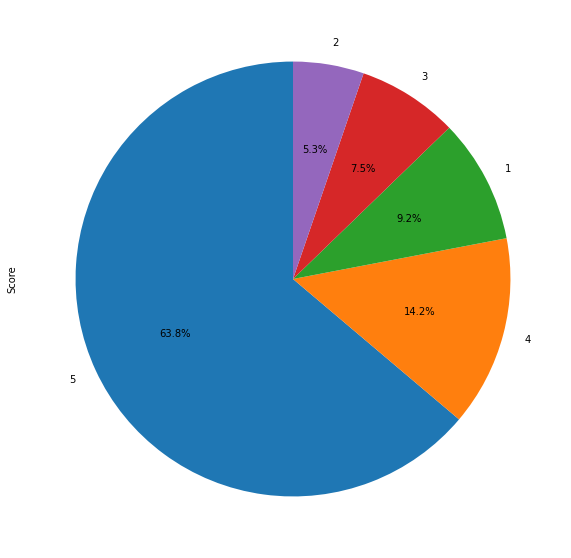

(308487, 2)


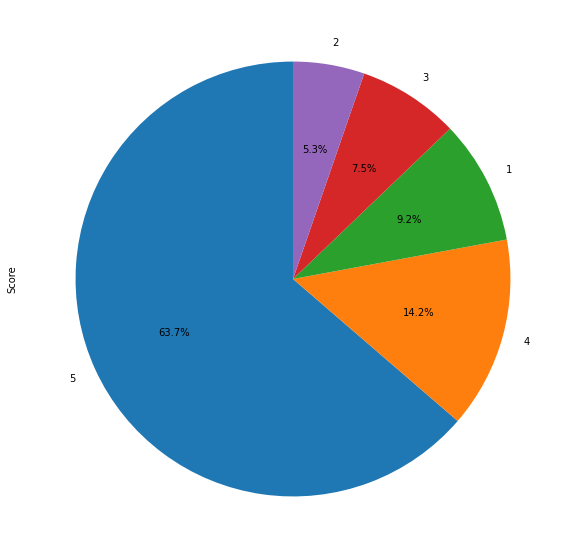

# Dropped 117853 duplicate rows

In [ ]:
print(df_cleaned.shape)

dropped_count = df_cleaned.shape[0] - df_cleaned.drop_duplicates().shape[0]

df_cleaned['Score'].value_counts().plot(
    kind='pie', autopct='%1.1f%%', startangle=90, figsize=(20, 10))

df_cleaned['Score'].value_counts().iplot(kind='bar')
plt.show()

df_cleaned.drop_duplicates(inplace=True)
print(df_cleaned.shape)
df_cleaned['Score'].value_counts().plot(
    kind='pie', autopct='%1.1f%%', startangle=90, figsize=(20, 10))
df_cleaned['Score'].value_counts().iplot(kind='bar')
plt.show()

printmd(f"# Dropped {dropped_count} duplicate rows")

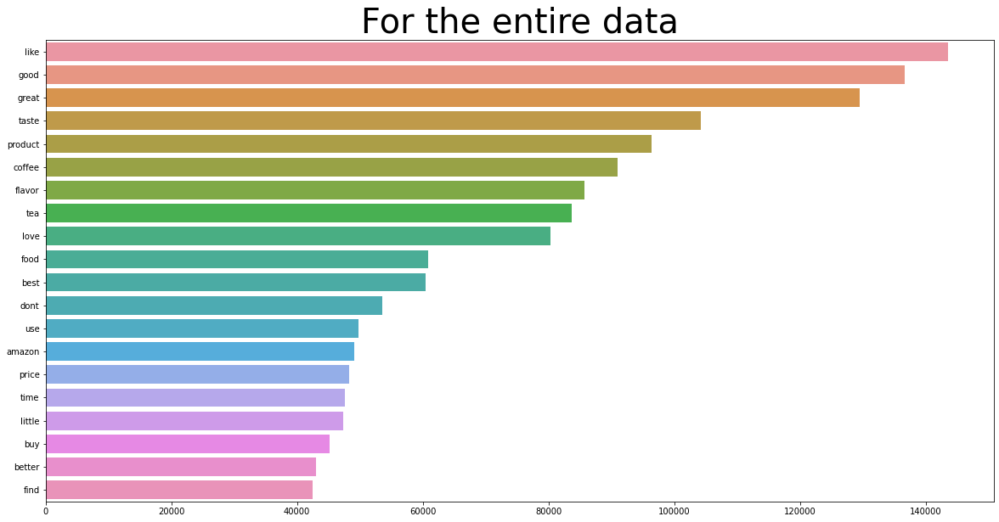

1 star reviews
28519


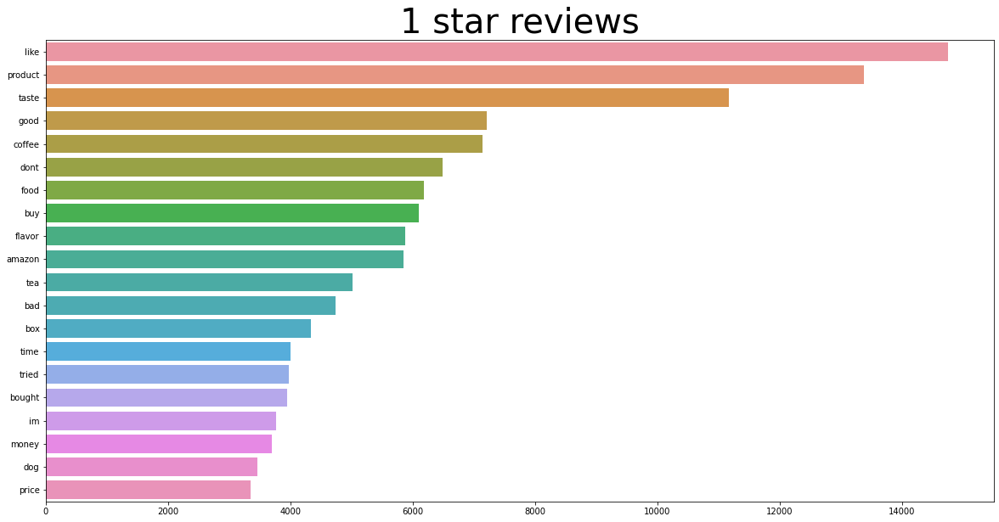

2 star reviews
16375


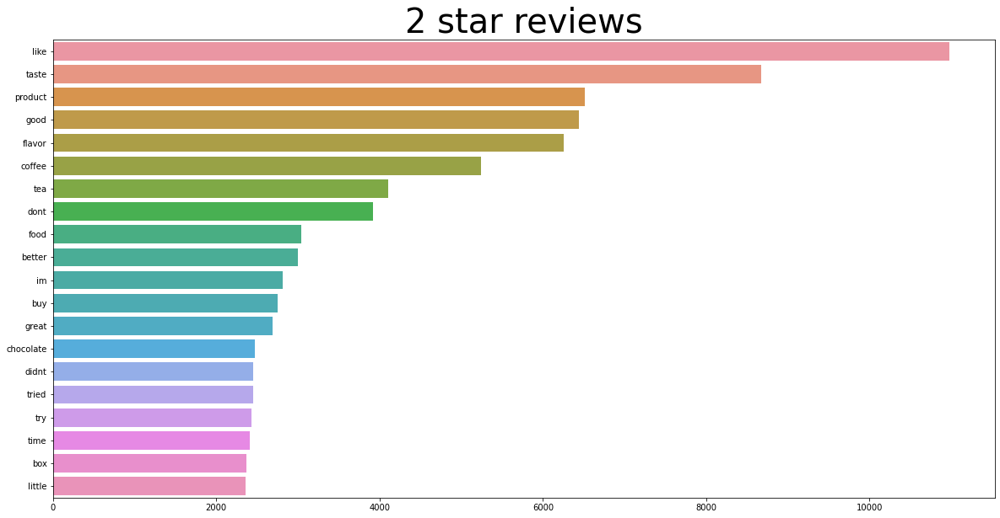

3 star reviews
23256


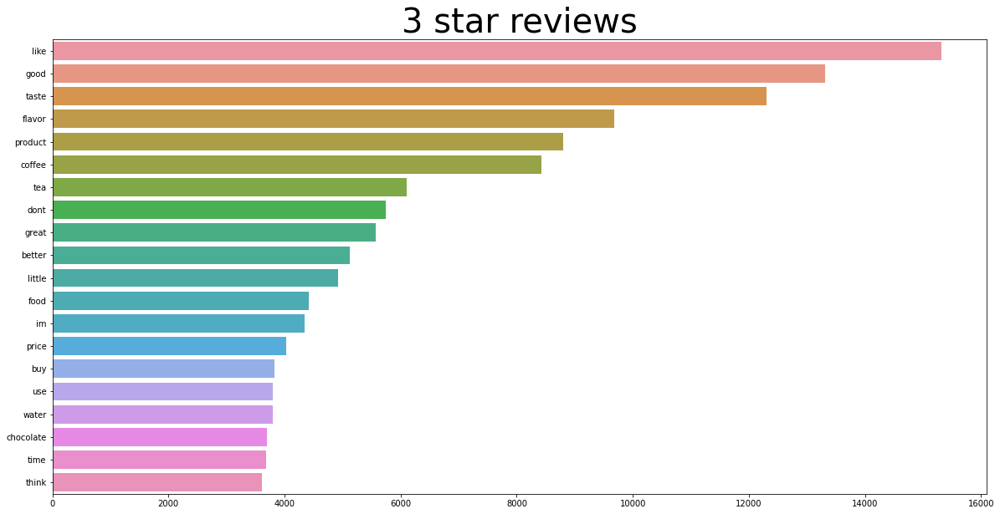

4 star reviews
43912


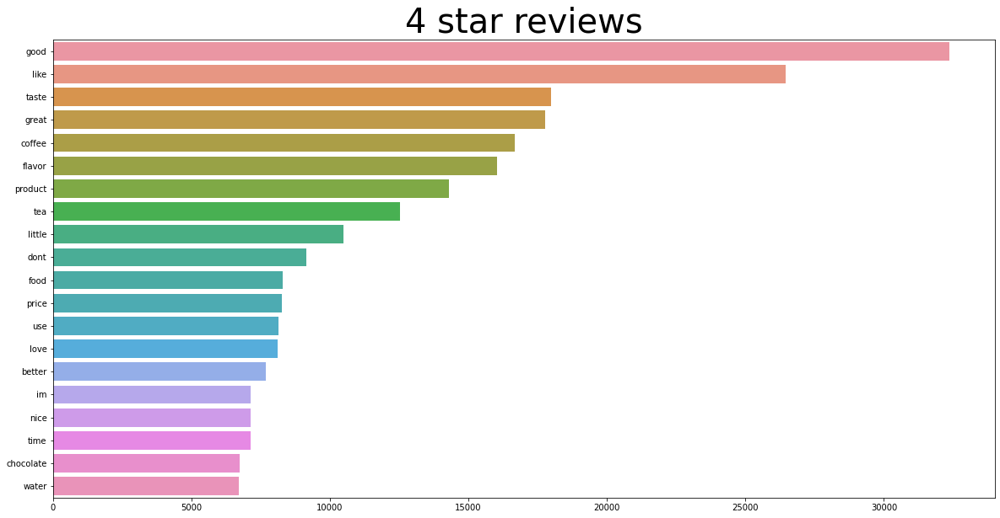

5 star reviews
196425


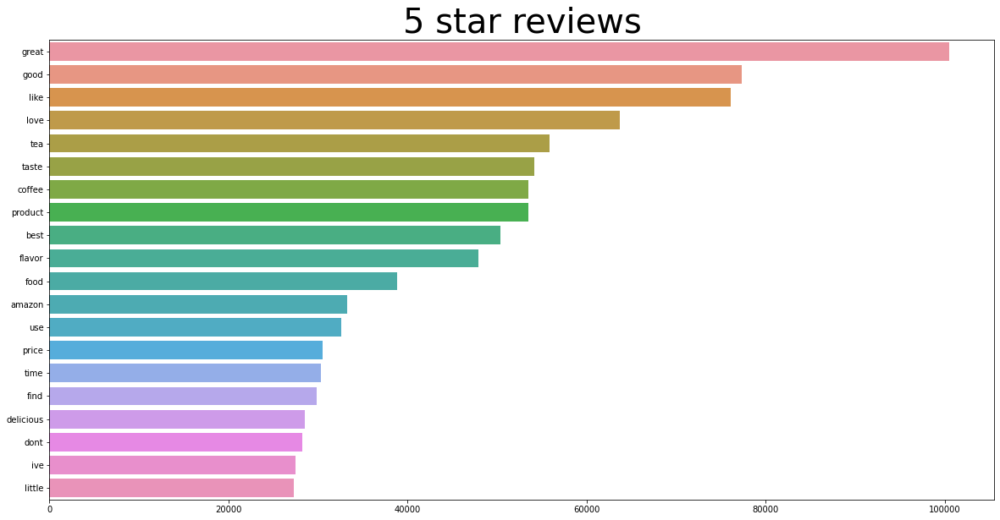

In [48]:
from collections import Counter

counter=Counter(' '.join(df_cleaned['cleaned_text'].tolist()).split())
most=counter.most_common()

x, y= [], []
for word,count in most[:20]:
    x.append(word)
    y.append(count)

plt.figure(figsize=(20, 10))
p = sns.barplot(x=y, y=x)
p.set_title("For the entire data", fontsize=40)
plt.show()

for i in range(1,6):
    print(f"{i} star reviews")
    print(df_cleaned[df_cleaned['Score']==i].shape[0])
    counter = Counter(
        ' '.join(df_cleaned[df_cleaned['Score'] == i]['cleaned_text'].tolist()).split())
    most = counter.most_common()

    x, y = [], []
    for word, count in most[:20]:
        x.append(word)
        y.append(count)

    plt.figure(figsize=(20, 10))
    p = sns.barplot(x=y, y=x)
    p.set_title(f"{i} star reviews", fontsize=40)
    plt.show()

```python
import pandas_profiling

# Perform and advanced visualisation using pandas_profiling library
pandas_profiling.ProfileReport(df_cleaned)
```

In [49]:
# Make the dataset balanced with stratification
df_balanced = df_cleaned.groupby('Score').apply(
    lambda x: x.sample(n=df_cleaned['Score'].value_counts().min()))
df_balanced = df_balanced.reset_index(drop=True)

In [50]:
df_balanced['Score'].value_counts().iplot(kind='bar')

plt.show()

```python
# make wordcloud for each score
def make_wordcloud(df, label, mask_path):
    words = ' '.join(df[df['Score'] == label]
                     ['cleaned_text'].values.astype('U'))

    mask = np.array(Image.open(f'masks/{mask_path}'))

    wordcloud = WordCloud(background_color='white',
                          mask=mask, stopwords=STOPWORDS, min_font_size=5, width=4000, height=4000, contour_color='#141414', contour_width=5).generate(words)

    # plot the WordCloud image
    plt.figure(figsize=(10, 10), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(f"Score {i}", fontsize=40)
    plt.tight_layout(pad=0)
    plt.savefig(f"wordclouds/wordcloud_score_{i}.png", dpi=1200)
    plt.show()

masks = ['pizza_mask.png', 'burger_mask.png', 'drink_mask.png', 'samosa_mask.png', 'icecream_mask.png']

for i in range(1,6):
    make_wordcloud(df, i, masks[i-1])
```

```python
normalizer = Normalizer(options='lc')

df_cleaned['l_text'] = normalizer.fit_transform(df_cleaned['cleaned_text'])

normalizer = Normalizer(options='sc')

df_cleaned['s_text'] = normalizer.fit_transform(df_cleaned['cleaned_text'])

df_cleaned.to_csv('data/preprocessed_data.csv', index=False)
```

Since the wordcloud generation is time consuming, We have saved the wordclouds in the wordclouds folder and display them below.
 
<div align='center' style='background-color: white;'>
    <img src="wordclouds/wordcloud_score_1.png" width="800">
    <img src="wordclouds/wordcloud_score_2.png" width="800">
    <img src="wordclouds/wordcloud_score_3.png" width="800">
    <img src="wordclouds/wordcloud_score_4.png" width="800">
    <img src="wordclouds/wordcloud_score_5.png" width="800">
</div>

In [51]:
df = pd.read_csv('data/preprocessed_data.csv', encoding='utf-8')

df['l_text'] = df['l_text'].astype(str)
df['s_text'] = df['s_text'].astype(str)

```python
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# sample data
df_sample = df.groupby('Score').apply(
    lambda x: x.sample(n=int(x.shape[0]*0.1)))

for vectorizer in [CountVectorizer, TfidfVectorizer]:
    vect = vectorizer()
    X = vect.fit_transform(df_sample.cleaned_text).todense()

    pca = PCA(n_components=2).fit(X)
    data2D = pca.transform(X)

    fig, ax = plt.subplots()
    fig.set_size_inches(20, 10)
    ax.set_title(f'2D PCA {vect.__class__.__name__}', fontsize=40)
    sns.scatterplot(data2D[:, 0], data2D[:, 1], hue=df_sample.Score,
                    s=100, ax=ax, legend='full', alpha=0.8)
    # set title
    fig.show()
    fig.savefig(f'{vect.__class__.__name__}_pca.png')
```

## 2D View of the given dataset representing each document in space as a vector using Count Vectorization and TfIDF Vectorization with each class separated using colours.
The CountVectorizer and TfIDF for this dataset gives vector with more than thousand dimension, where each dimension represents a token/unique word in our vocabulary. To model it in a 2-D space we used Principal Component Analysis(PCA). Pca linearly transforms each vector into 2d space. 

Since the cell above takes a long time to run, We have saved the results, and we display them below.

### 2D PCA CountVectorizer
<img src="pca_plots/CountVectorizer_pca.png" width="100%" style='background-color: white;' />

### 2D PCA TfidfVectorizer
<img src="pca_plots/TfidfVectorizer_pca.png" width="100%" style='background-color: white;' />

### 2D t-SNE CountVectorizer
<img src="data/CountVectorizer_tsne.png" width="100%" style='background-color: white;' />

### 2D t-SNE TfidfVectorizer
<img src="data/TfidfVectorizer_tsne.png" width="100%" style='background-color: white;' />


In [52]:
# sample data
df_sample = df.groupby('Score').apply(
    lambda x: x.sample(n=int(x.shape[0]*0.1)))

## 3D View of the given dataset representing each document in space as a vector using Count Vectorization with each class separated using colours.

In [14]:
# vect = CountVectorizer()
# X = vect.fit_transform(df_sample.cleaned_text).todense()

# pca = PCA(n_components=3).fit(X)
# data3D = pca.transform(X)

# np.save('data/pca_data_countvectorizer.npy', data3D)

data3D = np.load('data/pca_data_countvectorizer.npy')

def plot_3d_pca(data3D, df_sample):
    trace = go.Scatter3d(
        x=data3D[:, 0],
        y=data3D[:, 1],
        z=data3D[:, 2],
        mode='markers',
        marker=dict(
            size=10,
            color=df_sample.Score,
            colorscale='Viridis',
            opacity=0.8
        )
    )
    data = [trace]
    layout = go.Layout(
        margin=dict(
            l=0,
            r=0,
            b=0,
            t=0
        )
    )
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)


plot_3d_pca(data3D, df_sample)

##### Similar to 2-D view, the 3-D view is generated by transforming each multi-dimensional vector to 3-D space using pca
#### From the 2-D view and 3-D view of the vector space of CountVectorizer, it is clearly perceivable that it will be challenging to linearly seprate/classify the classes. 

## 3D View of the given dataset representing each document in space as a vector using TfIdf Vectorization with each class separated using colours.
The TfIdf Vectorizer for this dataset gives vector with more than thousand dimension, where each dimension represents a token/unique word in our vocabulary. To model it in a 3-D space we used Principal Component Analysis(PCA). Pca linearly transforms each vector into 3d space. 

In [15]:
# vect = TfidfVectorizer()
# X = vect.fit_transform(df_sample.cleaned_text).todense()

# pca = PCA(n_components=3).fit(X)
# data3D = pca.transform(X)

# np.save('data/pca_data_tfidfvectorizer.npy', data3D)

data3D = np.load('data/pca_data_tfidfvectorizer.npy')

def plot_3d_pca(data3D, df_sample):
    trace = go.Scatter3d(
        x=data3D[:, 0],
        y=data3D[:, 1],
        z=data3D[:, 2],
        mode='markers',
        marker=dict(
            size=10,
            color=df_sample.Score,
            colorscale='Viridis',
            opacity=0.8
        )
    )
    data = [trace]
    layout = go.Layout(
        margin=dict(
            l=0,
            r=0,
            b=0,
            t=0
        )
    )
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)


plot_3d_pca(data3D, df_sample)

#### From the 2-D view and 3-D view of the vector space of TfIdf, it is clearly perceivable that it will be challenging to linearly seprate/classify the classes. 
#### To test this for both of the vectorizers, we will be evaluating 2 linear and 2 non-linear machine learning models for Score classification

# Clustering Analysis

In [16]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn import metrics
import matplotlib.cm as cpm

# vect = TfidfVectorizer()
# X = df_sample['cleaned_text']

# X = vect.fit_transform(X).todense()

# # Using PCA to remove cols which has less co-relation
# sklearn_pca = PCA(n_components=2)
# # fit_transform() is used to scale training data to learn parameters such as
# X = sklearn_pca.fit_transform(X)

X = np.load('data/pca_data.npy')

y = df_sample['Score']

For n_clusters = 3 The average silhouette_score is : 0.8152353881599693


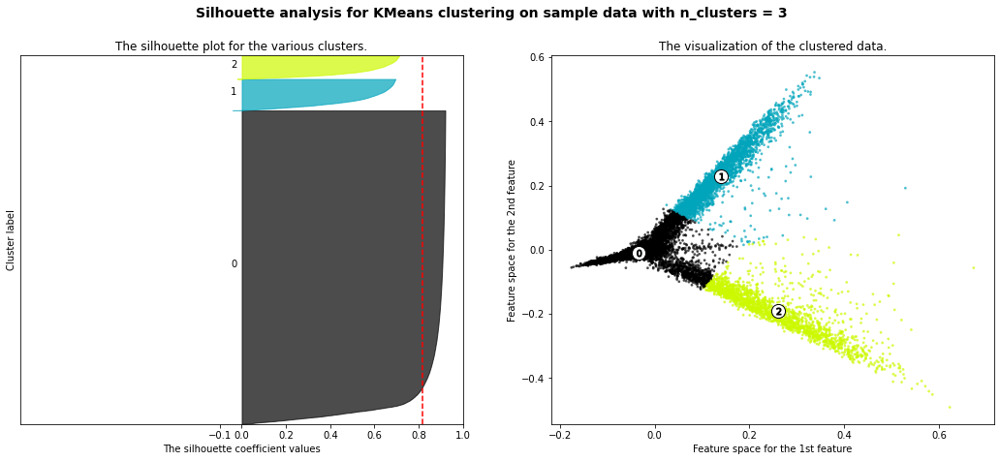

For n_clusters = 4 The average silhouette_score is : 0.7706989350407105


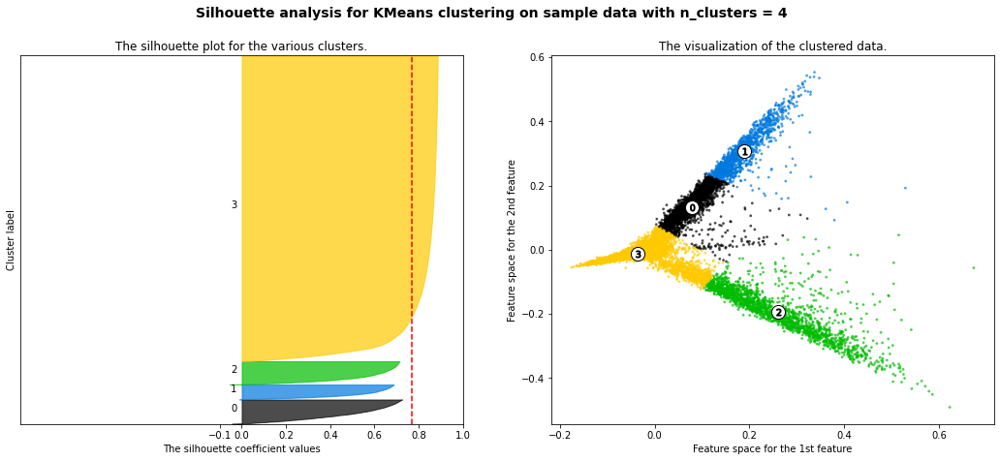

For n_clusters = 5 The average silhouette_score is : 0.7790039313823386


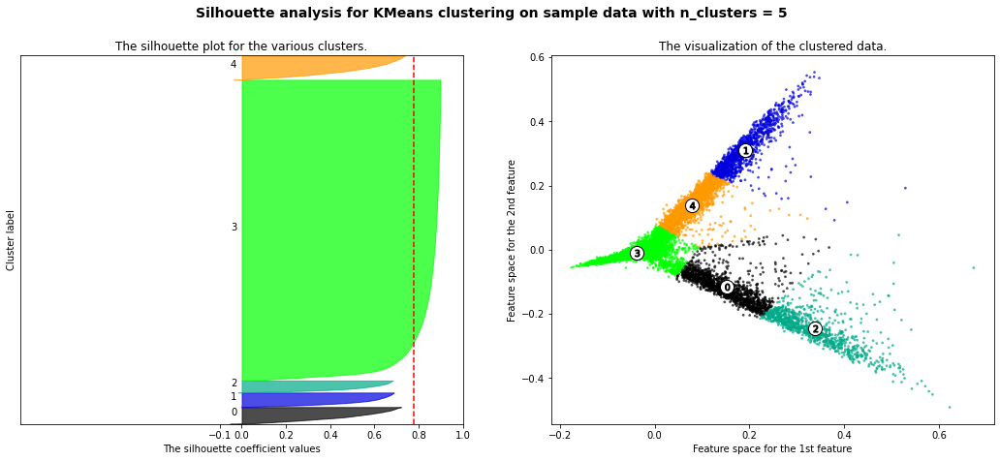

For n_clusters = 6 The average silhouette_score is : 0.46732705373173083


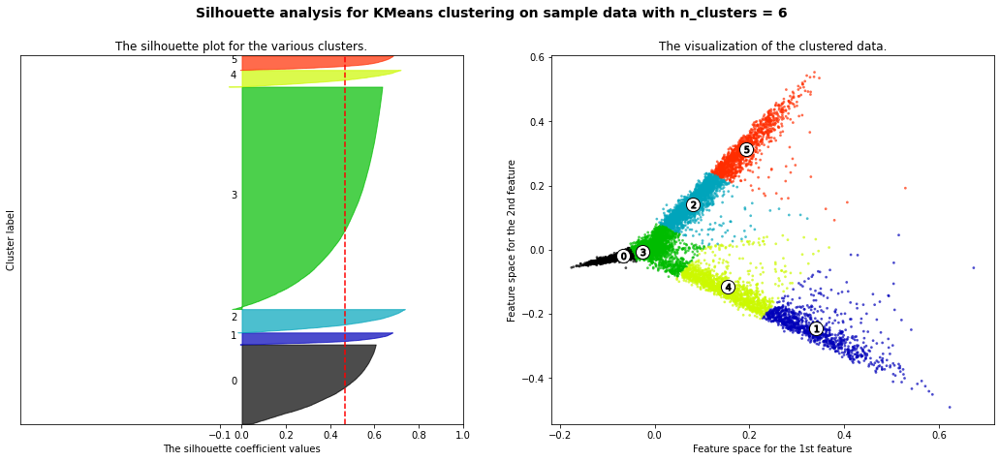

For n_clusters = 7 The average silhouette_score is : 0.48704312481390705


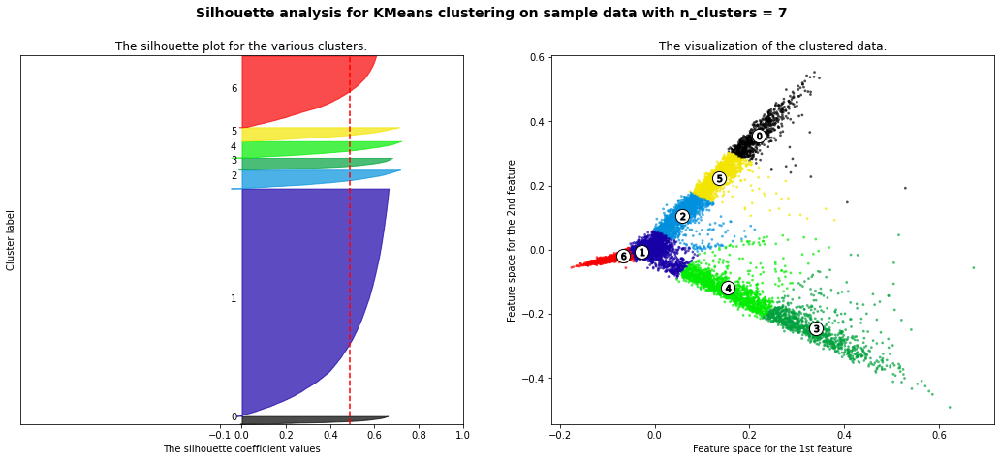

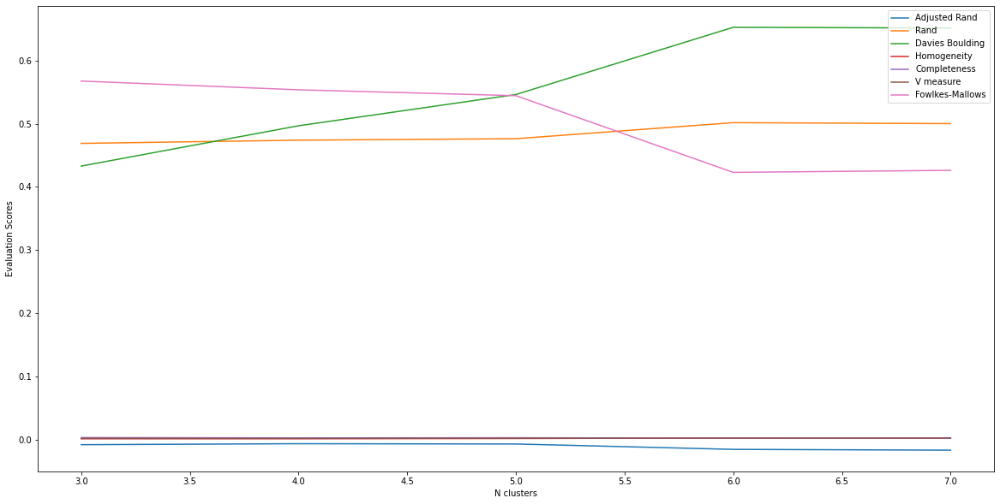

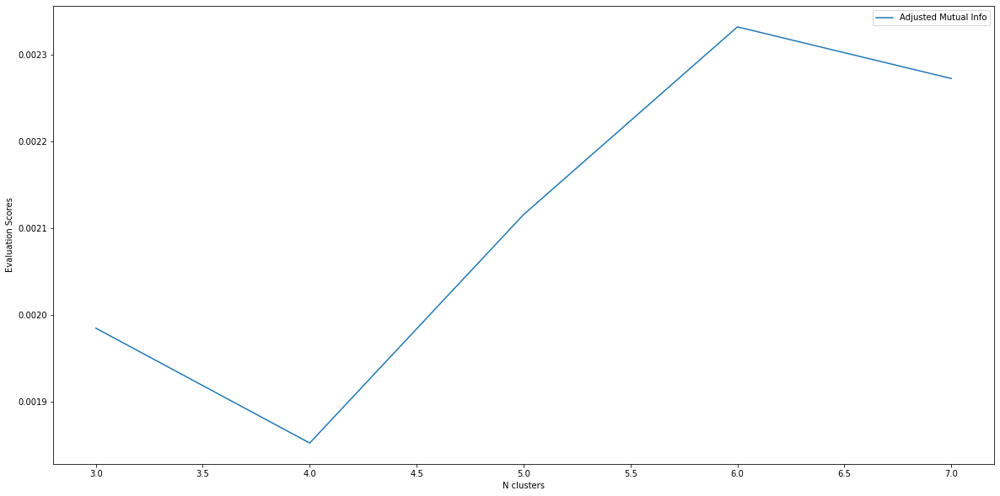

In [17]:
def kmeansSil(X):
    range_n_clusters = range(3,8)

    admi = []
    ars = []
    rs = []
    dbs = []
    homo = []
    comp = []
    vmeasure = []
    fms = []

    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=42, n_jobs=-1, init="k-means++").fit(X)
        cluster_labels = clusterer.predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)
    #     print("Adjusted Mutual Info Score:",metrics.adjusted_mutual_info_score(y, cluster_labels))
        admi.append(metrics.adjusted_mutual_info_score(
            y, cluster_labels))
    #     print("Adjusted Rand Score:",metrics.adjusted_rand_score(y, cluster_labels))
        ars.append(metrics.adjusted_rand_score(y, cluster_labels))
    #     print("Rand Score:",metrics.rand_score(y, cluster_labels))
        rs.append(metrics.rand_score(y, cluster_labels))
    #     print("Davies Bouldin Score:",metrics.davies_bouldin_score(X, cluster_labels))
        dbs.append(metrics.davies_bouldin_score(X, cluster_labels))
        hcv = metrics.homogeneity_completeness_v_measure(
            y, cluster_labels)
    #     print("Homogeneity:",hcv[0])
        homo.append(hcv[0])
    #     print("Completeness:",hcv[1])
        comp.append(hcv[1])
    #     print("V measure:",hcv[2])
        vmeasure.append(hcv[2])
    #     print("Fowlkes-Mallows scores",metrics.fowlkes_mallows_score(y, cluster_labels),'\n')
        fms.append(metrics.fowlkes_mallows_score(y, cluster_labels))

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cpm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cpm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

        plt.show()
    plt.figure(figsize=(20, 10))
    plt.plot(range_n_clusters, ars, label='Adjusted Rand')
    plt.plot(range_n_clusters, rs, label='Rand')
    plt.plot(range_n_clusters, dbs, label='Davies Boulding')
    plt.plot(range_n_clusters, homo, label='Homogeneity')
    plt.plot(range_n_clusters, comp, label='Completeness')
    plt.plot(range_n_clusters, vmeasure, label='V measure')
    plt.plot(range_n_clusters, fms, label='Fowlkes-Mallows')
    plt.xlabel('N clusters')
    plt.ylabel('Evaluation Scores')
    plt.legend(loc='upper right')
    plt.show()
    plt.figure(figsize=(20, 10))
    plt.plot(range_n_clusters, admi, label='Adjusted Mutual Info')
    plt.xlabel('N clusters')
    plt.ylabel('Evaluation Scores')
    plt.legend(loc='upper right')
    plt.show()


kmeansSil(X)

In [18]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram

def agglo(X):
    for linkages in ["ward"]:
        admi = []
        ars = []
        rs = []
        dbs = []
        homo = []
        comp = []
        vmeasure = []
        fms = []
#         Plotting clusters
        for clusters in range(3,8):
            agglo = AgglomerativeClustering(linkage=linkages, n_clusters=clusters)
            agglo.fit(X)
            y_pred = agglo.fit_predict(X)

            x_min, x_max = np.min(X, axis=0), np.max(X, axis=0)
            X_red = (X - x_min) / (x_max - x_min)

            for i in range(X_red.shape[0]):
                plt.text(
                    X_red[i, 0],
                    X_red[i, 1],
                    str('*'),
                    color=plt.cm.nipy_spectral(agglo.labels_[i] / clusters),
                    fontdict={"weight": "bold", "size": 9},
                )

            # plt.figure(figsize=(20, 10))

            plt.xticks([])
            plt.yticks([])
            plt.axis("off")
            

            plt.title((f"Agglomerative Clustering for n_clusters = {clusters} and linkage = {linkages}"), fontsize=14, fontweight='bold')
            
            plt.show()
    #             print("Adjusted Mutual Info Score:",metrics.adjusted_mutual_info_score(y, agglo.labels_))
    #             print("Adjusted Rand Score:",metrics.adjusted_rand_score(y, agglo.labels_))
    #             print("Rand Score:",metrics.rand_score(y, agglo.labels_))
    #             print("Davies Bouldin Score:",metrics.davies_bouldin_score(X, agglo.labels_))
    #             hcv = metrics.homogeneity_completeness_v_measure(y, agglo.labels_)
    #             print("Homogeneity:",hcv[0])
    #             print("Completeness:",hcv[1])
    #             print("V measure:",hcv[2])
    #             print("Fowlkes-Mallows scores",metrics.fowlkes_mallows_score(y, agglo.labels_))

            admi.append(metrics.adjusted_mutual_info_score(y, agglo.labels_))
            ars.append(metrics.adjusted_rand_score(y, agglo.labels_))
            rs.append(metrics.rand_score(y, agglo.labels_))
            dbs.append(metrics.davies_bouldin_score(X, agglo.labels_))
            hcv = metrics.homogeneity_completeness_v_measure(y, agglo.labels_)
            homo.append(hcv[0])
            comp.append(hcv[1])
            vmeasure.append(hcv[2])
            fms.append(metrics.fowlkes_mallows_score(y, agglo.labels_))
#        PLotting dendrogram 

        Z = linkage(X, linkages)
        plt.figure(figsize=(20, 10))
        plt.title('Hierarchical Clustering Dendrogram')
        plt.xlabel('Sample index')
        plt.ylabel('Distance')
        dendrogram(Z, truncate_mode='level', p=5)

        plt.suptitle((f"Dendrogram for Agglomerative clustering on sample data with linkage = {linkages}" ),
                     fontsize=14, fontweight='bold')
#         Plotting graphs for analysis   
        plt.figure(figsize=(20, 10))
        plt.plot(range(3,8), ars, label='Adjusted Rand')
        plt.plot(range(3,8), rs, label='Rand')
        plt.plot(range(3,8), dbs, label='Davies Boulding')
        plt.plot(range(3,8), homo, label='Homogeneity')
        plt.plot(range(3,8), comp, label='Completeness')
        plt.plot(range(3,8), vmeasure, label='V measure')
        plt.plot(range(3,8), fms, label='Fowlkes-Mallows')
        plt.xlabel('N clusters')
        plt.ylabel('Evaluation Scores')
        plt.legend(loc='upper right')
        plt.show()
        plt.figure(figsize=(20, 10))
        plt.plot(range(3,8), admi, label='Adjusted Mutual Info')
        plt.xlabel('N clusters')
        plt.ylabel('Evaluation Scores')
        plt.legend(loc='upper right')
        plt.show()

'''
The above code for agglomerative clustering takes a long time to run.
Hence the results for a previous run are shown below.
'''
# agglo(X)


'\nThe above code for agglomerative clustering takes a long time to run.\nHence the results for a previous run are shown below.\n'

<div align='center' style='background-color:white'>
    <img src="agglomerative/n3.png" width="60%">
    <img src="agglomerative/n4.png" width="60%">
    <img src="agglomerative/n5.png" width="60%">
    <img src="agglomerative/n6.png" width="60%">
    <img src="agglomerative/n7.png" width="60%">
    <img src="agglomerative/dendogram.png" width="100%">
    <img src="agglomerative/evaluation.png" width="80%">
    <img src="agglomerative/ami.png" width="80%">
</div>

# The following machine learning models will be trained and evaluated using 5-fold cross validation on different types of vectorization, normalization and n-grams:
##      -> Naive Bayes ----- Linear Classifier
##      -> Logistic Regression ----- Linear Classifier
##      -> Random Forest ----- Non - Linear Classifier
##      -> Support Vector Classifier(with sigmoid kernel )  ----- Non-Linear Classifier

# Training and Evaulating Machine learning Models

In [19]:
printmd("Helper functions to train and test the models")
def prockfold(dfLematized, index,model, numberOfFolds, optionsName, nGram):
    # 5 fold cross validation
    kfold = StratifiedKFold(n_splits=numberOfFolds,
                            shuffle=True, random_state=7)
    totalAccuracy = 0
    totalFScore = 0
    totalConfusion_matrix = None
    threads = []
    for train_index, test_index in kfold.split(dfLematized[index], dfLematized['Score']):
        X_train, X_test = dfLematized.iloc[train_index][index], dfLematized.iloc[test_index][index]
        y_train, y_test = dfLematized.iloc[train_index]['Score'], dfLematized.iloc[test_index]['Score']
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        totalAccuracy += accuracy_score(y_test, y_pred)
        totalFScore += f1_score(y_test, y_pred, average='macro')
        totalConfusion_matrix = totalConfusion_matrix + confusion_matrix(
            y_test, y_pred) if totalConfusion_matrix is not None else confusion_matrix(y_test, y_pred)

    fscore = totalFScore/kfold.get_n_splits()
    acc_score = totalAccuracy/kfold.get_n_splits()
    confusion_matrix_result = totalConfusion_matrix/kfold.get_n_splits()
    moddddeeell = {"accuracy": acc_score, "f1_score": fscore}

    # Save the confusion matrix np save
    with open(f"unbalanced_{model['model'].__class__.__name__}_{model['vectorizer'].__class__.__name__}_{optionsName}_{nGram}_confusion_matrix.npy", "wb") as of:
        np.save(of, confusion_matrix_result)
    # Save the file as json
    with open(f"unBalanced_{model['model'].__class__.__name__}_{model['vectorizer'].__class__.__name__}_{optionsName}_{nGram}.json", 'w') as f:
        json.dump(moddddeeell, f)

def loadModel(modelAlgoName,vectorizerName,optionsName,nGram,path):
    # Save the confusion matrix np save
    with open(f"{path}/unbalanced_{modelAlgoName}_{vectorizerName}_{optionsName}_{nGram}_confusion_matrix.npy","rb") as of:
        cM = np.load(of)
    # Save the file as json
    with open(f"{path}/unBalanced_{modelAlgoName}_{vectorizerName}_{optionsName}_{nGram}.json", 'r') as f:
        model = json.load(f)
    return model,cM
    
def prettyPrintModels(model,cM,modelAlgoName,vectorizerName,optionsName,nGram,numberOfFolds):
    printmd("## Trained and Tested  Model: " + modelAlgoName + 
            "\n\t - using " + optionsName + " for tokenization" +
            "\n\t - with " + vectorizerName + " as a vectorizer taking " + nGram + " as a single token"+
            "\n\t - without stratification on an unbalanced dataset")
    printmd("--"*10+"Results" + "--"*10)
    printmd(f"- Average Accuracy of {modelAlgoName} across {numberOfFolds}-folds = {model['accuracy']}")
    printmd(f"- Average F1-Score of {modelAlgoName} across {numberOfFolds}-folds = {model['f1_score']}")
    printmd(f"- Average Confusion Matrix of {modelAlgoName} across {numberOfFolds}-folds:")
    # print(model['confusion_matrix'])
    sns.heatmap(cM, annot=True)
    plt.show()

Helper functions to train and test the models

## Naive Bayes 
Simplest yet powerful and fastest algorithim for the given large dataset. It uses Bayes theorem to forecast membership probabilities for each class. It outputs the likelihood for a given documnent/food_review belongs to a class. The class with the highest likelihood for the document is most likely to be the class of the document. Although, Naive Bayes assumes that each word is conditionally independent and does not estimates probabilities accurately but classification is about predicting the correct class and not about precisely estimating the probabilities. Moreover, the Naive Bayes is robust to non relevant features and to changing of definition of class over time. Therefore, for a fast and low on storage baseline model for food review classification we used Naive Bayes.
https://www.researchgate.net/publication/266463703_Is_Naive_Bayes_a_Good_Classifier_for_Document_Classification confirms our choice as they conclude as one of the best and robust classifer for text compared to other machine learning models.

# Training and Evaluating Naive Bayes
During the training Naives Bayes model contructs a vocabulary and calculates probabilites of each class and probability of each word belonging to a class. This is used, to calculate the probability of a class given a word, thus predicting the class for given set of words. 
To vectorize our data we have following 2 options:
-> CountVectorizer: converts the food review into a vector that stores information of how many times each word in the vocabulary occurs in a food_review regradless of the order in which they occur.
-> TfIdf: converts food review into a vector that assigns weights by importance to each each word in the vocabulary.
For Naive Bayes CountVectorizer will be a good fit as it needs the count for each word in the food review to calculate probabilities and CountVectorizer is known to be better for probabilistics methods. Moreover, TfIDF will not be useful as importance wont be useful to calcualte the probabilities.

Will run the tests and evaluate the vectorization method.

```python
numberOfFolds = 5
processes = []
# To compare vectorizers
pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(1, 1))),
    ('model', MultinomialNB())
])

p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram'))
processes.append(p)
p.start()threading.Thread

# To compare vectorizers
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(1, 1))),
    ('model', MultinomialNB())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram'))
processes.append(p)
p.start()

# To compare Normalization techniques
pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(1, 1))),
    ('model', MultinomialNB())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 's_text', pipeline, numberOfFolds, 'Stemming', 'Unigram'))
processes.append(p)
p.start()

# To compare n-grams
pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(2, 2))),
    ('model', MultinomialNB())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Bigram'))
processes.append(p)
p.start()

pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(3, 3))),
    ('model', MultinomialNB())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Trigram'))
processes.append(p)
p.start()

pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(1, 2))),
    ('model', MultinomialNB())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram and Bigram'))
processes.append(p)
p.start()

for p in processes:
    p.join()
```

In [20]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from pycm import ConfusionMatrix

models_info = []


def plot_cm(cm, options):

    header = []

    body = [[], [], [], [], []]

    accuracy_score_list = []

    f1_score_list = []

    for i, option in enumerate(options):
        modelAlgoName, vectorizerName, optionsName, nGram, numberOfFolds = option



        header.append(r"Trained and Tested  Model: " + modelAlgoName)
        body[0].append("using " + optionsName + " for tokenization")
        body[1].append("with " + vectorizerName +
                       " as a vectorizer taking " + nGram + " as a single token")
        body[2].append("without stratification on an unbalanced dataset")


        body[3].append(
            f"Average Accuracy of {modelAlgoName} across {numberOfFolds}-folds = {cm[i][1][0]['accuracy']*100:.2f}%")

        accuracy_score_list.append(cm[i][1][0]['accuracy'])

        body[4].append(
            f"Average F1-Score of {modelAlgoName} across {numberOfFolds}-folds = {cm[i][1][0]['f1_score']*100:.2f}%")

        f1_score_list.append(cm[i][1][0]['f1_score'])

    table = pd.DataFrame(body, columns=header)

    printmd(table.to_markdown())

    f, axes = plt.subplots(1, len(cm), figsize=(30, 15), sharey='row')

    for i, a in enumerate(cm):
        key, n = a
        model, cf_matrix = n
        disp = ConfusionMatrixDisplay(cf_matrix,
                                      display_labels=range(1, 6))
        disp.plot(ax=axes[i], xticks_rotation=45)
        disp.ax_.set_title(
            key + f"\nAccuracy - {model['accuracy']*100:.2f}%\nF1-Score - {model['f1_score']*100:.2f}%")
        disp.im_.colorbar.remove()
        disp.ax_.set_xlabel('')
        if i != 0:
            disp.ax_.set_ylabel('')

    f.text(0.4, 0.1, 'Predicted label', ha='left')
    plt.subplots_adjust(wspace=0.40, hspace=0.1)

    f.colorbar(disp.im_, ax=axes)
    plt.show()

    x = [f[0] for f in cm]

    # plot the accuracy and f1 score in the same graph
    plt.figure(figsize=(30, 10))
    X_axis = np.arange(len(x))
    plt.bar(X_axis-0.2, accuracy_score_list, 0.4, label='Accuracy')
    plt.bar(X_axis+0.2, f1_score_list, 0.4, label='F1 Score')
    plt.xticks(X_axis, x, rotation=90)
    plt.legend()
    plt.show()


# CountVectorizer vs TfidfVectorizer

|    | Trained and Tested  Model: MultinomialNB                              | Trained and Tested  Model: MultinomialNB                              |
|---:|:----------------------------------------------------------------------|:----------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Lematization for tokenization                                   |
|  1 | with CountVectorizer as a vectorizer taking Unigram as a single token | with TfidfVectorizer as a vectorizer taking Unigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                       |
|  3 | Average Accuracy of MultinomialNB across 5-folds = 69.24%             | Average Accuracy of MultinomialNB across 5-folds = 64.52%             |
|  4 | Average F1-Score of MultinomialNB across 5-folds = 44.00%             | Average F1-Score of MultinomialNB across 5-folds = 19.08%             |

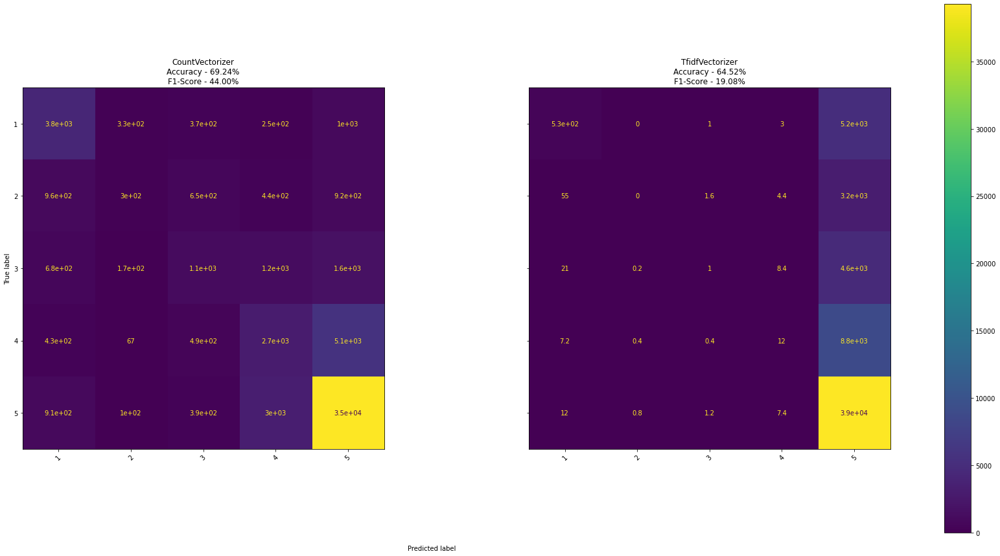

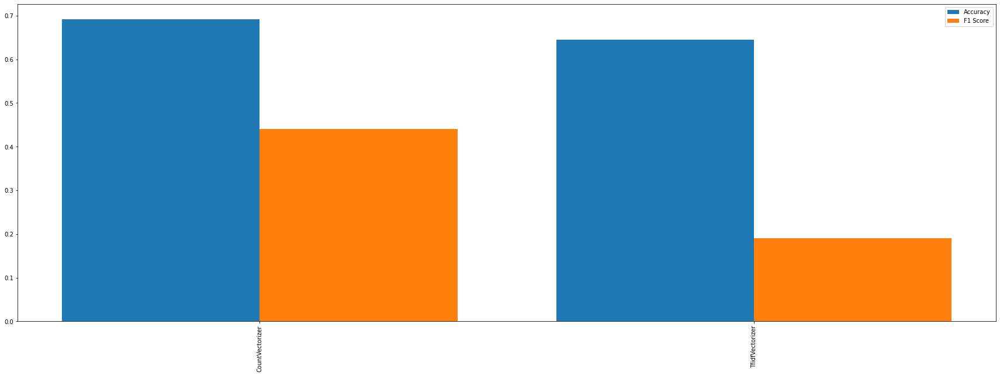

In [21]:
numberOfFolds = 5
printmd("# CountVectorizer vs TfidfVectorizer")

# Load the models
model_1,cM_1 = loadModel("MultinomialNB","CountVectorizer","Lematization","Unigram", "models/data/NB")

model_2, cM_2 = loadModel("MultinomialNB", "TfidfVectorizer",
                      "Lematization", "Unigram", "models/data/NB")


info = [
    ["MultinomialNB", "CountVectorizer", "Lematization", "Unigram", numberOfFolds],
    ["MultinomialNB", "TfidfVectorizer",
     "Lematization", "Unigram", numberOfFolds]
]

models = [
        ['CountVectorizer', (model_1,cM_1)], 
        ['TfidfVectorizer', (model_2,cM_2)]
    ]

plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


### Our reasoning is justified from the results, as the results clearly depict that Naive Bayes performed better with CountVectorizer in terms of accuracy and f1 score.

#### For Normalization we can use stemming or lemmatization or stemming followed by lemmatization or lemmatization followed by stemming. Either of these options wouldn't make a big difference on the model as the same normalization will be done on the test dataset and Naive Bayes doesn't take context into account. However, lemmatization is better for the context as it uses dictionary of known word forms from an explicit . We still tried evaluating the model using 5 fold cross validation on both of the techniques.

## Lemmatization vs Stemming

|    | Trained and Tested  Model: MultinomialNB                              | Trained and Tested  Model: MultinomialNB                              |
|---:|:----------------------------------------------------------------------|:----------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Stemming for tokenization                                       |
|  1 | with CountVectorizer as a vectorizer taking Unigram as a single token | with CountVectorizer as a vectorizer taking Unigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                       |
|  3 | Average Accuracy of MultinomialNB across 5-folds = 69.24%             | Average Accuracy of MultinomialNB across 5-folds = 69.20%             |
|  4 | Average F1-Score of MultinomialNB across 5-folds = 44.00%             | Average F1-Score of MultinomialNB across 5-folds = 44.75%             |

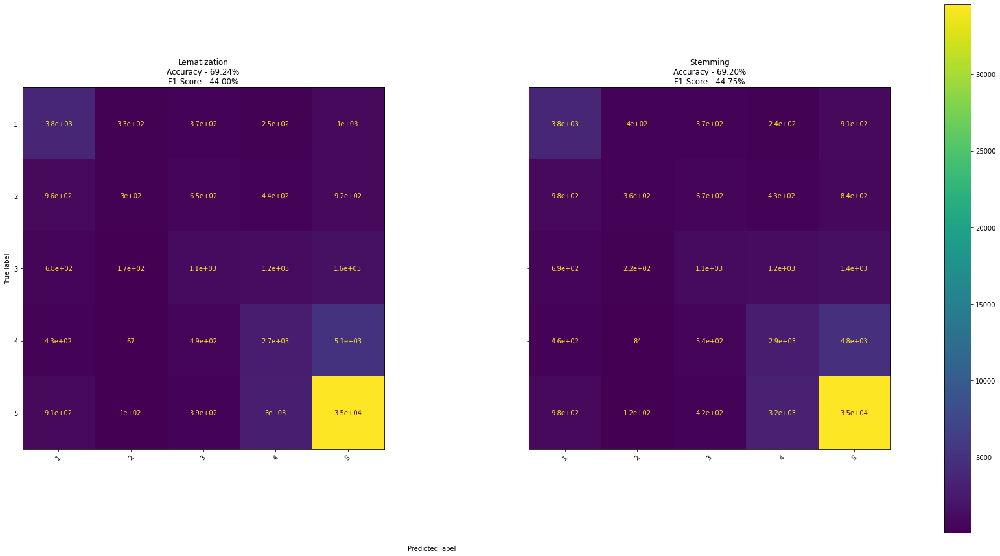

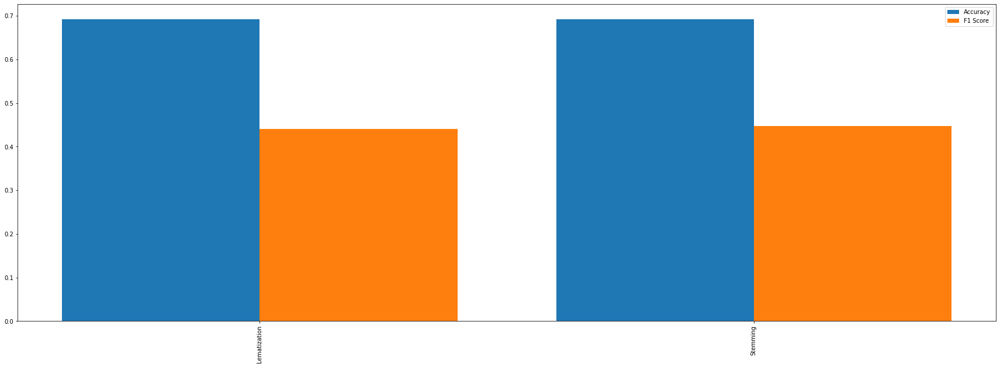

In [22]:
printmd("## Lemmatization vs Stemming")

model_1, cM_1 = loadModel("MultinomialNB", "CountVectorizer",
                      "Lematization", "Unigram", "models/data/NB")

model_2, cM_2 = loadModel("MultinomialNB", "CountVectorizer",
                      "Stemming", "Unigram", "models/data/NB")
info = [
        ["MultinomialNB", "CountVectorizer",
         "Lematization", "Unigram", numberOfFolds],
        ["MultinomialNB", "CountVectorizer",
         "Stemming", "Unigram", numberOfFolds]
    ]

models = [
        ['Lematization', (model_1, cM_1)],
        ['Stemming', (model_2, cM_2)]
    ]
plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


### Our reasoning about the normalization techniques is justtified by the results as well. From, the results it can be clearly seen that there is little no difference in performance of the model with the different normalization techniques. However, lemmatization is gives slightly better accuracy.

#### For Uni-grams Naive Bayes can classify a document based on  the presence of words like good or bad but it will lack the ability to classify a document based on negation of certain words like not good or not bad. Although, Bi-Gram and Tri-gram can capture the negation but then model needs to have extra words with a word to get the meaning like to classify 'good' it has learnt that 'good' needs to be before or after a word. This will decrease the performance of our model. Additionally, using Unigram and Bigram will effect the probability of a class given a set of tokens and thus will have similar effect like using Bi-gram or Tri-gram. We will evaluate this using 5 fold cross validation.

# N-GRAMS

|    | Trained and Tested  Model: MultinomialNB                              | Trained and Tested  Model: MultinomialNB                             | Trained and Tested  Model: MultinomialNB                              | Trained and Tested  Model: MultinomialNB                                         |
|---:|:----------------------------------------------------------------------|:---------------------------------------------------------------------|:----------------------------------------------------------------------|:---------------------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Lematization for tokenization                                  | using Lematization for tokenization                                   | using Lematization for tokenization                                              |
|  1 | with CountVectorizer as a vectorizer taking Unigram as a single token | with CountVectorizer as a vectorizer taking Bigram as a single token | with CountVectorizer as a vectorizer taking Trigram as a single token | with CountVectorizer as a vectorizer taking Unigram and Bigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                      | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                                  |
|  3 | Average Accuracy of MultinomialNB across 5-folds = 69.24%             | Average Accuracy of MultinomialNB across 5-folds = 67.31%            | Average Accuracy of MultinomialNB across 5-folds = 66.09%             | Average Accuracy of MultinomialNB across 5-folds = 66.88%                        |
|  4 | Average F1-Score of MultinomialNB across 5-folds = 44.00%             | Average F1-Score of MultinomialNB across 5-folds = 28.96%            | Average F1-Score of MultinomialNB across 5-folds = 27.56%             | Average F1-Score of MultinomialNB across 5-folds = 26.91%                        |

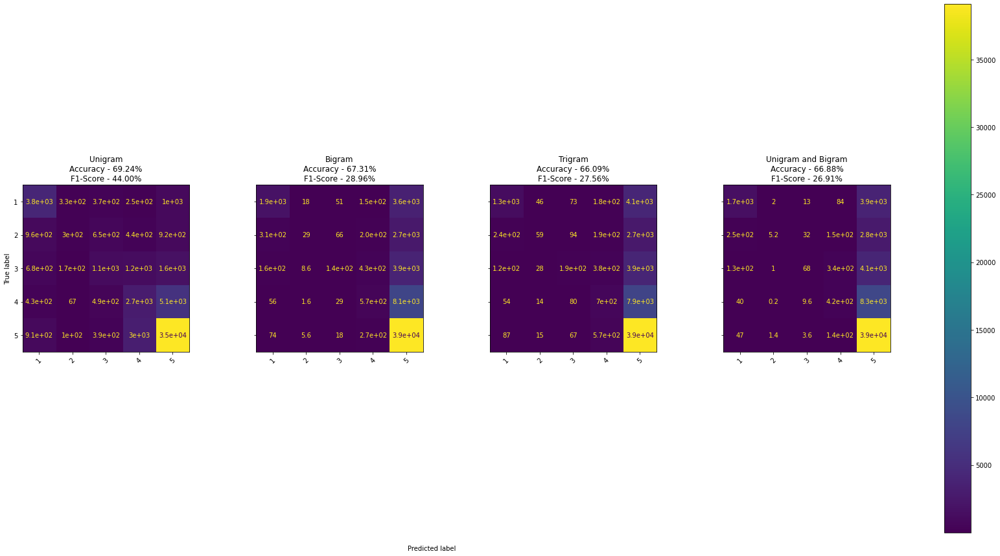

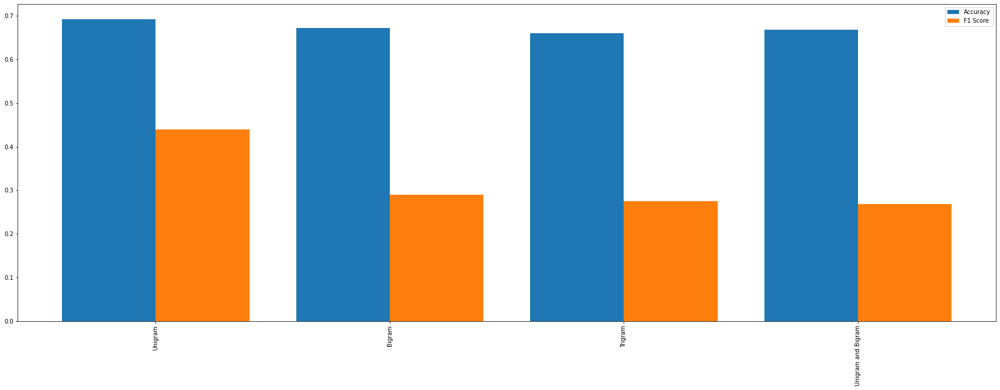

In [23]:
printmd("# N-GRAMS")

model_1, cM_1 = loadModel("MultinomialNB", "CountVectorizer",
                      "Lematization", "Unigram", "models/data/NB")

model_2, cM_2 = loadModel("MultinomialNB", "CountVectorizer",
                      "Lematization", "Bigram", "models/data/NB")

model_3, cM_3 = loadModel("MultinomialNB", "CountVectorizer",
                      "Lematization", "Trigram", "models/data/NB")

model_4, cM_4 = loadModel("MultinomialNB", "CountVectorizer",
                      "Lematization", "Unigram and Bigram", "models/data/NB")

info = [
        ["MultinomialNB", "CountVectorizer",
         "Lematization", "Unigram", numberOfFolds],
        ["MultinomialNB", "CountVectorizer",
         "Lematization", "Bigram", numberOfFolds],
        ["MultinomialNB", "CountVectorizer",
         "Lematization", "Trigram", numberOfFolds],
        ["MultinomialNB", "CountVectorizer",
         "Lematization", "Unigram and Bigram", numberOfFolds]
    ]

models = [
        ['Unigram', (model_1, cM_1)],
        ['Bigram', (model_2, cM_2)],
        ['Trigram', (model_3, cM_3)],
        ['Unigram and Bigram', (model_4, cM_4)]
    ]

plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


### As we can clerly see from the results, Naive Bayes has the best accuracy and F1-score using Uni-grams, thus confirming our reasoning.
#### Among all the combinations Naive Bayes:
##      -> Multinomial Naive Bayes trained on vectors from Count Vectorizer with Unigram extracted from lemmatized food reviews.

# Logistic Regression

```python
numberOfFolds = 5
processes = []
# To compare vectorizers
pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(1, 1))),
    ('model', LogisticRegression())
])

p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram'))
processes.append(p)
p.start()threading.Thread

# To compare vectorizers
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(1, 1))),
    ('model', LogisticRegression())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram'))
processes.append(p)
p.start()

# To compare Normalization techniques
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(1, 1))),
    ('model', LogisticRegression())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 's_text', pipeline, numberOfFolds, 'Stemming', 'Unigram'))
processes.append(p)
p.start()

# To compare n-grams
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(2, 2))),
    ('model', LogisticRegression())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Bigram'))
processes.append(p)
p.start()

pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(3, 3))),
    ('model', LogisticRegression())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Trigram'))
processes.append(p)
p.start()

pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(1, 2))),
    ('model', LogisticRegression())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram and Bigram'))
processes.append(p)
p.start()

for p in processes:
    p.join()
```

# CountVectorizer vs TfidfVectorizer

|    | Trained and Tested  Model: LogisticRegression                         | Trained and Tested  Model: LogisticRegression                         |
|---:|:----------------------------------------------------------------------|:----------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Lematization for tokenization                                   |
|  1 | with CountVectorizer as a vectorizer taking Unigram as a single token | with TfidfVectorizer as a vectorizer taking Unigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                       |
|  3 | Average Accuracy of LogisticRegression across 5-folds = 68.07%        | Average Accuracy of LogisticRegression across 5-folds = 68.09%        |
|  4 | Average F1-Score of LogisticRegression across 5-folds = 44.50%        | Average F1-Score of LogisticRegression across 5-folds = 44.65%        |

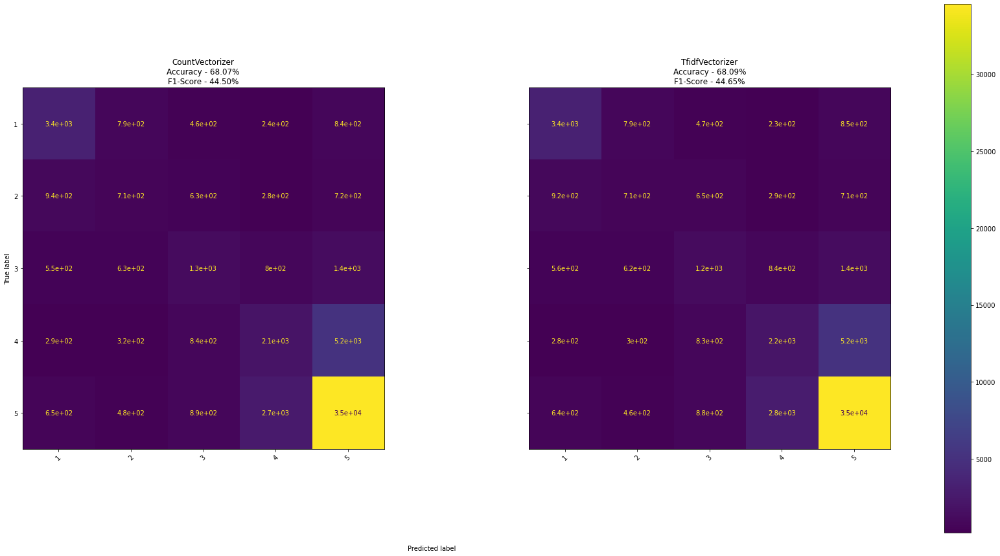

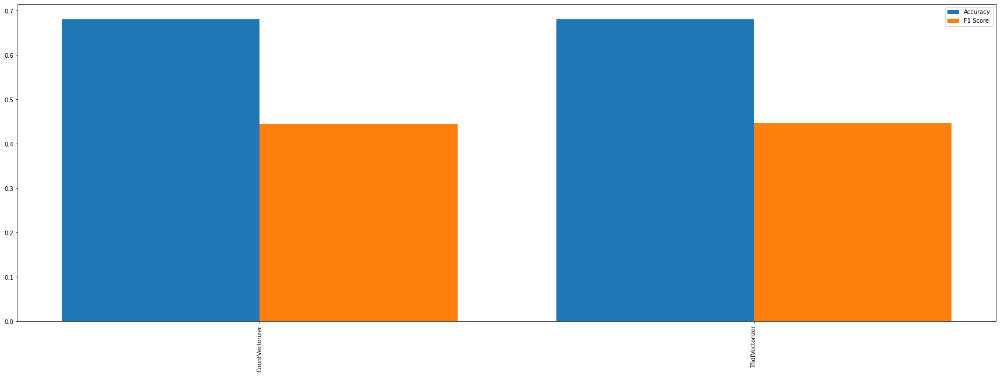

In [24]:
numberOfFolds = 5

printmd("# CountVectorizer vs TfidfVectorizer")

# Load the models
model_1, cM_1 = loadModel("LogisticRegression", "CountVectorizer",
                      "Lematization", "Unigram", "models/data/LR")
model_2, cM_2 = loadModel("LogisticRegression", "TfidfVectorizer",
                      "Lematization", "Unigram", "models/data/LR")

info = [
    ["LogisticRegression", "CountVectorizer",
     "Lematization", "Unigram", numberOfFolds],
    ["LogisticRegression", "TfidfVectorizer",
     "Lematization", "Unigram", numberOfFolds]
]

models = [
        ['CountVectorizer', (model_1, cM_1)],
        ['TfidfVectorizer', (model_2, cM_2)]
    ]

plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


## Lemmatization vs Stemming

|    | Trained and Tested  Model: LogisticRegression                         | Trained and Tested  Model: LogisticRegression                         |
|---:|:----------------------------------------------------------------------|:----------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Stemming for tokenization                                       |
|  1 | with TfidfVectorizer as a vectorizer taking Unigram as a single token | with TfidfVectorizer as a vectorizer taking Unigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                       |
|  3 | Average Accuracy of LogisticRegression across 5-folds = 68.09%        | Average Accuracy of LogisticRegression across 5-folds = 69.33%        |
|  4 | Average F1-Score of LogisticRegression across 5-folds = 44.65%        | Average F1-Score of LogisticRegression across 5-folds = 45.69%        |

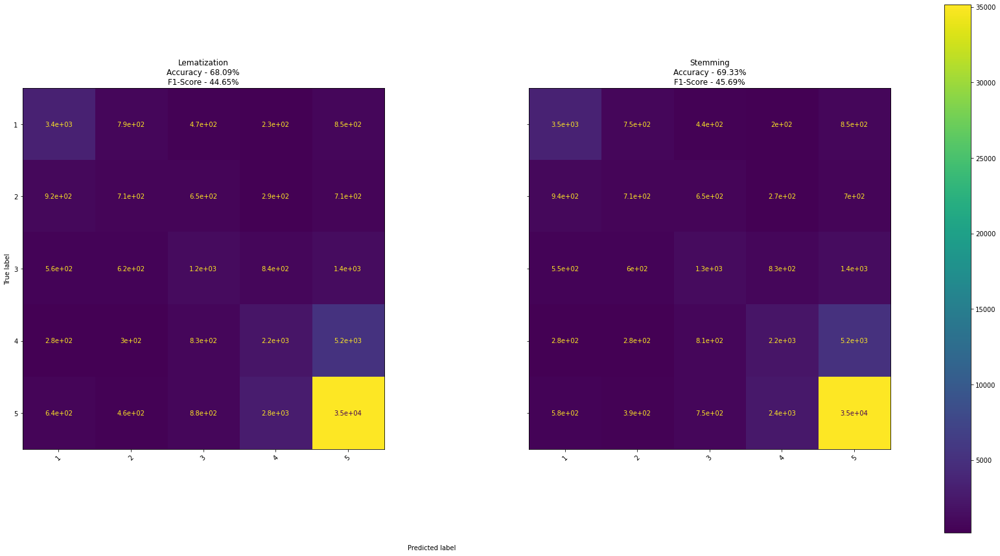

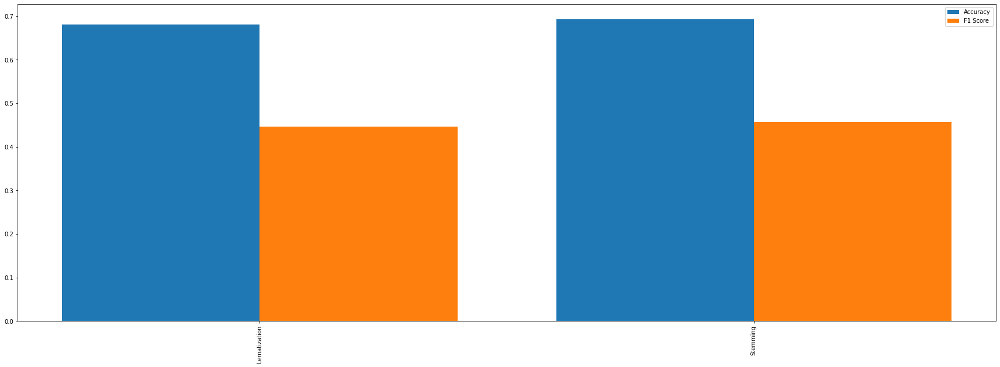

In [25]:
printmd("## Lemmatization vs Stemming")

model_1, cM_1 = loadModel("LogisticRegression", "TfidfVectorizer",
                      "Lematization", "Unigram", "models/data/LR")

model_2, cM_2 = loadModel("LogisticRegression", "TfidfVectorizer",
                      "Stemming", "Unigram", "models/data/LR")

info = [
        ["LogisticRegression", "TfidfVectorizer",
         "Lematization", "Unigram", numberOfFolds],
        ["LogisticRegression", "TfidfVectorizer",
         "Stemming", "Unigram", numberOfFolds]
    ]

models = [
        ['Lematization', (model_1, cM_1)],
        ['Stemming', (model_2, cM_2)]
    ]

plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


# N-GRAMS

|    | Trained and Tested  Model: LogisticRegression                         | Trained and Tested  Model: LogisticRegression                        | Trained and Tested  Model: LogisticRegression                         | Trained and Tested  Model: LogisticRegression                                    |
|---:|:----------------------------------------------------------------------|:---------------------------------------------------------------------|:----------------------------------------------------------------------|:---------------------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Lematization for tokenization                                  | using Lematization for tokenization                                   | using Lematization for tokenization                                              |
|  1 | with TfidfVectorizer as a vectorizer taking Unigram as a single token | with TfidfVectorizer as a vectorizer taking Bigram as a single token | with TfidfVectorizer as a vectorizer taking Trigram as a single token | with TfidfVectorizer as a vectorizer taking Unigram and Bigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                      | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                                  |
|  3 | Average Accuracy of LogisticRegression across 5-folds = 68.09%        | Average Accuracy of LogisticRegression across 5-folds = 68.51%       | Average Accuracy of LogisticRegression across 5-folds = 61.49%        | Average Accuracy of LogisticRegression across 5-folds = 70.77%                   |
|  4 | Average F1-Score of LogisticRegression across 5-folds = 44.65%        | Average F1-Score of LogisticRegression across 5-folds = 43.82%       | Average F1-Score of LogisticRegression across 5-folds = 34.33%        | Average F1-Score of LogisticRegression across 5-folds = 48.09%                   |

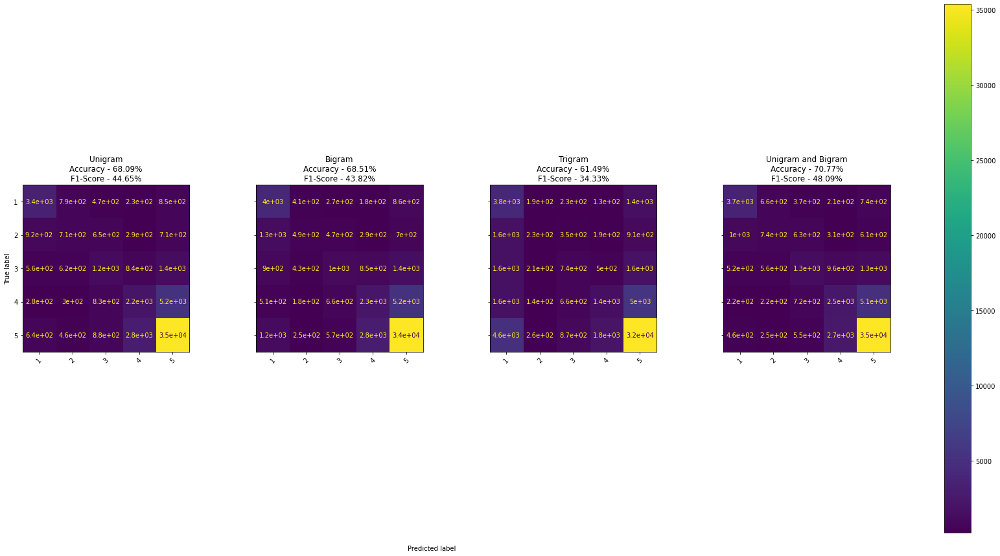

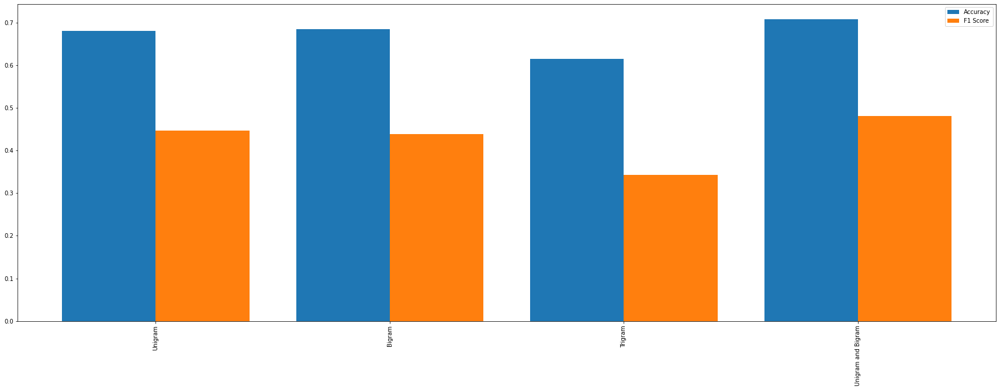

In [26]:
printmd("# N-GRAMS")

model_1, cM_1 = loadModel("LogisticRegression", "TfidfVectorizer",
                      "Lematization", "Unigram", "models/data/LR")

model_2, cM_2 = loadModel("LogisticRegression", "TfidfVectorizer",
                      "Lematization", "Bigram", "models/data/LR")

model_3, cM_3 = loadModel("LogisticRegression", "TfidfVectorizer",
                      "Lematization", "Trigram", "models/data/LR")

model_4, cM_4 = loadModel("LogisticRegression", "TfidfVectorizer",
                      "Lematization", "Unigram and Bigram", "models/data/LR")

info = [
        ["LogisticRegression", "TfidfVectorizer",
            "Lematization", "Unigram", numberOfFolds],
        ["LogisticRegression", "TfidfVectorizer",
            "Lematization", "Bigram", numberOfFolds],
        ["LogisticRegression", "TfidfVectorizer",
            "Lematization", "Trigram", numberOfFolds],
        ["LogisticRegression", "TfidfVectorizer",
            "Lematization", "Unigram and Bigram", numberOfFolds]
    ]

models = [
        ['Unigram', (model_1, cM_1)],
        ['Bigram', (model_2, cM_2)],
        ['Trigram', (model_3, cM_3)],
        ['Unigram and Bigram', (model_4, cM_4)]
    ]
plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


# Random Forest Classifier

```python
numberOfFolds = 5
processes = []
# To compare vectorizers
pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(1, 1))),
    ('model', RandomForestClassifier())
])

p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram'))
processes.append(p)
p.start()threading.Thread

# To compare vectorizers
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(1, 1))),
    ('model', RandomForestClassifier())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram'))
processes.append(p)
p.start()

# To compare Normalization techniques
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(1, 1))),
    ('model', RandomForestClassifier())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 's_text', pipeline, numberOfFolds, 'Stemming', 'Unigram'))
processes.append(p)
p.start()

# To compare n-grams
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(2, 2))),
    ('model', RandomForestClassifier())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Bigram'))
processes.append(p)
p.start()

pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(3, 3))),
    ('model', RandomForestClassifier())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Trigram'))
processes.append(p)
p.start()

pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(1, 2))),
    ('model', RandomForestClassifier())
])
p = threading.Thread(target=prockfold, args=(
    dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram and Bigram'))
processes.append(p)
p.start()

for p in processes:
    p.join()
```

# CountVectorizer vs TfidfVectorizer

|    | Trained and Tested  Model: RandomForestClassifier                     | Trained and Tested  Model: RandomForestClassifier                     |
|---:|:----------------------------------------------------------------------|:----------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Lematization for tokenization                                   |
|  1 | with CountVectorizer as a vectorizer taking Unigram as a single token | with TfidfVectorizer as a vectorizer taking Unigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                       |
|  3 | Average Accuracy of RandomForestClassifier across 5-folds = 63.71%    | Average Accuracy of RandomForestClassifier across 5-folds = 63.70%    |
|  4 | Average F1-Score of RandomForestClassifier across 5-folds = 15.70%    | Average F1-Score of RandomForestClassifier across 5-folds = 15.66%    |

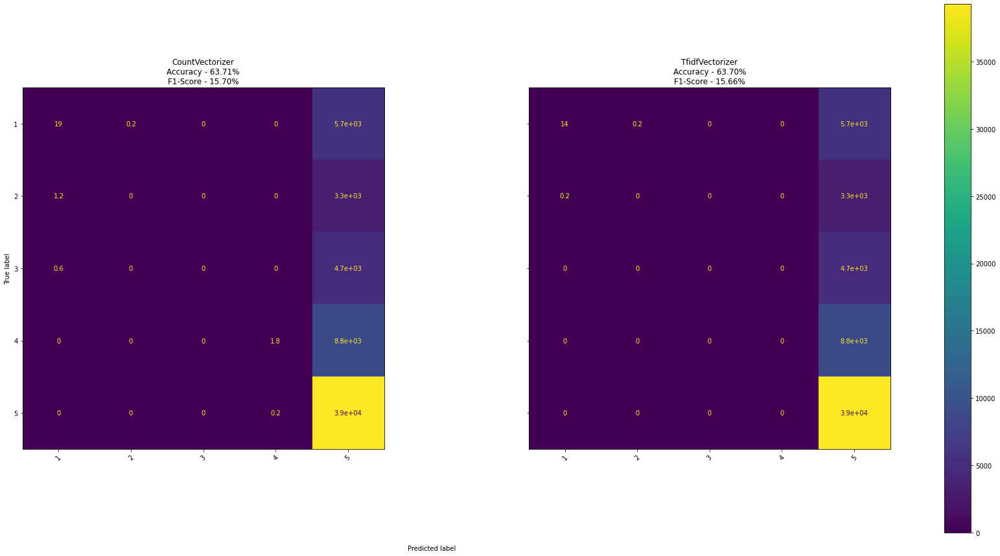

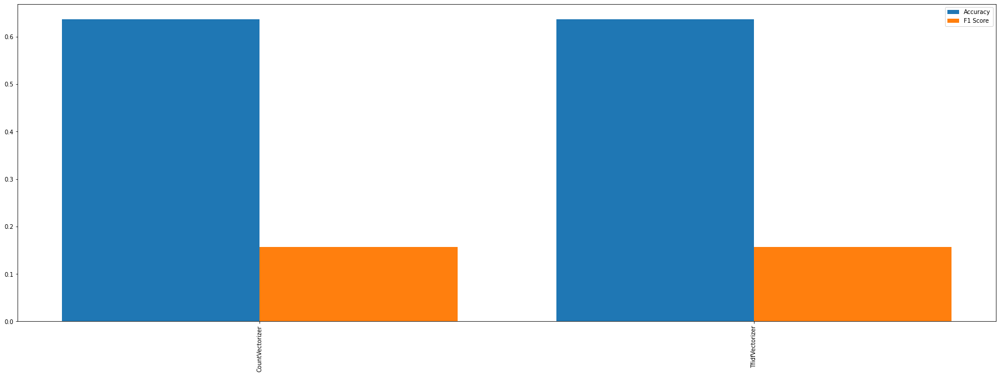

In [27]:
numberOfFolds = 5

printmd("# CountVectorizer vs TfidfVectorizer")

# Load the models
model_1, cM_1 = loadModel("RandomForestClassifier", "CountVectorizer",
                      "Lematization", "Unigram", "models/data/RF")

model_2, cM_2 = loadModel("RandomForestClassifier", "TfidfVectorizer",
                      "Lematization", "Unigram", "models/data/RF")

info = [
        ["RandomForestClassifier", "CountVectorizer",
         "Lematization", "Unigram", numberOfFolds],
        ["RandomForestClassifier", "TfidfVectorizer",
         "Lematization", "Unigram", numberOfFolds]
    ]

models = [
        ['CountVectorizer', (model_1, cM_1)],
        ['TfidfVectorizer', (model_2, cM_2)]
    ]

plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


# LEMMATIZATION vs STEMMING

|    | Trained and Tested  Model: RandomForestClassifier                     | Trained and Tested  Model: RandomForestClassifier                     |
|---:|:----------------------------------------------------------------------|:----------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Stemming for tokenization                                       |
|  1 | with TfidfVectorizer as a vectorizer taking Unigram as a single token | with TfidfVectorizer as a vectorizer taking Unigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                       |
|  3 | Average Accuracy of RandomForestClassifier across 5-folds = 63.70%    | Average Accuracy of RandomForestClassifier across 5-folds = 63.73%    |
|  4 | Average F1-Score of RandomForestClassifier across 5-folds = 15.66%    | Average F1-Score of RandomForestClassifier across 5-folds = 15.80%    |

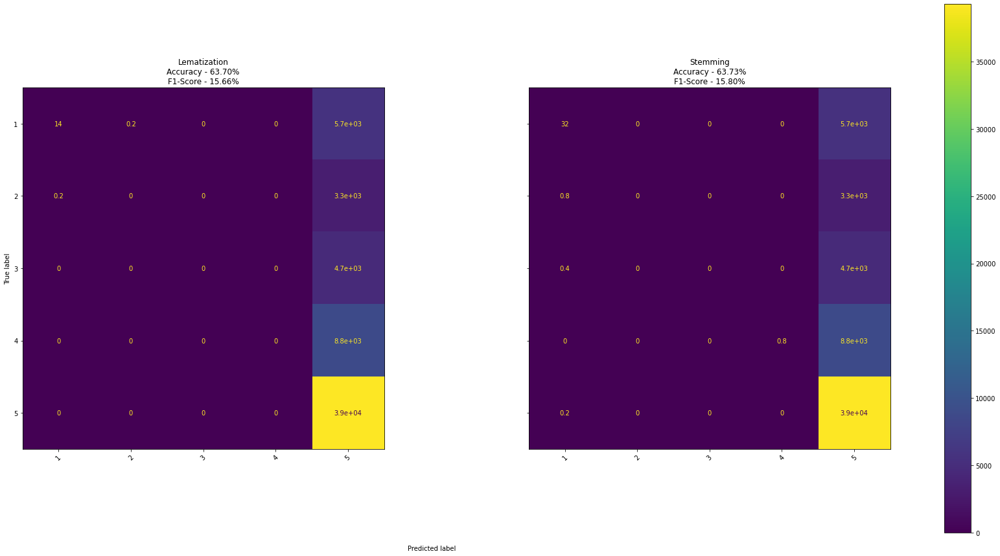

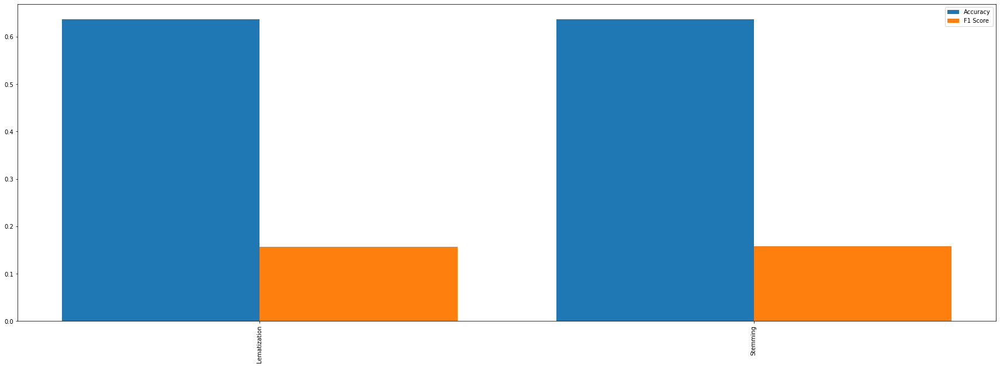

In [28]:
printmd("# LEMMATIZATION vs STEMMING")

model_1, cM_1= loadModel("RandomForestClassifier", "TfidfVectorizer",
                      "Lematization", "Unigram", "models/data/RF")

model_2, cM_2 = loadModel("RandomForestClassifier", "TfidfVectorizer",
                      "Stemming", "Unigram", "models/data/RF")
info = [
        ["RandomForestClassifier", "TfidfVectorizer",
         "Lematization", "Unigram", numberOfFolds],
        ["RandomForestClassifier", "TfidfVectorizer",
         "Stemming", "Unigram", numberOfFolds]
    ]

models = [
        ['Lematization', (model_1, cM_1)],
        ['Stemming', (model_2, cM_2)]
    ]
plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


# N-GRAMS

|    | Trained and Tested  Model: RandomForestClassifier                     | Trained and Tested  Model: RandomForestClassifier                    | Trained and Tested  Model: RandomForestClassifier                     | Trained and Tested  Model: RandomForestClassifier                                |
|---:|:----------------------------------------------------------------------|:---------------------------------------------------------------------|:----------------------------------------------------------------------|:---------------------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Lematization for tokenization                                  | using Lematization for tokenization                                   | using Lematization for tokenization                                              |
|  1 | with TfidfVectorizer as a vectorizer taking Unigram as a single token | with TfidfVectorizer as a vectorizer taking Bigram as a single token | with TfidfVectorizer as a vectorizer taking Trigram as a single token | with TfidfVectorizer as a vectorizer taking Unigram and Bigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                      | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                                  |
|  3 | Average Accuracy of RandomForestClassifier across 5-folds = 63.70%    | Average Accuracy of RandomForestClassifier across 5-folds = 63.67%   | Average Accuracy of RandomForestClassifier across 5-folds = 63.68%    | Average Accuracy of RandomForestClassifier across 5-folds = 63.67%               |
|  4 | Average F1-Score of RandomForestClassifier across 5-folds = 15.66%    | Average F1-Score of RandomForestClassifier across 5-folds = 15.56%   | Average F1-Score of RandomForestClassifier across 5-folds = 15.59%    | Average F1-Score of RandomForestClassifier across 5-folds = 15.56%               |

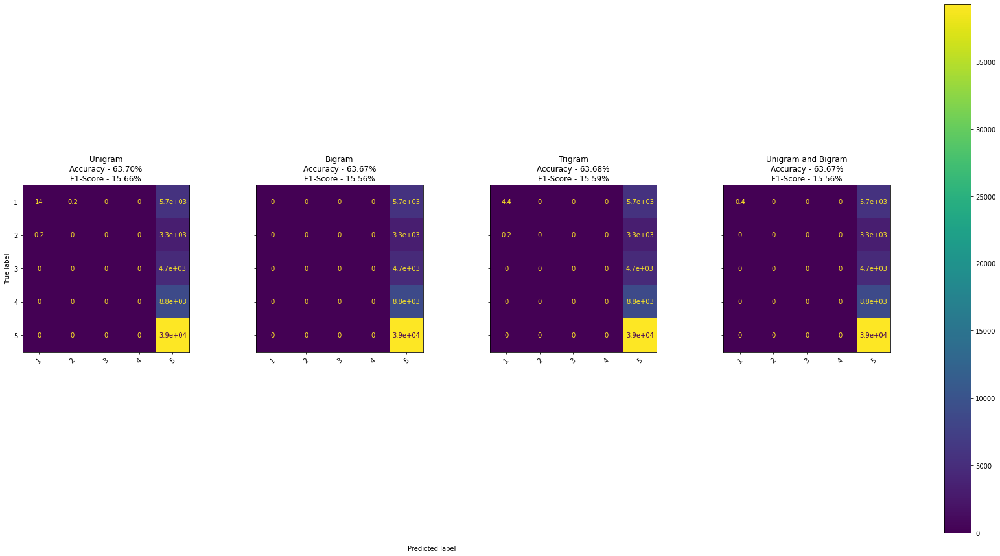

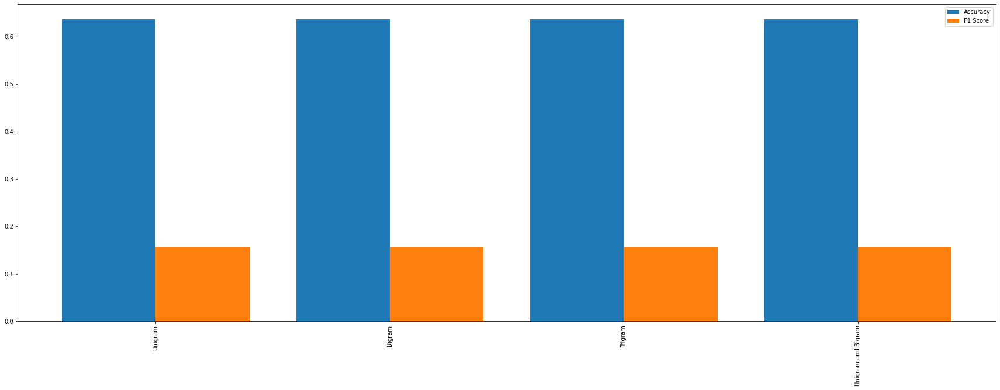

In [29]:
printmd("# N-GRAMS")

model_1, cM_1 = loadModel("RandomForestClassifier", "TfidfVectorizer",
                      "Lematization", "Unigram", "models/data/RF")

model_2, cM_2 = loadModel("RandomForestClassifier", "TfidfVectorizer",
                      "Lematization", "Bigram", "models/data/RF")

model_3, cM_3 = loadModel("RandomForestClassifier", "TfidfVectorizer",
                      "Lematization", "Trigram", "models/data/RF")

model_4, cM_4 = loadModel("RandomForestClassifier", "TfidfVectorizer",
                      "Lematization", "Unigram and Bigram", "models/data/RF")
info = [
        ["RandomForestClassifier", "TfidfVectorizer",
            "Lematization", "Unigram", numberOfFolds],
        ["RandomForestClassifier", "TfidfVectorizer",
            "Lematization", "Bigram", numberOfFolds],
        ["RandomForestClassifier", "TfidfVectorizer",
            "Lematization", "Trigram", numberOfFolds],
        ["RandomForestClassifier", "TfidfVectorizer",
            "Lematization", "Unigram and Bigram", numberOfFolds]
    ]

models = [
        ['Unigram', (model_1, cM_1)],
        ['Bigram', (model_2, cM_2)],
        ['Trigram', (model_3, cM_3)],
        ['Unigram and Bigram', (model_4, cM_4)]
    ]
plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


# SVC

SVC is a non linear classifier that classifies by creating a decision boundary. It creates a decision boundary by maximizing the distance from the nearest data points of all classes. To make it non linear SVC uses kernel trick to increase the dimension of the vector space only for calculation by doing non linear transformation.

## Training and Evaluating SVC

During training, SVC tries to learn the best decision boundary for the given dataset. So, it takes a lot of time for large dataset like ours. Upon reaserching, it was found that the SVC wih sigmoid kernel is optimal for the given dataset. The SVC was trained on evaluated on different techniques of vectorization, normalization and n-_gram for the tokenization using 5-fold cross validation. It took more than 72 hours to evalautes each combination as our dataset was huge. 

```python
numberOfFolds = 5
processes = []
# To compare vectorizers
pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(1, 1))),
    ('model', SVC(kernel="sigmoid",gamma="scale", tol=0.1))
])

p = multiprocessing.Process(target=prockfold, args=(dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram'))
processes.append(p)
p.start()

# To compare vectorizers
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer(ngram_range=(1, 1))),
    ('model', SVC(kernel="sigmoid",gamma="scale", tol=0.1))
])
p = multiprocessing.Process(target=prockfold, args=(dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram'))
processes.append(p)
p.start()

# To compare Normalization techniques
pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(1, 1))),
    ('model', SVC(kernel="sigmoid",gamma="scale", tol=0.1))
])
p = multiprocessing.Process(target=prockfold, args=(dfLematized, 's_text', pipeline, numberOfFolds, 'Stemming', 'Unigram'))
processes.append(p)
p.start()

# To compare n-grams
pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(2, 2))),
    ('model', SVC(kernel="sigmoid",gamma="scale", tol=0.1))
])
p = multiprocessing.Process(target=prockfold, args=(dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Bigram'))
processes.append(p)
p.start()

pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(3, 3))),
    ('model', SVC(kernel="sigmoid",gamma="scale", tol=0.1))
])
p = multiprocessing.Process(target=prockfold, args=(dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Trigram'))
processes.append(p)
p.start()

pipeline = Pipeline([
    ('vectorizer', CountVectorizer(ngram_range=(1, 2))),
    ('model', SVC(kernel="sigmoid",gamma="scale", tol=0.1))
])
p = multiprocessing.Process(target=prockfold, args=(dfLematized, 'l_text', pipeline, numberOfFolds, 'Lematization', 'Unigram and Bigram'))
processes.append(p)
p.start()

for p in processes:
    p.join()
```

## Evaluating vectorization techniques:
###   -> CountVectorizer vs TfIdf Vectorizer
TfIdf represents a token based on its importance of the token in a given document. This will aid SVC as it will seperate 2 documents on a same token/dimension based on the importance of the token in that document/vector. To Evaluate this, we display the results of SVC trained on both the techniques.

# CountVectorizer vs TfidfVectorizer

|    | Trained and Tested  Model: SVC                                        | Trained and Tested  Model: SVC                                        |
|---:|:----------------------------------------------------------------------|:----------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Lematization for tokenization                                   |
|  1 | with CountVectorizer as a vectorizer taking Unigram as a single token | with TfidfVectorizer as a vectorizer taking Unigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                       |
|  3 | Average Accuracy of SVC across 5-folds = 59.43%                       | Average Accuracy of SVC across 5-folds = 70.83%                       |
|  4 | Average F1-Score of SVC across 5-folds = 27.69%                       | Average F1-Score of SVC across 5-folds = 46.33%                       |

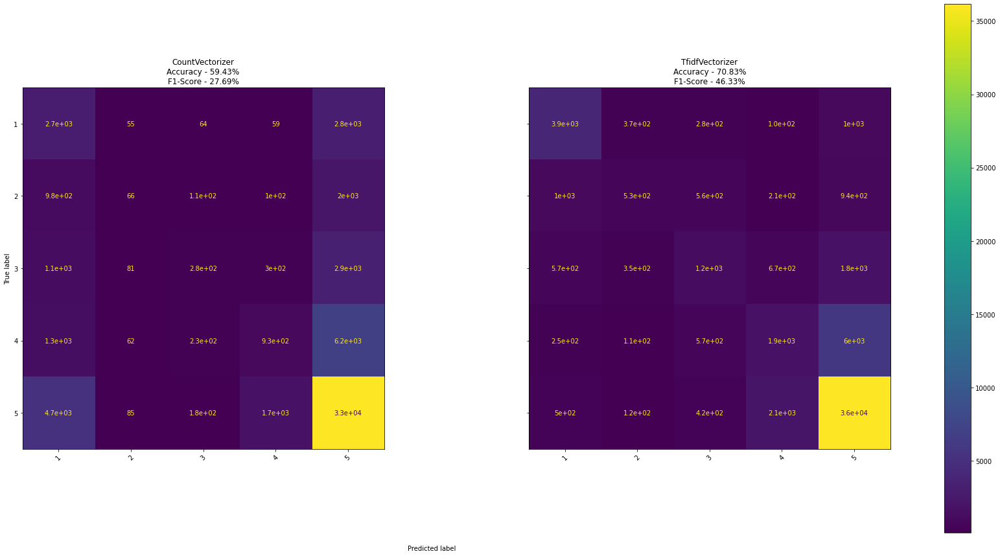

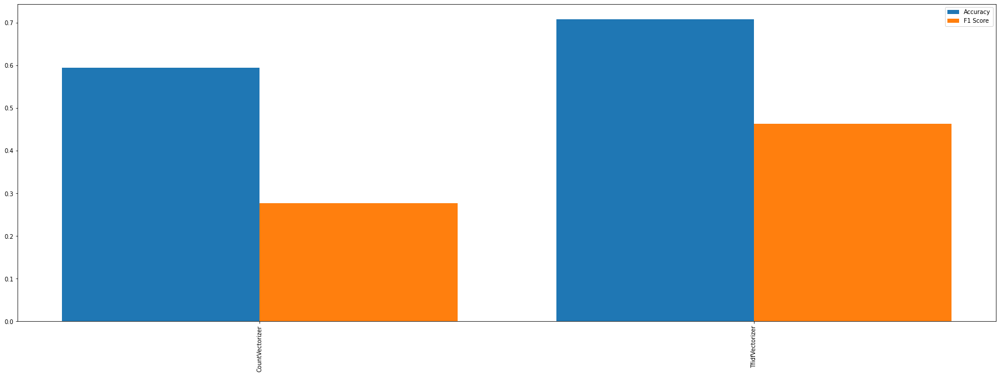

In [30]:
numberOfFolds = 5

printmd("# CountVectorizer vs TfidfVectorizer")

# Load the models
model_1, cM_1 = loadModel("SVC", "CountVectorizer",
                          "Lematization", "Unigram", "models/data/SVC")
model_2, cM_2 = loadModel("SVC", "TfidfVectorizer",
                          "Lematization", "Unigram", "models/data/SVC")
info = [
        ["SVC", "CountVectorizer",
         "Lematization", "Unigram", numberOfFolds],
        ["SVC", "TfidfVectorizer",
         "Lematization", "Unigram", numberOfFolds]
    ]

models = [
        ['CountVectorizer', (model_1, cM_1)],
        ['TfidfVectorizer', (model_2, cM_2)]
    ]

plot_cm(
    models,
    info
)

models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


## Evaluating normalization techniques:
###   -> Stemming vs Lemmatization
Either of these options wouldn't make a big difference on the model as the same normalization will be done on the test dataset and SVC doesn't take context into account. However, lemmatization is better for the context as it uses explict and human enginerred dictionary of known word forms. We still evaluated the model using 5 fold cross validation on both of the techniques to find an optimal one

## Evaluating on different n_gram for tokenization:
###   -> Uni-gram vs Bi-gram vs Tri-gram vs Uni-gram + Bi-gram
#### Similar to other models, For Uni-grams SVC can classify a document based on  the presence of words like good or bad but it will lack the ability to classify a document based on negation of certain words like not good or not bad. Although, Bi-Gram and Tri-gram can capture the negation but then model needs to have extra words with a word to get the meaning like to classify 'good' it has learnt that 'good' needs to be before or after a word. This will decrease the performance of our model. Additionally, using Unigram and Bigram will effect the probability of a class given a set of tokens and thus will have similar effect like using Bi-gram or Tri-gram. We will evaluated this using 5 fold cross validation.

# N-GRAMS

|    | Trained and Tested  Model: SVC                                        | Trained and Tested  Model: SVC                                       | Trained and Tested  Model: SVC                                        | Trained and Tested  Model: SVC                                                   |
|---:|:----------------------------------------------------------------------|:---------------------------------------------------------------------|:----------------------------------------------------------------------|:---------------------------------------------------------------------------------|
|  0 | using Lematization for tokenization                                   | using Lematization for tokenization                                  | using Lematization for tokenization                                   | using Lematization for tokenization                                              |
|  1 | with TfidfVectorizer as a vectorizer taking Unigram as a single token | with TfidfVectorizer as a vectorizer taking Bigram as a single token | with TfidfVectorizer as a vectorizer taking Trigram as a single token | with TfidfVectorizer as a vectorizer taking Unigram and Bigram as a single token |
|  2 | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                      | without stratification on an unbalanced dataset                       | without stratification on an unbalanced dataset                                  |
|  3 | Average Accuracy of SVC across 5-folds = 70.83%                       | Average Accuracy of SVC across 5-folds = 70.96%                      | Average Accuracy of SVC across 5-folds = 63.68%                       | Average Accuracy of SVC across 5-folds = 63.67%                                  |
|  4 | Average F1-Score of SVC across 5-folds = 46.33%                       | Average F1-Score of SVC across 5-folds = 46.68%                      | Average F1-Score of SVC across 5-folds = 15.59%                       | Average F1-Score of SVC across 5-folds = 15.56%                                  |

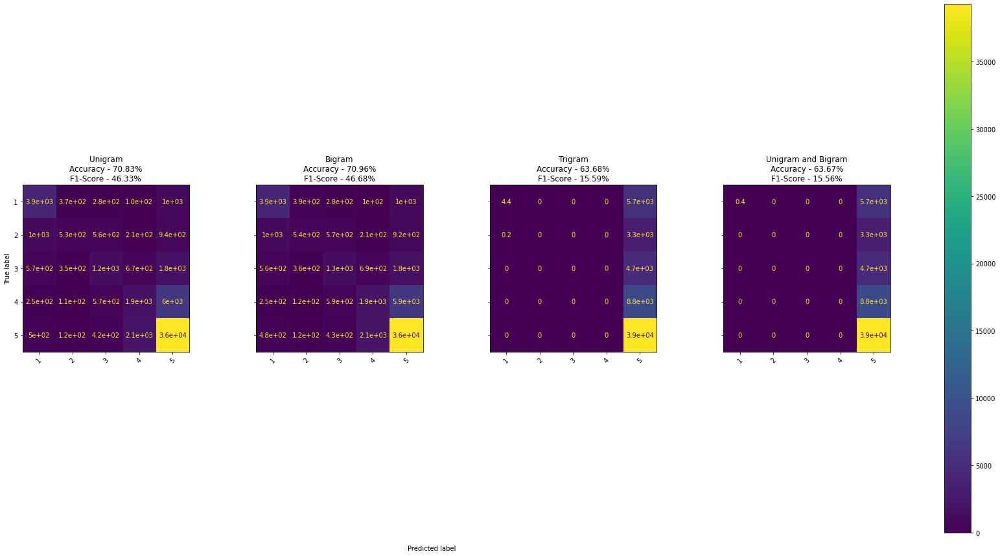

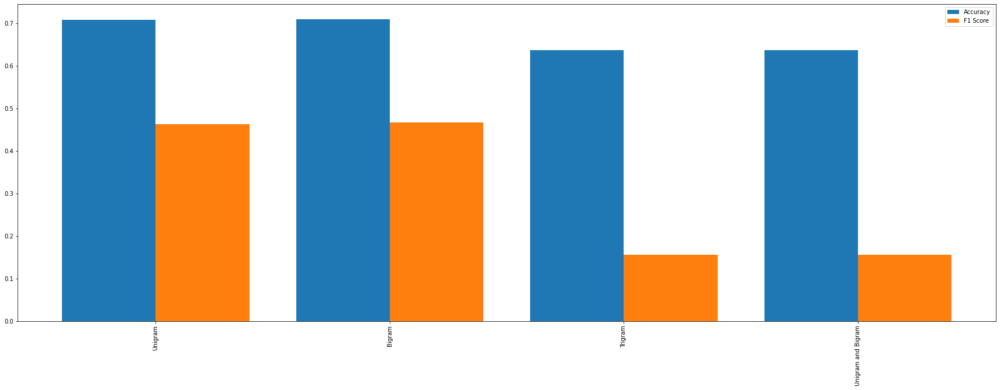

In [33]:
numberOfFolds = 5

printmd("# N-GRAMS")

# Load the models
model_1, cM_1 = loadModel("SVC", "TfidfVectorizer",
                          "Lematization", "Unigram", "models/data/SVC")
# model_2, cM_2 = loadModel("SVC", "TfidfVectorizer",
#                           "Lematization", "Bigram", "models/data/SVC")
# model_3, cM_3 = loadModel("SVC", "TfidfVectorizer",
#                           "Lematization", "Trigram", "models/data/SVC")
# model_4, cM_4=loadModel("SVC", "TfidfVectorizer",
#                         "Lematization", "Unigram and Bigram", "models/data/SVC")
info = [
    ["SVC", "TfidfVectorizer",
     "Lematization", "Unigram", numberOfFolds],
    ["SVC", "TfidfVectorizer",
     "Lematization", "Bigram", numberOfFolds],
    ["SVC", "TfidfVectorizer",
     "Lematization", "Trigram", numberOfFolds],
    ["SVC", "TfidfVectorizer",
     "Lematization", "Unigram and Bigram", numberOfFolds]
]

models = [
        ['Unigram', (model_1, cM_1)],
        ['Bigram', (model_2, cM_2)],
        ['Trigram', (model_3, cM_3)],
        ['Unigram and Bigram', (model_4, cM_4)]
    ]
plot_cm(
    models,
    info
)


models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                   [1][0]['f1_score']] for i, x in enumerate(info)])


In [34]:
models_df = pd.DataFrame(models_info, columns=["model", "vectorizer",
                                                  "lemmatization", "ngram", "numberOfFolds", "accuracy", "f1_score"])

models_df.drop_duplicates(inplace=True)

In [35]:
models_df.sort_values(by=["f1_score"], ascending=False, inplace=True)
models_df.reset_index(drop=True, inplace=True)

In [36]:
printmd(models_df.to_markdown())

|    | model                  | vectorizer      | lemmatization   | ngram              |   numberOfFolds |   accuracy |   f1_score |
|---:|:-----------------------|:----------------|:----------------|:-------------------|----------------:|-----------:|-----------:|
|  0 | LogisticRegression     | TfidfVectorizer | Lematization    | Unigram and Bigram |               5 |   0.707732 |   0.480877 |
|  1 | SVC                    | TfidfVectorizer | Stemming        | Unigram            |               5 |   0.709647 |   0.466782 |
|  2 | SVC                    | TfidfVectorizer | Lematization    | Bigram             |               5 |   0.709647 |   0.466782 |
|  3 | SVC                    | TfidfVectorizer | Lematization    | Unigram            |               5 |   0.70825  |   0.463258 |
|  4 | LogisticRegression     | TfidfVectorizer | Stemming        | Unigram            |               5 |   0.693271 |   0.456862 |
|  5 | MultinomialNB          | CountVectorizer | Stemming        | Unigram            |               5 |   0.692042 |   0.447514 |
|  6 | LogisticRegression     | TfidfVectorizer | Lematization    | Unigram            |               5 |   0.680888 |   0.446481 |
|  7 | LogisticRegression     | CountVectorizer | Lematization    | Unigram            |               5 |   0.68069  |   0.44503  |
|  8 | MultinomialNB          | CountVectorizer | Lematization    | Unigram            |               5 |   0.692405 |   0.440018 |
|  9 | LogisticRegression     | TfidfVectorizer | Lematization    | Bigram             |               5 |   0.685066 |   0.438245 |
| 10 | LogisticRegression     | TfidfVectorizer | Lematization    | Trigram            |               5 |   0.614943 |   0.343346 |
| 11 | MultinomialNB          | CountVectorizer | Lematization    | Bigram             |               5 |   0.673075 |   0.289593 |
| 12 | SVC                    | CountVectorizer | Lematization    | Unigram            |               5 |   0.594314 |   0.27688  |
| 13 | MultinomialNB          | CountVectorizer | Lematization    | Trigram            |               5 |   0.660923 |   0.275642 |
| 14 | MultinomialNB          | CountVectorizer | Lematization    | Unigram and Bigram |               5 |   0.668787 |   0.269072 |
| 15 | MultinomialNB          | TfidfVectorizer | Lematization    | Unigram            |               5 |   0.64521  |   0.190771 |
| 16 | RandomForestClassifier | TfidfVectorizer | Stemming        | Unigram            |               5 |   0.637272 |   0.157958 |
| 17 | RandomForestClassifier | CountVectorizer | Lematization    | Unigram            |               5 |   0.637064 |   0.157027 |
| 18 | RandomForestClassifier | TfidfVectorizer | Lematization    | Unigram            |               5 |   0.636964 |   0.156613 |
| 19 | RandomForestClassifier | TfidfVectorizer | Lematization    | Trigram            |               5 |   0.636808 |   0.155927 |
| 20 | SVC                    | TfidfVectorizer | Lematization    | Trigram            |               5 |   0.636808 |   0.155927 |
| 21 | RandomForestClassifier | TfidfVectorizer | Lematization    | Unigram and Bigram |               5 |   0.636743 |   0.15564  |
| 22 | SVC                    | TfidfVectorizer | Lematization    | Unigram and Bigram |               5 |   0.636743 |   0.15564  |
| 23 | RandomForestClassifier | TfidfVectorizer | Lematization    | Bigram             |               5 |   0.636737 |   0.155611 |

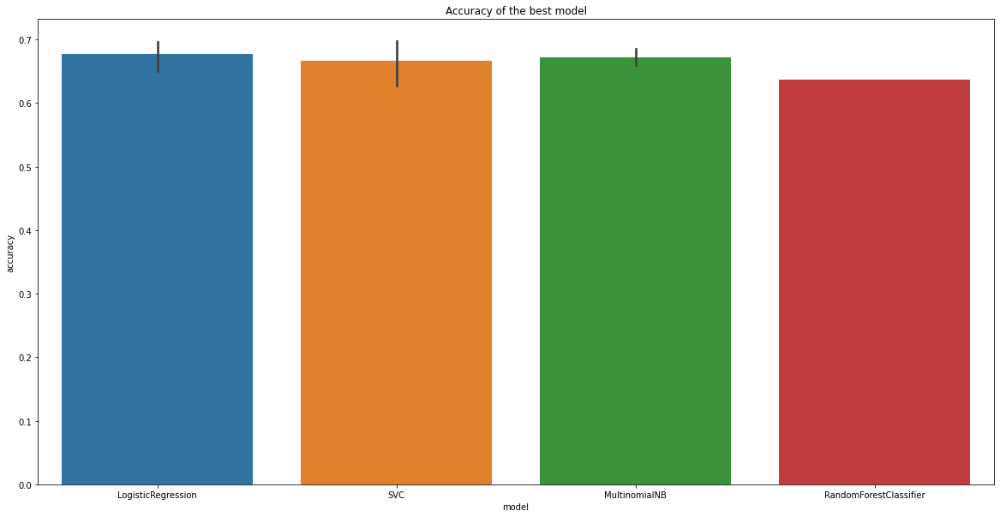

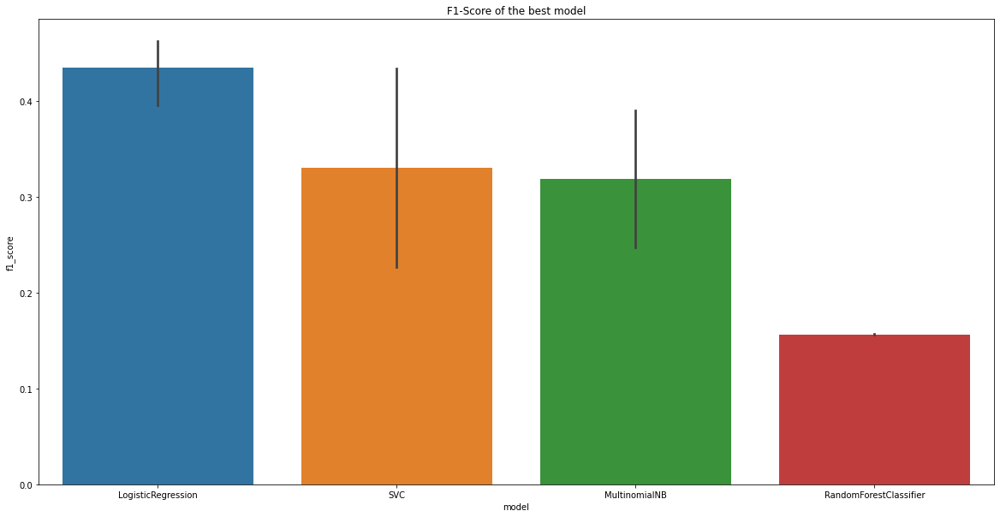

In [37]:
# plot the results
def plot_accuracy(df, title):
    plt.figure(figsize=(20, 10))
    # make a bar chart using plt
    sns.barplot(x="model", y="accuracy", data=df)
    plt.title(title)
    plt.show()


plot_accuracy(models_df,
              "Accuracy of the best model")


def plot_f1_score(df, title):
    plt.figure(figsize=(20, 10))
    sns.barplot(x="model", y="f1_score", data=df)
    plt.title(title)
    plt.show()


plot_f1_score(models_df,
              "F1-Score of the best model")



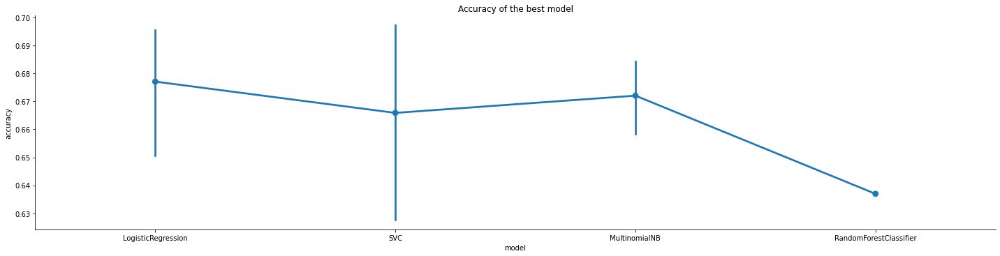

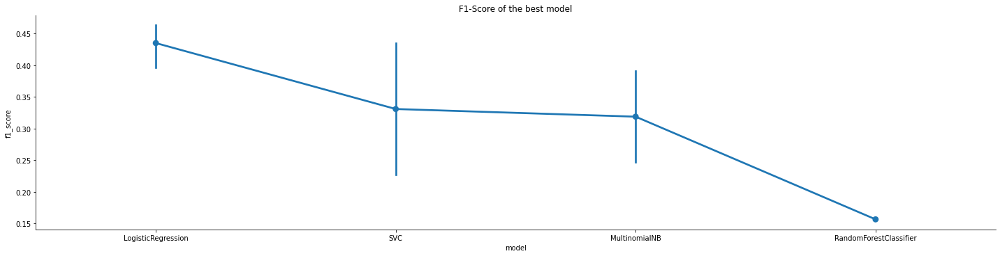

In [38]:
plt.Figure(figsize=(20, 10))

sns.catplot(x="model", y="accuracy",
            data=models_df, kind="point", label='Models', size=5, aspect=4)
plt.title("Accuracy of the best model")
plt.show()

plt.Figure(figsize=(20, 10))

sns.catplot(x="model", y="f1_score",
            data=models_df, kind="point", label='Models', size=5, aspect=4)
plt.title("F1-Score of the best model")
plt.show()

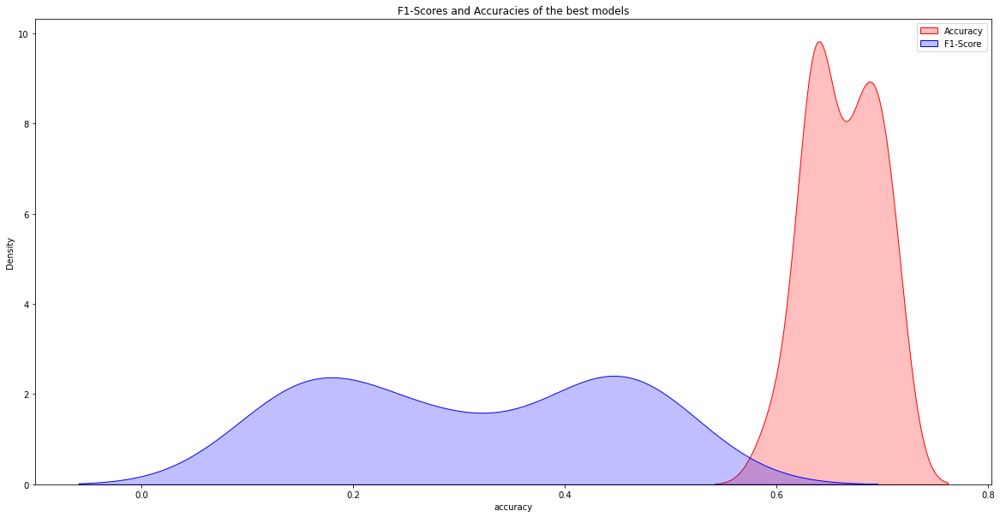

In [39]:
r = sns.kdeplot(models_df["accuracy"],
                shade=True, label='Accuracy', color='r')
b = sns.kdeplot(models_df["f1_score"],
                shade=True, label='F1-Score', color='b')
r.figure.set_size_inches(20, 10)
plt.title("F1-Scores and Accuracies of the best models")
plt.legend()
plt.show()


In [41]:
f = pd.read_csv('data/train.csv')

print(*set(re.findall(r'[^\x00-\x7F]', " ".join(f['Review_text'].tolist()))))

« Â · ¬ ¾ ­  ë £ æ Ã ª Å ® © º Þ ¨ » µ ° ± ô Î ¼ ² ¢ ã ø ç â § ½ ¦ å × û ê


# Recurrent Neural Networks

In [42]:
class BiLSTM(nn.Module):

    def __init__(self, le, embedding_matrix,max_features, embed_size):
        super(BiLSTM, self).__init__()
        self.hidden_size = 128
        drp = 0.25
        n_classes = len(le.classes_)
        self.embedding = nn.Embedding(max_features, embed_size)
        self.embedding.weight = nn.Parameter(
            torch.tensor(embedding_matrix, dtype=torch.float32))
        self.embedding.weight.requires_grad = False
        self.lstm = nn.LSTM(embed_size, self.hidden_size,
                            bidirectional=True, batch_first=True)
        self.linear = nn.Linear(self.hidden_size*4, 200)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(drp)
        self.out = nn.Linear(200, n_classes)

    def forward(self, x):
        # rint(x.size())
        h_embedding = self.embedding(x)
        #_embedding = torch.squeeze(torch.unsqueeze(h_embedding, 0))
        h_lstm, _ = self.lstm(h_embedding)
        avg_pool = torch.mean(h_lstm, 1)
        max_pool, _ = torch.max(h_lstm, 1)
        conc = torch.cat((avg_pool, max_pool), 1)
        conc = self.relu(self.linear(conc))
        conc = self.dropout(conc)
        out = self.out(conc)
        return out


class LstmModelPytorch(BaseEstimator, TransformerMixin):
    def __init__(self, max_features, n_epochs, batch_size, maxlen, embed_size, kFolds, debug, X, y):
        # Reproducing same results
        self.max_features = max_features
        self.le = LabelEncoder()
        self.tokenizer = Tokenizer(num_words=self.max_features)
        self.n_epochs = n_epochs
        self.loss_fn = nn.CrossEntropyLoss(reduction='mean')

        self.batch_size = batch_size
        self.maxlen = maxlen
        self.embed_size = embed_size
        self.kFolds = kFolds
        self.debug = debug
        self.X = X
        self.y = y

    def load_glove(self, word_index, embed_size):
        EMBEDDING_FILE = 'glove.6B/glove.6B.50d.txt'
        def get_coefs(word, *arr): return word, np.asarray(arr,
                                                           dtype='float32')[:300]
        embeddings_index = dict(get_coefs(*o.split(" "))
                                for o in open(EMBEDDING_FILE, encoding="utf8"))

        all_embs = np.stack(embeddings_index.values())
        emb_mean, emb_std = -0.005838499, 0.48782197
        embed_size = all_embs.shape[1]

        nb_words = min(self.max_features, len(word_index)+1)
        embedding_matrix = np.random.normal(
            emb_mean, emb_std, (nb_words, embed_size))
        for word, i in word_index.items():
            if i >= self.max_features:
                continue
            embedding_vector = embeddings_index.get(word)
            if embedding_vector is not None:
                embedding_matrix[i] = embedding_vector
            else:
                embedding_vector = embeddings_index.get(word.capitalize())
                if embedding_vector is not None:
                    embedding_matrix[i] = embedding_vector
        return embedding_matrix

    def plot_graph(self, epochs, train_loss, val_loss):
        fig = plt.figure(figsize=(12, 12))
        plt.title("Train/Validation Loss")
        plt.plot(list(np.arange(epochs) + 1), train_loss, label='train')
        plt.plot(list(np.arange(epochs) + 1), val_loss, label='validation')
        plt.xlabel('num_epochs', fontsize=12)
        plt.ylabel('loss', fontsize=12)
        plt.legend(loc='best')
        plt.show()

    def fit(self, X, y=None):
        xDf = pd.DataFrame(X, columns=[self.X])
        xDf[self.y] = y.to_list()
        average_trainingLoss = []
        average_validationLoss = []
        totalFScore = 0
        totalAccuracy = 0
        totalConfusion_matrix = None
        kfold = StratifiedKFold(n_splits=self.kFolds,
                                shuffle=True)
        foldCounter = 0
        bestModel = None
        bestValidationF1 = 0
        # # Do the test train split
        # train_X, test_X, train_y, test_y = train_test_split(
        #     xDf[[self.X]], xDf[self.y], test_size=0.2, random_state=7,stratify=y)

        for train_index, test_index in kfold.split(xDf[[self.X]], xDf[self.y]):
            foldCounter += 1
            train_X, test_X = xDf.iloc[train_index][[
                self.X]], xDf.iloc[test_index][[self.X]]
            train_y, test_y = xDf.iloc[train_index][self.y], xDf.iloc[test_index][self.y]

            self.tokenizer.fit_on_texts(list(train_X[self.X]))
            train_X = self.tokenizer.texts_to_sequences(train_X[self.X])

            test_X = self.tokenizer.texts_to_sequences(test_X[self.X])

            if self.debug:
                self.embedding_matrix = np.random.randn(120000, 300)
            else:
                self.embedding_matrix = self.load_glove(
                    self.tokenizer.word_index, self.embed_size)

            # Pad the sentences
            train_X = pad_sequences(train_X, maxlen=self.maxlen)
            test_X = pad_sequences(test_X, maxlen=self.maxlen)

            train_y = self.le.fit_transform(train_y.values)
            test_y = self.le.transform(test_y.values)
            # Load train and test in CUDA Memory
            x_train = torch.tensor(train_X, dtype=torch.long).cuda()
            y_train = torch.tensor(train_y, dtype=torch.long).cuda()
            x_cv = torch.tensor(test_X, dtype=torch.long).cuda()
            y_cv = torch.tensor(test_y, dtype=torch.long).cuda()

            # Create Torch datasets
            train = torch.utils.data.TensorDataset(x_train, y_train)
            valid = torch.utils.data.TensorDataset(x_cv, y_cv)

            self.model = BiLSTM(self.le, self.embedding_matrix,self.max_features,self.embed_size)
            self.optimizer = torch.optim.Adam(
                filter(lambda p: p.requires_grad, self.model.parameters()), lr=0.001)
            self.model.cuda()

            # Create Data Loaders
            train_loader = torch.utils.data.DataLoader(
                train, batch_size=self.batch_size, shuffle=True)
            valid_loader = torch.utils.data.DataLoader(
                valid, batch_size=self.batch_size, shuffle=False)

            train_loss = []
            valid_loss = []

            for epoch in range(self.n_epochs):
                start_time = time.time()
                # Set model to train configuration
                self.model.train()
                avg_loss = 0.
                for i, (x_batch, y_batch) in enumerate(train_loader):
                    # Predict/Forward Pass
                    y_pred = self.model(x_batch)
                    # Compute loss
                    self.loss = self.loss_fn(y_pred, y_batch)
                    self.optimizer.zero_grad()
                    self.loss.backward()
                    self.optimizer.step()
                    avg_loss += self.loss.item() / len(train_loader)

                # Set model to validation configuration -Doesn't get trained here
                self.model.eval()
                avg_val_loss = 0.
                val_preds = np.zeros((len(x_cv), len(self.le.classes_)))

                for i, (x_batch, y_batch) in enumerate(valid_loader):
                    y_pred = self.model(x_batch).detach()
                    avg_val_loss += self.loss_fn(y_pred,
                                                 y_batch).item() / len(valid_loader)
                    # keep/store predictions
                    val_preds[i * self.batch_size:(i+1) *
                              self.batch_size] = F.softmax(y_pred).cpu().numpy()

                # Check Accuracy
                val_accuracy = sum(val_preds.argmax(
                    axis=1) == test_y)/len(test_y)
                train_loss.append(avg_loss)
                valid_loss.append(avg_val_loss)
                elapsed_time = time.time() - start_time
                print('Epoch {}/{} at {} fold: \t loss={:.4f} \t val_loss={:.4f}  \t val_acc={:.4f}  \t time={:.2f}s'.format(
                    epoch + 1, self.n_epochs, foldCounter, avg_loss, avg_val_loss, val_accuracy, elapsed_time))
            average_trainingLoss.append(train_loss)
            average_validationLoss.append(valid_loss)
            y_true = [self.le.classes_[x] for x in test_y]
            y_pred = [self.le.classes_[x] for x in val_preds.argmax(axis=1)]
            fSc = f1_score(y_true, y_pred, average='weighted')
            if fSc > bestValidationF1:
                bestValidationF1 = fSc
                bestModel = self.model
            totalAccuracy += accuracy_score(y_true, y_pred)
            totalFScore += fSc
            totalConfusion_matrix = totalConfusion_matrix + confusion_matrix(
                y_true, y_pred) if totalConfusion_matrix is not None else confusion_matrix(y_true, y_pred)

            torch.save(bestModel, 'bilstm_model')
            torch.save(self.tokenizer, 'bilstm_model_tokenizer')
            torch.save(self.le, 'bilstm_model_labelencoder')
            gc.collect()
        # Element wise sum the average training and validation loss
        average_trainingLoss = np.array(average_trainingLoss).sum(axis=0)
        average_validationLoss = np.array(average_validationLoss).sum(axis=0)
        self.plot_graph(self.n_epochs, average_trainingLoss,
                        average_validationLoss)
        totalAccuracy = totalAccuracy/self.k_fold
        totalFScore = totalFScore/self.k_fold
        totalConfusion_matrix = totalConfusion_matrix/self.k_fold
        # Save the confusion matrix np save
        with open(f"lstm_confusion_matrix.npy", "wb") as of:
            np.save(of, totalConfusion_matrix)
        # Save the file as json
        with open(f"stats.json", 'w') as f:
            json.dump({'accuracy': totalAccuracy, 'fScore': totalFScore}, f)
        print("## Trained and Tested  Model: BiLSTM" +
              "\n\t - using lemmitization for tokenization" +
              "\n\t - with Glove Embeddings for vectorization" +
              f"\n\t - {'without stratification on an unbalanced dataset'if len(X)>2000 else 'on a statified balanced dataset'}")
        print("--"*10+"Results" + "--"*10)
        print(
            # f"- Average Accuracy of BiLSTM across {self.kFolds}-folds = {totalAccuracy/self.kFolds}")
            f"- Average Accuracy of BiLSTM across {self.kFolds}-folds = {totalAccuracy}")
        print(
            f"- Average F1-Score of BiLSTM across {self.kFolds}-folds = {totalFScore}")
        # f"- Average F1-Score of BiLSTM across {self.kFolds}-folds = {totalFScore/self.kFolds}")
        print(
            f"- Average Confustion Matrix of BiLSTM across {self.kFolds}-folds:")
        # sns.heatmap(totalConfusion_matrix/self.kFolds, annot=True)
        sns.heatmap(totalConfusion_matrix, annot=True)
        plt.show()

    def predict(self, X):
        self.model = torch.load('bilstm_model')
        self.tokenizer = torch.load('bilstm_model_tokenizer')
        self.le = torch.load('bilstm_model_labelencoder')
        # generate list of zeroes only int same as the length of X
        y = [1 for _ in range(len(X))]
        test_X = self.tokenizer.texts_to_sequences(X[self.X])

        test_X = pad_sequences(test_X, maxlen=self.maxlen)
        test_y = self.le.transform(y)

        x_cv = torch.tensor(test_X, dtype=torch.long).cuda()
        y_cv = torch.tensor(test_y, dtype=torch.long).cuda()
        valid = torch.utils.data.TensorDataset(x_cv, y_cv)

        valid_loader = torch.utils.data.DataLoader(
            valid, batch_size=self.batch_size, shuffle=False)

        # Set model to validation configuration -Doesn't get trained here
        self.model.eval()
        val_preds = np.zeros((len(x_cv), len(self.le.classes_)))

        for i, (x_batch, y_batch) in enumerate(valid_loader):
            y_pred = self.model(x_batch).detach()
            # keep/store predictions
            val_preds[i * self.batch_size:(i+1) *
                      self.batch_size] = F.softmax(y_pred).cpu().numpy()

        y_new = [self.le.classes_[x] for x in val_preds.argmax(axis=1)]
        return y_new

```python
embed_size = 50  # how big is each word vector
# how many unique words to use (i.e num rows in embedding vector)
max_features = 120000
# max number of words in a tweet to use
maxlen = 1000
# maxlen = int(df['cleaned_text'].str.split().str.len().max())
batch_size = 64  # how many samples to process at once
n_epochs = 1  # how many times to iterate over all samples
n_splits = 5  # Number of K-fold Splits
debug = 0


lstmModel = LstmModelPytorch(max_features=max_features,
                             n_epochs=n_epochs, batch_size=batch_size, maxlen=maxlen, embed_size=embed_size, kFolds=n_splits, debug=debug, X="cleaned_text", y="Score")
df = pd.read_csv('/content/drive/MyDrive/colab/data/train_cleaned_new.csv', encoding='utf-8')
df['cleaned_text'] = df['cleaned_text'].astype(str)
# # df = df.groupby('Score').apply(lambda x: x.sample(n=df['Score'].value_counts().min()))
# df = df.groupby('Score').apply(lambda x: x.sample(n=100))
_ = lstmModel.fit(df[["cleaned_text"]], df["Score"])

```

In [43]:
dl_models_info = []

In [44]:
def plot_dl_cm(cm, options, only_table=False):

    header = []

    body = [[], []]

    accuracy_score_list = []

    f1_score_list = []

    for i, option in enumerate(options):
        modelAlgoName, mode, model, numberOfFolds = option

        header.append(r"Trained and Tested Deep Leaning Model: " +
                      modelAlgoName + " using " + mode.capitalize())

        body[0].append(
            f"Average Accuracy of {modelAlgoName} across {numberOfFolds}-folds = {model['accuracy']*100:.2f}%")

        accuracy_score_list.append(model['accuracy'])

        body[1].append(
            f"Average F1-Score of {modelAlgoName} across {numberOfFolds}-folds = {model['fScore']*100:.2f}%")

        f1_score_list.append(model['fScore'])

    table = pd.DataFrame(body, columns=header)

    printmd(table.to_markdown())

    if only_table==False:
        f, axes = plt.subplots(1, len(cm), figsize=(30, 15), sharey='row')

        for i, a in enumerate(cm):
            key, n = a
            model, cf_matrix = n
            disp = ConfusionMatrixDisplay(cf_matrix,
                                        display_labels=range(1, 6))
            disp.plot(ax=axes[i], xticks_rotation=45)
            disp.ax_.set_title(
                key + f"\nAccuracy - {model['accuracy']*100:.2f}%\nF1-Score - {model['fScore']*100:.2f}%")
            disp.im_.colorbar.remove()
            disp.ax_.set_xlabel('')
            if i != 0:
                disp.ax_.set_ylabel('')

        f.text(0.4, 0.1, 'Predicted label', ha='left')
        plt.subplots_adjust(wspace=0.40, hspace=0.1)

        f.colorbar(disp.im_, ax=axes)
        plt.show()

    x = [f[0] for f in cm]

    # plot the accuracy and f1 score in the same graph
    plt.figure(figsize=(30, 10))
    X_axis = np.arange(len(x))
    plt.bar(X_axis-0.2, accuracy_score_list, 0.4, label='Accuracy')
    plt.bar(X_axis+0.2, f1_score_list, 0.4, label='F1 Score')
    plt.xticks(X_axis, x, rotation=0)
    plt.legend()
    plt.show()

## Training and Testing LSTM on Lemmatized reviews 

## Trained and Tested  Model: Bi-LSTM
 	 -- with Normalization by lemmatization

--------------------Results--------------------

- Average Accuracy of Bi-LSTM across 5-folds = 0.7322382784675885

- Average F1-Score of Bi-LSTM across 5-folds = 0.7000801910775862

- Average Confusion Matrix of Bi-LSTM across 5-folds:

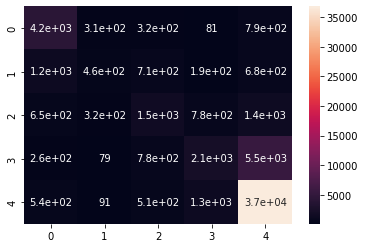

In [46]:
def loadDLModel(name, path):
    # Save the confusion matrix np save
    with open(f"{path}/{name}_confusion_matrix.npy", "rb") as of:
        cM = np.load(of)
    # Save the file as json
    with open(f"{path}/{name}_stats.json", 'r') as f:
        model = json.load(f)
    return model, cM


def prettyPrintDLModels(model, cM, name,norm, numberOfFolds):
    printmd("## Trained and Tested  Model: " + name+
            "\n \t -- with Normalization by "+ norm

    )
    printmd("--"*10+"Results" + "--"*10)
    printmd(
        f"- Average Accuracy of {name} across {numberOfFolds}-folds = {model['accuracy']}")
    printmd(
        f"- Average F1-Score of {name} across {numberOfFolds}-folds = {model['fScore']}")
    printmd(
        f"- Average Confusion Matrix of {name} across {numberOfFolds}-folds:")
    sns.heatmap(cM, annot=True)
    plt.show()

model_1, cM_1 = loadDLModel("lstm", "lstm/lstm_lema")
prettyPrintDLModels(model_1, cM_1, "Bi-LSTM","lemmatization", 5)

## Training and Testing LSTM on cleaned review with stop words removed

## Trained and Tested  Model: Bi-LSTM
 	 -- with Normalization by cleaning plus stopword removal

--------------------Results--------------------

- Average Accuracy of Bi-LSTM across 5-folds = 0.7366203118415507

- Average F1-Score of Bi-LSTM across 5-folds = 0.7020817440587122

- Average Confusion Matrix of Bi-LSTM across 5-folds:

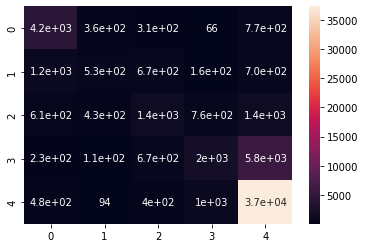

In [47]:
model, cM = loadDLModel("lstm", "lstm/lstm_cleanedStopword")
prettyPrintDLModels(model, cM, "Bi-LSTM","cleaning plus stopword removal", 5)

## Training and Testing LSTM on cleaned reviews

## Trained and Tested  Model: Bi-LSTM
 	 -- with Normalization by only cleaning

--------------------Results--------------------

- Average Accuracy of Bi-LSTM across 5-folds = 0.790611366515

- Average F1-Score of Bi-LSTM across 5-folds = 0.776052396495

- Average Confusion Matrix of Bi-LSTM across 5-folds:

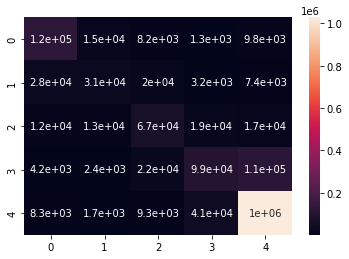

In [48]:
model, cM = loadDLModel("lstm", "lstm/lstm_cleaned")
prettyPrintDLModels(model, cM, "Bi-LSTM","only cleaning", 5)

Comparing the results of the above models

|    | Trained and Tested Deep Leaning Model: Bi-LSTM using Lemmatization   | Trained and Tested Deep Leaning Model: Bi-LSTM using Cleaning plus stopword removal   | Trained and Tested Deep Leaning Model: Bi-LSTM using Only cleaning   |
|---:|:---------------------------------------------------------------------|:--------------------------------------------------------------------------------------|:---------------------------------------------------------------------|
|  0 | Average Accuracy of Bi-LSTM across 5-folds = 73.22%                  | Average Accuracy of Bi-LSTM across 5-folds = 73.66%                                   | Average Accuracy of Bi-LSTM across 5-folds = 79.06%                  |
|  1 | Average F1-Score of Bi-LSTM across 5-folds = 70.01%                  | Average F1-Score of Bi-LSTM across 5-folds = 70.21%                                   | Average F1-Score of Bi-LSTM across 5-folds = 77.61%                  |

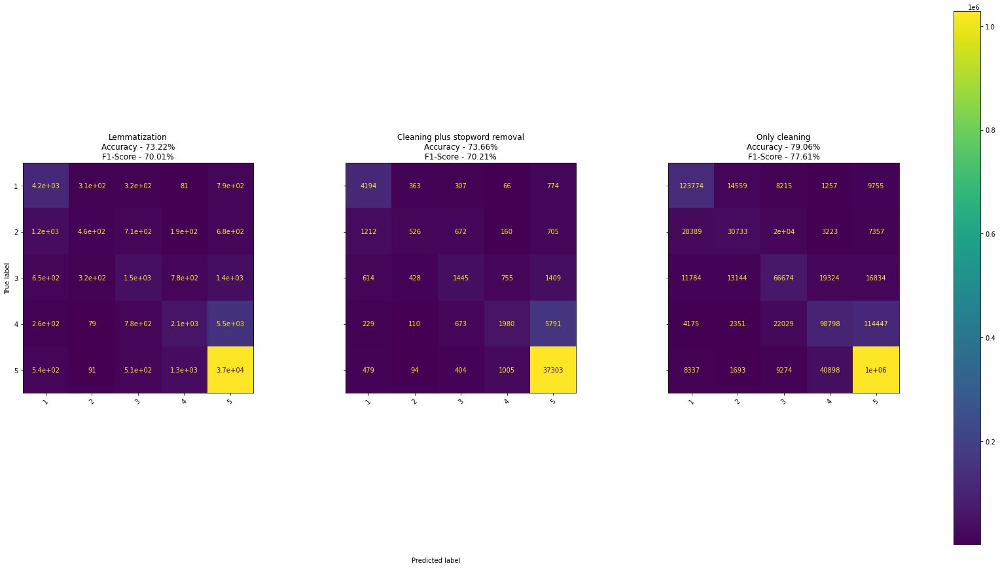

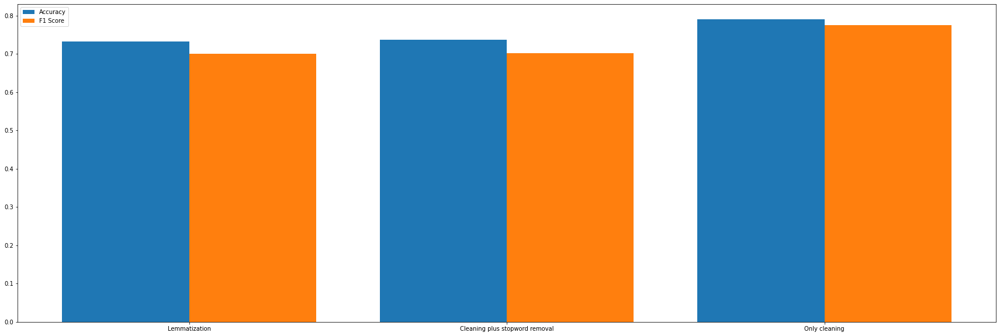

In [51]:
printmd("Comparing the results of the above models")

model_1, cM_1 = loadDLModel("lstm", "lstm/lstm_lema")

model_2, cM_2 = loadDLModel("lstm", "lstm/lstm_cleanedStopword")

model_3, cM_3 = loadDLModel("lstm", "lstm/lstm_cleaned")

info = [
    ["Bi-LSTM", "lemmatization", model_1,  5],
    ["Bi-LSTM", "cleaning plus stopword removal", model_2, 5],
    ["Bi-LSTM", "only cleaning", model_3, 5]
]

models = [
    ['Lemmatization', (model_1, cM_1)],
    ['Cleaning plus stopword removal', (model_2, cM_2)],
    ['Only cleaning', (model_3, cM_3)]
]

plot_dl_cm(
    models,
    info
)

dl_models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                            [1][0]['fScore']] for i, x in enumerate(info)])



#### From the results Bi-LSTM trained on only cleaned text performs better than other nomarlization methods. This can be reasoned as we use GLOVE to represent a sentence/food review as a vector. Glove captures the semantic meaning and positioning of a word in the sentence. As, lemmatization decrease the meaning of a word in a sentece, GLOVE produces better representation of words in their orginal form.

# Transformer

In [52]:
class TransformerBlock(Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = Sequential(
            [Dense(ff_dim, activation="relu"), 
             Dense(embed_dim),]
        )
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout1 = Dropout(rate)
        self.dropout2 = Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)
class TokenAndPositionEmbedding(Layer):
    def __init__(self, maxlen, vocab_size, embed_dim):
        super(TokenAndPositionEmbedding, self).__init__()
        self.token_emb = Embedding(input_dim=vocab_size, output_dim=embed_dim)
        self.pos_emb = Embedding(input_dim=maxlen, output_dim=embed_dim)

    def call(self, x):
        maxlen = tf.shape(x)[-1]
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        x = self.token_emb(x)
        return x + positions

class TransformerTensorflow(BaseEstimator, TransformerMixin):
    def __init__(self, vocab_size, maxlen, embed_dim , num_heads,ff_dim, n_epochs, batch_size, kFolds, debug, X, y):
        # Reproducing same results
        self.vocab_size = vocab_size
        self.maxlen = maxlen

        inputs = Input(shape=(maxlen,))
        embedding_layer = TokenAndPositionEmbedding(maxlen, vocab_size, embed_dim)
        inp = embedding_layer(inputs)
        transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
        tb = transformer_block(inp)
        GA = GlobalAveragePooling1D()(tb)
        GA = Dropout(0.25)(GA)
        l1 = Dense(80, activation="relu")(GA)
        l1 = Dropout(0.25)(l1)
        l2 = Dense(40, activation="relu")(l1)
        l2 = Dropout(0.25)(l2)
        # Can add more layers here like this 
        l3 = Dense(20, activation="relu")(l2)
        l3 = Dropout(0.25)(l3)
        l4 = Dense(10, activation="relu")(l3)
        l4 = Dropout(0.25)(l4)
        # And can change the number of layers
        outputs = Dense(5, activation="softmax")(l4)

        self.model = Model(inputs=inputs, outputs=outputs)
        self.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=['accuracy'])
        self.n_epochs = n_epochs
        self.batch_size = batch_size
        self.kFolds = kFolds
        self.debug = debug
        self.X = X
        self.y = y
        self.tokenizer = keras.preprocessing.text.Tokenizer(num_words=vocab_size)
        self.le = LabelEncoder()
        
    def plot1(self,history):
        acc = history.history['accuracy']
        val_acc = history.history['val_accuracy']
        loss = history.history['loss']
        val_loss = history.history['val_loss']

        epochs = range(1, len(acc) + 1)
        ## Accuracy plot
        plt.plot(epochs, acc, 'bo', label='Training acc')
        plt.plot(epochs, val_acc, 'b', label='Validation acc')
        plt.title('Training and validation accuracy')
        plt.legend()
        ## Loss plot
        plt.figure()

        plt.plot(epochs, loss, 'bo', label='Training loss')
        plt.plot(epochs, val_loss, 'b', label='Validation loss')
        plt.title('Training and validation loss')
        plt.legend()
        plt.show()


    def plot2(self,history):
        pd.DataFrame(history.history).plot(figsize=(8, 5))
        plt.grid(True)
        #plt.gca().set_ylim(0,1)
        plt.show()
        
    def fit(self, X, y=None):
        xDf = pd.DataFrame(X, columns=[self.X])
        xDf[self.y] = y.to_list()
        totalFScore = 0
        totalAccuracy = 0
        totalConfusion_matrix = None
        kfold = StratifiedKFold(n_splits=self.kFolds,
                                shuffle=True)
        foldCounter = 0
        bestModel = None
        bestValidationF1 = 0
        # Do the test train split
        # train_X, test_X, train_y, test_y = train_test_split(
        #     xDf[[self.X]], xDf[self.y], test_size=0.2, random_state=7)

        for train_index, test_index in kfold.split(xDf[[self.X]], xDf[self.y]):
            foldCounter += 1
            train_X, test_X = xDf.iloc[train_index][[
                self.X]], xDf.iloc[test_index][[self.X]]
            train_y, test_y = xDf.iloc[train_index][self.y], xDf.iloc[test_index][self.y]

            self.tokenizer.fit_on_texts(list(train_X[self.X]))
            train_X = self.tokenizer.texts_to_sequences(train_X[self.X])

            test_X = self.tokenizer.texts_to_sequences(test_X[self.X])

            # Pad the sentences
            train_X = keras.preprocessing.sequence.pad_sequences(train_X, maxlen=self.maxlen)
            test_X = keras.preprocessing.sequence.pad_sequences(test_X, maxlen=self.maxlen)
            
            train_y = self.le.fit_transform(train_y)
            
            test_y = self.le.transform(test_y)

            history = self.model.fit(train_X, train_y, batch_size=self.batch_size, epochs=self.n_epochs, validation_data=(test_X, test_y) )
            self.plot1(history)
            self.plot2(history)
            results = self.model.predict(test_X,verbose=2).argmax(axis=1)
            
            fSc = f1_score(test_y, results, average='weighted')
            # if fSc > bestValidationF1:
            bestValidationF1 = fSc
            bestModel = self.model
            totalAccuracy += accuracy_score(test_y, results)
            totalFScore += fSc
            totalConfusion_matrix = totalConfusion_matrix + confusion_matrix(
                test_y, results) if totalConfusion_matrix is not None else confusion_matrix(test_y, results)

            bestModel.save_weights("transformer_result/predict_class.h5")
            # Save tokenizer 
            with open('transformer_result/tokenizer.pickle', 'wb') as handle:
                pickle.dump(self.tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)
            # Save label encoder
            with open('transformer_result/label_encoder.pickle', 'wb') as handle:
                pickle.dump(self.le, handle, protocol=pickle.HIGHEST_PROTOCOL)
            gc.collect()
        totalAccuracy = totalAccuracy/self.kFolds
        totalFScore = totalFScore/self.kFolds
        totalConfusion_matrix = totalConfusion_matrix/self.kFolds
        # Save the confusion matrix np save
        with open(f"transformer_result/transformer_confusion_matrix.npy","wb") as of:
            np.save(of, totalConfusion_matrix)
        # Save the file as json
        with open(f"transformer_result/transformer_stats.json", 'w') as f:
            json.dump({'accuracy':totalAccuracy ,'fScore':totalFScore}, f)

        print("## Trained and Tested  Model: Transformer" +
                "\n\t - using lemmitization for tokenization" +
                f"\n\t - {'without stratification on an unbalanced dataset'if len(X)>2000 else 'on a balanced dataset'}")
        print("--"*10+"Results" + "--"*10)
        print(
            # f"- Average Accuracy of BiLSTM across {self.kFolds}-folds = {totalAccuracy/self.kFolds}")
            f"- Average Accuracy of Transformer across {self.kFolds}-folds = {totalAccuracy}")
        print(
            f"- Average F1-Score of Transformer across {self.kFolds}-folds = {totalFScore}")
            # f"- Average F1-Score of BiLSTM across {self.kFolds}-folds = {totalFScore/self.kFolds}")
        print(
            f"- Average Confustion Matrix of Transformer across {self.kFolds}-folds:")
        # sns.heatmap(totalConfusion_matrix/self.kFolds, annot=True)
        sns.heatmap(totalConfusion_matrix, annot=True)
        plt.show()

    def predict(self, X):
        # Load the model
        self.model.load_weights("transformer_result/predict_class.h5")
        # Load the tokenizer
        with open('transformer_result/tokenizer.pickle', 'rb') as handle:
            self.tokenizer = pickle.load(handle)
        # Load the label encoder
        with open('transformer_result/label_encoder.pickle', 'rb') as handle:
            self.le = pickle.load(handle)

        test_X = self.tokenizer.texts_to_sequences(X[self.X])
        test_X = keras.preprocessing.sequence.pad_sequences(test_X, maxlen=self.maxlen)
        predictions = self.model.predict(test_X, verbose=2)


        results = predictions.argmax(axis=1)
        results = self.le.inverse_transform(results)
        return results

 ```python
num_heads = 250  # Number of attention heads
ff_dim = 500  # Hidden layer size in feed forward network inside transformer
embed_dim = 100  # how big is each word vector
# how many unique words to use (i.e num rows in embedding vector)
vocab_size = 10000  # Only consider the top k words
maxlen = 50  # Only consider the first 200 words of each movie review
# maxlen = int(df['cleaned_text'].str.split().str.len().max())
batch_size = 100  # how many samples to process at once
n_epochs = 30  # how many times to iterate over all samples
n_splits = 5  # Number of K-fold Splits
debug = 0
model = TransformerTensorflow(vocab_size, maxlen, embed_dim , num_heads,ff_dim, n_epochs, batch_size, n_splits, debug, X="cleaned_text", y="Score")

df = pd.read_csv('/content/drive/MyDrive/colab/data/train_cleaned_new.csv', encoding='utf-8')
df['cleaned_text'] = df['cleaned_text'].astype(str)

_=model.fit(df[['cleaned_text']],df['Score'])

```

## Training and Testing Transformers on Lemmatized reviews 

## Trained and Tested  Model: Transformer
 	 -- with Normalization by lemmatization

--------------------Results--------------------

- Average Accuracy of Transformer across 5-folds = 0.7223572887289701

- Average F1-Score of Transformer across 5-folds = 0.6845668697453167

- Average Confusion Matrix of Transformer across 5-folds:

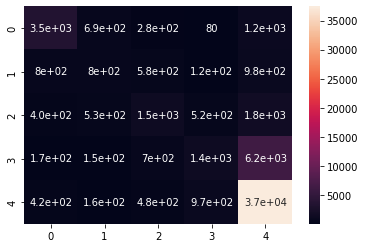

In [53]:
model, cM = loadDLModel("Transformer", "transformer/transFormersLematized")
prettyPrintDLModels(model, cM, "Transformer","lemmatization", 5)

## Training and Testing Transformers on cleaned reviews with stop words removed

## Trained and Tested  Model: Transformer
 	 -- with Normalization by cleaning plus stopword removal

--------------------Results--------------------

- Average Accuracy of Transformer across 5-folds = 0.7242212065220914

- Average F1-Score of Transformer across 5-folds = 0.6989638000567363

- Average Confusion Matrix of Transformer across 5-folds:

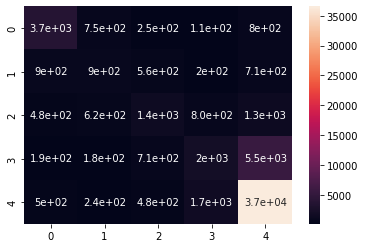

In [54]:
model, cM = loadDLModel(
    "Transformer", "transformer/transformerCleanAndStopwordRemoved")
prettyPrintDLModels(model, cM, "Transformer","cleaning plus stopword removal", 5)

## Training and Testing Transformers on cleaned reviews

## Trained and Tested  Model: Transformer
 	 -- with Normalization by only cleaning

--------------------Results--------------------

- Average Accuracy of Transformer across 5-folds = 0.7915396162687057

- Average F1-Score of Transformer across 5-folds = 0.7865238720567698

- Average Confusion Matrix of Transformer across 5-folds:

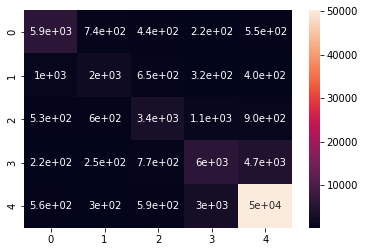

In [55]:
model, cM = loadDLModel("Transformer", "transformer/transformers_cleaning")
prettyPrintDLModels(model, cM, "Transformer","only cleaning", 5)

Comparing the results of the above models

|    | Trained and Tested Deep Leaning Model: transformer using Lemmatization   | Trained and Tested Deep Leaning Model: transformer using Cleaning plus stopword removal   | Trained and Tested Deep Leaning Model: transformer using Only cleaning   |
|---:|:-------------------------------------------------------------------------|:------------------------------------------------------------------------------------------|:-------------------------------------------------------------------------|
|  0 | Average Accuracy of transformer across 5-folds = 72.24%                  | Average Accuracy of transformer across 5-folds = 72.42%                                   | Average Accuracy of transformer across 5-folds = 79.15%                  |
|  1 | Average F1-Score of transformer across 5-folds = 68.46%                  | Average F1-Score of transformer across 5-folds = 69.90%                                   | Average F1-Score of transformer across 5-folds = 78.65%                  |

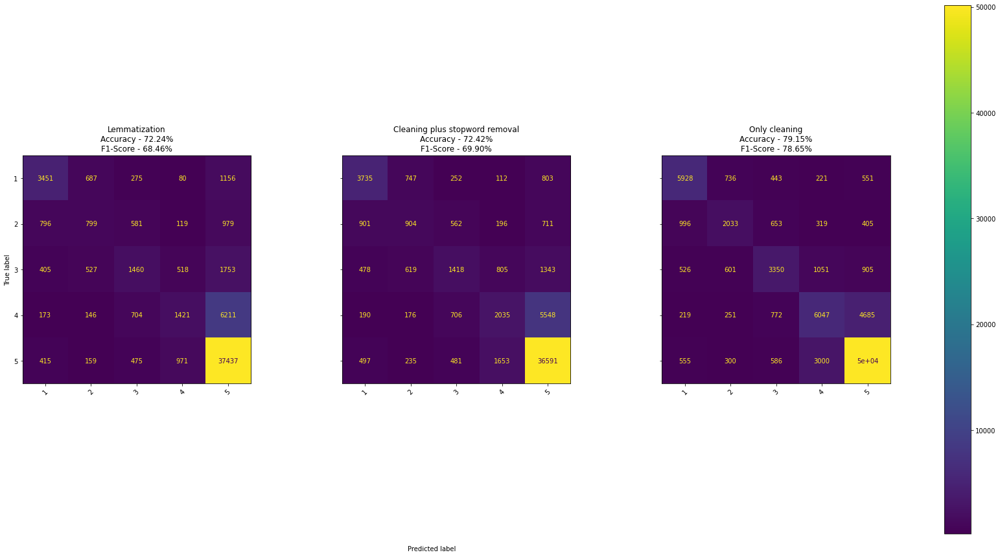

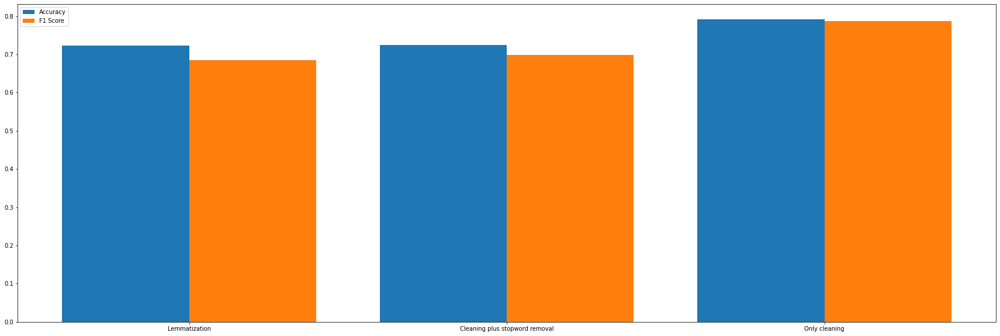

In [56]:
printmd("Comparing the results of the above models")

model_1, cM_1 = loadDLModel("transformer", "transformer/transformersLematized")

model_2, cM_2 = loadDLModel("transformer", "transformer/transformerCleanAndStopwordRemoved")

model_3, cM_3 = loadDLModel("transformer", "transformer/transformers_cleaning")

info = [
    ["transformer", "lemmatization", model_1,  5],
    ["transformer", "cleaning plus stopword removal", model_2, 5],
    ["transformer", "only cleaning", model_3, 5]
]

models = [
    ['Lemmatization', (model_1, cM_1)],
    ['Cleaning plus stopword removal', (model_2, cM_2)],
    ['Only cleaning', (model_3, cM_3)]
]

plot_dl_cm(
    models,
    info
)

dl_models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
                            [1][0]['fScore']] for i, x in enumerate(info)])


In [57]:
dl_models_df = pd.DataFrame(dl_models_info, columns=['model', 'Preprocessing', 'model_results', 'K-Fold' , 'accuracy', 'f1_score'])

dl_models_df.drop(columns=['model_results'], inplace=True)

dl_models_df

,model,Preprocessing,K-Fold,accuracy,f1_score
0,Bi-LSTM,lemmatization,5,0.732238,0.700080
1,Bi-LSTM,only cleaning,5,0.790611,0.776052
2,Bi-LSTM,lemmatization,5,0.732238,0.700080
3,Bi-LSTM,cleaning plus stopword removal,5,0.736620,0.702082
4,Bi-LSTM,only cleaning,5,0.790611,0.776052
5,transformer,lemmatization,5,0.722357,0.684567
6,transformer,cleaning plus stopword removal,5,0.724221,0.698964
7,transformer,only cleaning,5,0.791540,0.786524


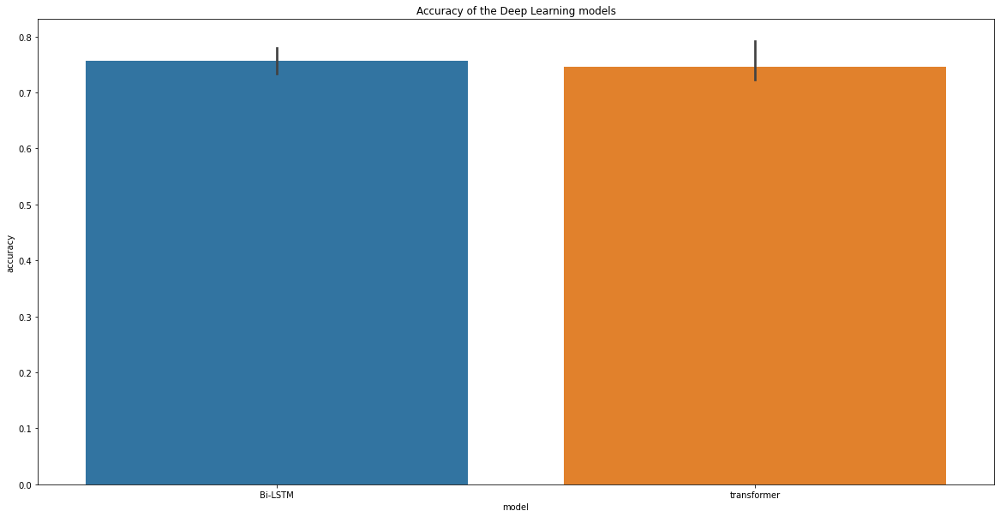

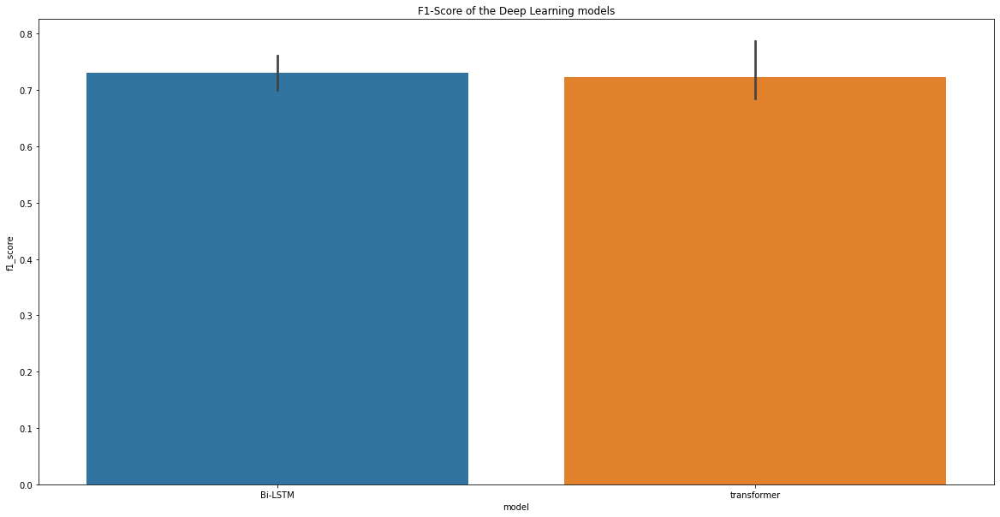

In [58]:
# plot the results
def plot_accuracy(df, title):
    plt.figure(figsize=(20, 10))
    # make a bar chart using plt
    sns.barplot(x="model", y="accuracy", data=df)
    plt.title(title)
    plt.show()


plot_accuracy(dl_models_df,
              "Accuracy of the Deep Learning models")


def plot_f1_score(df, title):
    plt.figure(figsize=(20, 10))
    sns.barplot(x="model", y="f1_score", data=df)
    plt.title(title)
    plt.show()


plot_f1_score(dl_models_df,
              "F1-Score of the Deep Learning models")


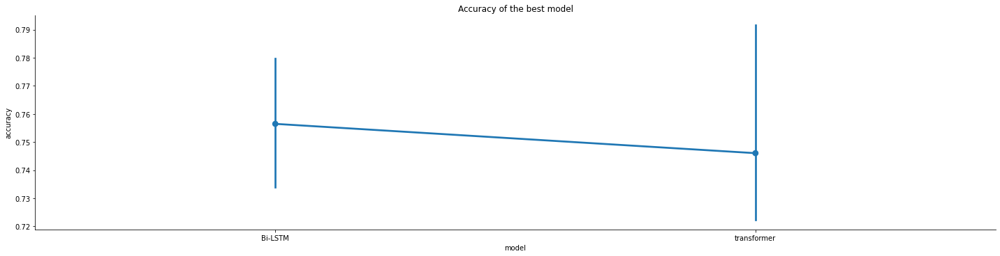

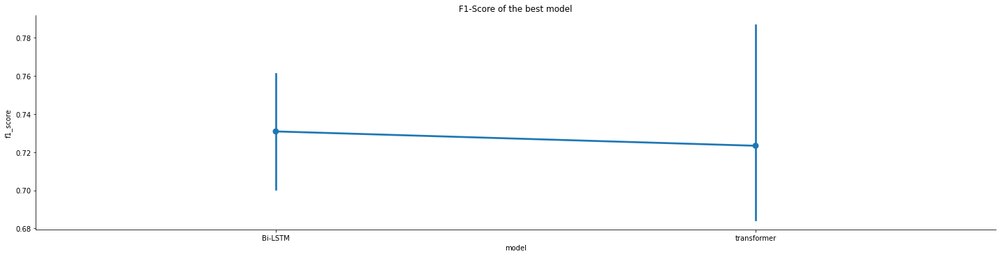

In [59]:
plt.Figure(figsize=(20, 10))

sns.catplot(x="model", y="accuracy",
            data=dl_models_df, kind="point", label='Models', size=5, aspect=4)
plt.title("Accuracy of the best model")
plt.show()

plt.Figure(figsize=(20, 10))

sns.catplot(x="model", y="f1_score",
            data=dl_models_df, kind="point", label='Models', size=5, aspect=4)
plt.title("F1-Score of the best model")
plt.show()

### From the above results transformers perform better on just cleaned text without removing stop words or lemmatizing the text.
##### This can be reasoned by that the transformer makes an internal dynamic embedding of word using attention layers. Representation for each word depends upon the position and its attention in the corpus, thus the representation depends on the sentence being tokenized.

# Further Research 

# Training and testing transformers on 3 classes

In [61]:
class TransformerBlock(Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = Sequential(
            [Dense(ff_dim, activation="relu"), 
             Dense(embed_dim),]
        )
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout1 = Dropout(rate)
        self.dropout2 = Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)
class TokenAndPositionEmbedding(Layer):
    def __init__(self, maxlen, vocab_size, embed_dim):
        super(TokenAndPositionEmbedding, self).__init__()
        self.token_emb = Embedding(input_dim=vocab_size, output_dim=embed_dim)
        self.pos_emb = Embedding(input_dim=maxlen, output_dim=embed_dim)

    def call(self, x):
        maxlen = tf.shape(x)[-1]
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        x = self.token_emb(x)
        return x + positions

class TransformerTensorflow(BaseEstimator, TransformerMixin):
    def __init__(self, vocab_size, maxlen, embed_dim , num_heads,ff_dim, n_epochs, batch_size, kFolds, debug, X, y):
        # Reproducing same results
        self.vocab_size = vocab_size
        self.maxlen = maxlen

        inputs = Input(shape=(maxlen,))
        embedding_layer = TokenAndPositionEmbedding(maxlen, vocab_size, embed_dim)
        inp = embedding_layer(inputs)
        transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
        tb = transformer_block(inp)
        GA = GlobalAveragePooling1D()(tb)
        GA = Dropout(0.25)(GA)
        l1 = Dense(1024*2, activation="relu")(GA)
        l1 = Dropout(0.25)(l1)
        l2 = Dense(1024*3, activation="relu")(l1)
        l2 = Dropout(0.25)(l2)
        # Can add more layers here like this 
        l3 = Dense(1024*4, activation="relu")(l2)
        l3 = Dropout(0.25)(l3)
        l4 = Dense(1024*5, activation="relu")(l3)
        l4 = Dropout(0.25)(l4)
        l5 = Dense(1024*6, activation="relu")(l3)
        l5 = Dropout(0.25)(l4)
        # And can change the number of layers
        outputs = Dense(5, activation="softmax")(l5)

        self.model = Model(inputs=inputs, outputs=outputs)
        self.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=['accuracy'])
        self.n_epochs = n_epochs
        self.batch_size = batch_size
        self.kFolds = kFolds
        self.debug = debug
        self.X = X
        self.y = y
        self.tokenizer = keras.preprocessing.text.Tokenizer(num_words=vocab_size)
        self.le = LabelEncoder()
        
    def plot1(self,history):
        acc = history.history['accuracy']
        val_acc = history.history['val_accuracy']
        loss = history.history['loss']
        val_loss = history.history['val_loss']

        epochs = range(1, len(acc) + 1)
        ## Accuracy plot
        plt.plot(epochs, acc, 'bo', label='Training acc')
        plt.plot(epochs, val_acc, 'b', label='Validation acc')
        plt.title('Training and validation accuracy')
        plt.legend()
        ## Loss plot
        plt.figure()

        plt.plot(epochs, loss, 'bo', label='Training loss')
        plt.plot(epochs, val_loss, 'b', label='Validation loss')
        plt.title('Training and validation loss')
        plt.legend()
        plt.show()


    def plot2(self,history):
        pd.DataFrame(history.history).plot(figsize=(8, 5))
        plt.grid(True)
        #plt.gca().set_ylim(0,1)
        plt.show()
        
    def fit(self, X, y=None):
        xDf = pd.DataFrame(X, columns=[self.X])
        xDf[self.y] = y.to_list()
        totalFScore = 0
        totalAccuracy = 0
        totalConfusion_matrix = None
        kfold = StratifiedKFold(n_splits=self.kFolds,
                                shuffle=True)
        foldCounter = 0
        bestModel = None
        bestValidationF1 = 0
        # Do the test train split
        # train_X, test_X, train_y, test_y = train_test_split(
        #     xDf[[self.X]], xDf[self.y], test_size=0.2, random_state=7)

        for train_index, test_index in kfold.split(xDf[[self.X]], xDf[self.y]):
            foldCounter += 1
            train_X, test_X = xDf.iloc[train_index][[
                self.X]], xDf.iloc[test_index][[self.X]]
            train_y, test_y = xDf.iloc[train_index][self.y], xDf.iloc[test_index][self.y]

            self.tokenizer.fit_on_texts(list(train_X[self.X]))
            train_X = self.tokenizer.texts_to_sequences(train_X[self.X])

            test_X = self.tokenizer.texts_to_sequences(test_X[self.X])

            # Pad the sentences
            train_X = keras.preprocessing.sequence.pad_sequences(train_X, maxlen=self.maxlen)
            test_X = keras.preprocessing.sequence.pad_sequences(test_X, maxlen=self.maxlen)
            
            train_y = self.le.fit_transform(train_y)
            
            test_y = self.le.transform(test_y)

            history = self.model.fit(train_X, train_y, batch_size=self.batch_size, epochs=self.n_epochs, validation_data=(test_X, test_y) )
            self.plot1(history)
            self.plot2(history)
            results = self.model.predict(test_X,verbose=2).argmax(axis=1)
            
            fSc = f1_score(test_y, results, average='weighted')
            # if fSc > bestValidationF1:
            bestValidationF1 = fSc
            bestModel = self.model
            totalAccuracy += accuracy_score(test_y, results)
            totalFScore += fSc
            totalConfusion_matrix = totalConfusion_matrix + confusion_matrix(
                test_y, results) if totalConfusion_matrix is not None else confusion_matrix(test_y, results)

            bestModel.save_weights("transformer_result/predict_class.h5")
            # Save tokenizer 
            with open('transformer_result3Classes/tokenizer.pickle', 'wb') as handle:
                pickle.dump(self.tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)
            # Save label encoder
            with open('transformer_result3Classes/label_encoder.pickle', 'wb') as handle:
                pickle.dump(self.le, handle, protocol=pickle.HIGHEST_PROTOCOL)
            gc.collect()
        totalAccuracy = totalAccuracy/self.kFolds
        totalFScore = totalFScore/self.kFolds
        totalConfusion_matrix = totalConfusion_matrix/self.kFolds
        # Save the confusion matrix np save
        with open(f"transformer_result/transformer_confusion_matrix.npy","wb") as of:
            np.save(of, totalConfusion_matrix)
        # Save the file as json
        with open(f"transformer_result/transformer_stats.json", 'w') as f:
            json.dump({'accuracy':totalAccuracy ,'fScore':totalFScore}, f)

        print("## Trained and Tested  Model: Transformer" +
                "\n\t - using lemmitization for tokenization" +
                f"\n\t - {'without stratification on an unbalanced dataset'if len(X)>2000 else 'on a balanced dataset'}")
        print("--"*10+"Results" + "--"*10)
        print(
            # f"- Average Accuracy of BiLSTM across {self.kFolds}-folds = {totalAccuracy/self.kFolds}")
            f"- Average Accuracy of Transformer across {self.kFolds}-folds = {totalAccuracy}")
        print(
            f"- Average F1-Score of Transformer across {self.kFolds}-folds = {totalFScore}")
            # f"- Average F1-Score of BiLSTM across {self.kFolds}-folds = {totalFScore/self.kFolds}")
        print(
            f"- Average Confustion Matrix of Transformer across {self.kFolds}-folds:")
        # sns.heatmap(totalConfusion_matrix/self.kFolds, annot=True)
        sns.heatmap(totalConfusion_matrix, annot=True)
        plt.show()

    def predict(self, X):
        # Load the model
        self.model.load_weights("transformer_result/predict_class.h5")
        # Load the tokenizer
        with open('transformer_result3Classes/tokenizer.pickle', 'rb') as handle:
            self.tokenizer = pickle.load(handle)
        # Load the label encoder
        with open('transformer_result3Classes/label_encoder.pickle', 'rb') as handle:
            self.le = pickle.load(handle)

        test_X = self.tokenizer.texts_to_sequences(X[self.X])
        test_X = keras.preprocessing.sequence.pad_sequences(test_X, maxlen=self.maxlen)
        predictions = self.model.predict(test_X, verbose=2)


        results = predictions.argmax(axis=1)
        results = self.le.inverse_transform(results)
        return results

num_heads = 80  # Number of attention heads
ff_dim = 128  # Hidden layer size in feed forward network inside transformer
embed_dim = 100  # how big is each word vector
# how many unique words to use (i.e num rows in embedding vector)
vocab_size = 10000  # Only consider the top k words
maxlen = 200  # Only consider the first 200 words of each movie review
# maxlen = int(df['cleaned_text'].str.split().str.len().max())
batch_size = 512  # how many samples to process at once
n_epochs = 20  # how many times to iterate over all samples
n_splits = 5  # Number of K-fold Splits
debug = 0
model = TransformerTensorflow(vocab_size, maxlen, embed_dim , num_heads,ff_dim, n_epochs, batch_size, n_splits, debug, X="cleaned_text", y="Score")

df = pd.read_csv('data/train_cleaned_new.csv', encoding='utf-8')
df['cleaned_text'] = df['cleaned_text'].astype(str)
df.loc[:, 'Score'] = df['Score'].map({5: 1, 4: 1, 1: -1, 2: -1, 3: 0})

'''
The following code fits the model on the training data.
'''
# _=model.fit(df[['cleaned_text']],df['Score'])


'\nThe following code fits the model on the training data.\n'

# Evaluation Results of Transformers on 3 classes

|    | Trained and Tested Deep Leaning Model: Transformer using Only cleaning (3 classes)   | Trained and Tested Deep Leaning Model: Transformer using Only cleaning (5 classes)   |
|---:|:-------------------------------------------------------------------------------------|:-------------------------------------------------------------------------------------|
|  0 | Average Accuracy of Transformer across 5-folds = 90.51%                              | Average Accuracy of Transformer across 5-folds = 79.15%                              |
|  1 | Average F1-Score of Transformer across 5-folds = 90.42%                              | Average F1-Score of Transformer across 5-folds = 78.65%                              |

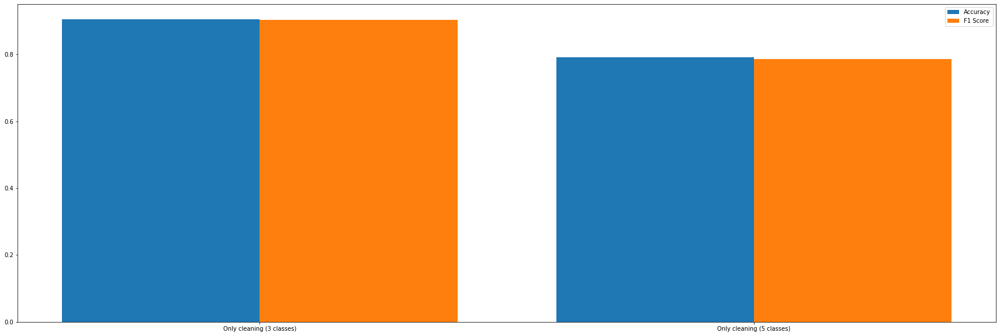

In [64]:
model_1, cM_1 = loadDLModel("Transformer", "transformer/transformer_result3Classes")

model_2, cM_2 = loadDLModel("Transformer", "transformer/transformers_cleaning")

info = [
    ["Transformer", "only cleaning (3 classes)", model_1,  5],
    ["Transformer", "only cleaning (5 classes)", model_2, 5]
]

models = [
    ['Only cleaning (3 classes)', (model_1, cM_1)],
    ['Only cleaning (5 classes)', (model_2, cM_2)]
]

plot_dl_cm(
    models,
    info,
    only_table=True,
)

# dl_models_info.extend([x + [models[i][1][0]['accuracy'], models[i]
#                             [1][0]['fScore']] for i, x in enumerate(info)])


From the results of the evaluation, it is clearly observed that transformer performs much better on 3 classes rather than 5. This is because it harder to distinguish between similar ratings like 1 & 2 and 4 & 5 as shown from the clustering experiment. Moreover, ratings 1 & 2 and 4 & 5 have a lot of common words as shown in the data visualization, thus making it difficult to classify.

# Training and testing Bi-Lstm on 3 classes

In [66]:
class BiLSTM(nn.Module):

    def __init__(self, le, embedding_matrix,max_features, embed_size):
        super(BiLSTM, self).__init__()
        self.hidden_size = 128
        drp = 0.25
        n_classes = len(le.classes_)
        self.embedding = nn.Embedding(max_features, embed_size)
        self.embedding.weight = nn.Parameter(
            torch.tensor(embedding_matrix, dtype=torch.float32))
        self.embedding.weight.requires_grad = False
        self.lstm = nn.LSTM(embed_size, self.hidden_size,
                            bidirectional=True, batch_first=True)
        self.linear = nn.Linear(self.hidden_size*4, 200)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(drp)
        self.out = nn.Linear(200, n_classes)

    def forward(self, x):
        # rint(x.size())
        h_embedding = self.embedding(x)
        #_embedding = torch.squeeze(torch.unsqueeze(h_embedding, 0))
        h_lstm, _ = self.lstm(h_embedding)
        avg_pool = torch.mean(h_lstm, 1)
        max_pool, _ = torch.max(h_lstm, 1)
        conc = torch.cat((avg_pool, max_pool), 1)
        conc = self.relu(self.linear(conc))
        conc = self.dropout(conc)
        out = self.out(conc)
        return out


class LstmModelPytorch(BaseEstimator, TransformerMixin):
    def __init__(self, max_features, n_epochs, batch_size, maxlen, embed_size, kFolds, debug, X, y):
        # Reproducing same results
        self.max_features = max_features
        self.le = LabelEncoder()
        self.tokenizer = Tokenizer(num_words=self.max_features)
        self.n_epochs = n_epochs
        self.loss_fn = nn.CrossEntropyLoss(reduction='mean')

        self.batch_size = batch_size
        self.maxlen = maxlen
        self.embed_size = embed_size
        self.kFolds = kFolds
        self.debug = debug
        self.X = X
        self.y = y

    def load_glove(self, word_index, embed_size):
        EMBEDDING_FILE = 'glove.6B/glove.6B.50d.txt'
        def get_coefs(word, *arr): return word, np.asarray(arr,
                                                           dtype='float32')[:300]
        embeddings_index = dict(get_coefs(*o.split(" "))
                                for o in open(EMBEDDING_FILE, encoding="utf8"))

        all_embs = np.stack(embeddings_index.values())
        emb_mean, emb_std = -0.005838499, 0.48782197
        embed_size = all_embs.shape[1]

        nb_words = min(self.max_features, len(word_index)+1)
        embedding_matrix = np.random.normal(
            emb_mean, emb_std, (nb_words, embed_size))
        for word, i in word_index.items():
            if i >= self.max_features:
                continue
            embedding_vector = embeddings_index.get(word)
            if embedding_vector is not None:
                embedding_matrix[i] = embedding_vector
            else:
                embedding_vector = embeddings_index.get(word.capitalize())
                if embedding_vector is not None:
                    embedding_matrix[i] = embedding_vector
        return embedding_matrix

    def plot_graph(self, epochs, train_loss, val_loss):
        fig = plt.figure(figsize=(12, 12))
        plt.title("Train/Validation Loss")
        plt.plot(list(np.arange(epochs) + 1), train_loss, label='train')
        plt.plot(list(np.arange(epochs) + 1), val_loss, label='validation')
        plt.xlabel('num_epochs', fontsize=12)
        plt.ylabel('loss', fontsize=12)
        plt.legend(loc='best')
        plt.show()

    def fit(self, X, y=None):
        xDf = pd.DataFrame(X, columns=[self.X])
        xDf[self.y] = y.to_list()
        average_trainingLoss = []
        average_validationLoss = []
        totalFScore = 0
        totalAccuracy = 0
        totalConfusion_matrix = None
        kfold = StratifiedKFold(n_splits=self.kFolds,
                                shuffle=True)
        foldCounter = 0
        bestModel = None
        bestValidationF1 = 0
        # # Do the test train split
        # train_X, test_X, train_y, test_y = train_test_split(
        #     xDf[[self.X]], xDf[self.y], test_size=0.2, random_state=7,stratify=y)

        for train_index, test_index in kfold.split(xDf[[self.X]], xDf[self.y]):
            foldCounter += 1
            train_X, test_X = xDf.iloc[train_index][[
                self.X]], xDf.iloc[test_index][[self.X]]
            train_y, test_y = xDf.iloc[train_index][self.y], xDf.iloc[test_index][self.y]

            self.tokenizer.fit_on_texts(list(train_X[self.X]))
            train_X = self.tokenizer.texts_to_sequences(train_X[self.X])

            test_X = self.tokenizer.texts_to_sequences(test_X[self.X])

            if self.debug:
                self.embedding_matrix = np.random.randn(120000, 300)
            else:
                self.embedding_matrix = self.load_glove(
                    self.tokenizer.word_index, self.embed_size)

            # Pad the sentences
            train_X = pad_sequences(train_X, maxlen=self.maxlen)
            test_X = pad_sequences(test_X, maxlen=self.maxlen)

            train_y = self.le.fit_transform(train_y.values)
            test_y = self.le.transform(test_y.values)
            # Load train and test in CUDA Memory
            x_train = torch.tensor(train_X, dtype=torch.long).cuda()
            y_train = torch.tensor(train_y, dtype=torch.long).cuda()
            x_cv = torch.tensor(test_X, dtype=torch.long).cuda()
            y_cv = torch.tensor(test_y, dtype=torch.long).cuda()

            # Create Torch datasets
            train = torch.utils.data.TensorDataset(x_train, y_train)
            valid = torch.utils.data.TensorDataset(x_cv, y_cv)

            self.model = BiLSTM(self.le, self.embedding_matrix,self.max_features,self.embed_size)
            self.optimizer = torch.optim.Adam(
                filter(lambda p: p.requires_grad, self.model.parameters()), lr=0.001)
            self.model.cuda()

            # Create Data Loaders
            train_loader = torch.utils.data.DataLoader(
                train, batch_size=self.batch_size, shuffle=True)
            valid_loader = torch.utils.data.DataLoader(
                valid, batch_size=self.batch_size, shuffle=False)

            train_loss = []
            valid_loss = []

            for epoch in range(self.n_epochs):
                start_time = time.time()
                # Set model to train configuration
                self.model.train()
                avg_loss = 0.
                for i, (x_batch, y_batch) in enumerate(train_loader):
                    # Predict/Forward Pass
                    y_pred = self.model(x_batch)
                    # Compute loss
                    self.loss = self.loss_fn(y_pred, y_batch)
                    self.optimizer.zero_grad()
                    self.loss.backward()
                    self.optimizer.step()
                    avg_loss += self.loss.item() / len(train_loader)

                # Set model to validation configuration -Doesn't get trained here
                self.model.eval()
                avg_val_loss = 0.
                val_preds = np.zeros((len(x_cv), len(self.le.classes_)))

                for i, (x_batch, y_batch) in enumerate(valid_loader):
                    y_pred = self.model(x_batch).detach()
                    avg_val_loss += self.loss_fn(y_pred,
                                                 y_batch).item() / len(valid_loader)
                    # keep/store predictions
                    val_preds[i * self.batch_size:(i+1) *
                              self.batch_size] = F.softmax(y_pred).cpu().numpy()

                # Check Accuracy
                val_accuracy = sum(val_preds.argmax(
                    axis=1) == test_y)/len(test_y)
                train_loss.append(avg_loss)
                valid_loss.append(avg_val_loss)
                elapsed_time = time.time() - start_time
                print('Epoch {}/{} at {} fold: \t loss={:.4f} \t val_loss={:.4f}  \t val_acc={:.4f}  \t time={:.2f}s'.format(
                    epoch + 1, self.n_epochs, foldCounter, avg_loss, avg_val_loss, val_accuracy, elapsed_time))
            average_trainingLoss.append(train_loss)
            average_validationLoss.append(valid_loss)
            y_true = [self.le.classes_[x] for x in test_y]
            y_pred = [self.le.classes_[x] for x in val_preds.argmax(axis=1)]
            fSc = f1_score(y_true, y_pred, average='weighted')
            if fSc > bestValidationF1:
                bestValidationF1 = fSc
                bestModel = self.model
            totalAccuracy += accuracy_score(y_true, y_pred)
            totalFScore += fSc
            totalConfusion_matrix = totalConfusion_matrix + confusion_matrix(
                y_true, y_pred) if totalConfusion_matrix is not None else confusion_matrix(y_true, y_pred)

            torch.save(bestModel, 'lstm3CLasses/bilstm_model')
            torch.save(self.tokenizer, 'lstm3CLasses/bilstm_model_tokenizer')
            torch.save(self.le, 'lstm3CLasses/bilstm_model_labelencoder')
            gc.collect()
        # Element wise sum the average training and validation loss
        average_trainingLoss = np.array(average_trainingLoss).sum(axis=0)
        average_validationLoss = np.array(average_validationLoss).sum(axis=0)
        self.plot_graph(self.n_epochs, average_trainingLoss,
                        average_validationLoss)
        totalAccuracy = totalAccuracy/self.k_fold
        totalFScore = totalFScore/self.k_fold
        totalConfusion_matrix = totalConfusion_matrix/self.k_fold
        # Save the confusion matrix np save
        with open(f"lstm_confusion_matrix.npy", "wb") as of:
            np.save(of, totalConfusion_matrix)
        # Save the file as json
        with open(f"stats.json", 'w') as f:
            json.dump({'accuracy': totalAccuracy, 'fScore': totalFScore}, f)
        print("## Trained and Tested  Model: BiLSTM" +
              "\n\t - using lemmitization for tokenization" +
              "\n\t - with Glove Embeddings for vectorization" +
              f"\n\t - {'without stratification on an unbalanced dataset'if len(X)>2000 else 'on a statified balanced dataset'}")
        print("--"*10+"Results" + "--"*10)
        print(
            # f"- Average Accuracy of BiLSTM across {self.kFolds}-folds = {totalAccuracy/self.kFolds}")
            f"- Average Accuracy of BiLSTM across {self.kFolds}-folds = {totalAccuracy}")
        print(
            f"- Average F1-Score of BiLSTM across {self.kFolds}-folds = {totalFScore}")
        # f"- Average F1-Score of BiLSTM across {self.kFolds}-folds = {totalFScore/self.kFolds}")
        print(
            f"- Average Confustion Matrix of BiLSTM across {self.kFolds}-folds:")
        # sns.heatmap(totalConfusion_matrix/self.kFolds, annot=True)
        sns.heatmap(totalConfusion_matrix, annot=True)
        plt.show()

    def predict(self, X):
        self.model = torch.load('lstm3CLasses/bilstm_model')
        self.tokenizer = torch.load('lstm3CLasses/bilstm_model_tokenizer')
        self.le = torch.load('lstm3CLasses/bilstm_model_labelencoder')
        # generate list of zeroes only int same as the length of X
        y = [1 for _ in range(len(X))]
        test_X = self.tokenizer.texts_to_sequences(X[self.X])

        test_X = pad_sequences(test_X, maxlen=self.maxlen)
        test_y = self.le.transform(y)

        x_cv = torch.tensor(test_X, dtype=torch.long).cuda()
        y_cv = torch.tensor(test_y, dtype=torch.long).cuda()
        valid = torch.utils.data.TensorDataset(x_cv, y_cv)

        valid_loader = torch.utils.data.DataLoader(
            valid, batch_size=self.batch_size, shuffle=False)

        # Set model to validation configuration -Doesn't get trained here
        self.model.eval()
        val_preds = np.zeros((len(x_cv), len(self.le.classes_)))

        for i, (x_batch, y_batch) in enumerate(valid_loader):
            y_pred = self.model(x_batch).detach()
            # keep/store predictions
            val_preds[i * self.batch_size:(i+1) *
                      self.batch_size] = F.softmax(y_pred).cpu().numpy()

        y_new = [self.le.classes_[x] for x in val_preds.argmax(axis=1)]
        return y_new

embed_size = 50  # how big is each word vector
# how many unique words to use (i.e num rows in embedding vector)
max_features = 120000
# max number of words in a tweet to use
maxlen = 1000
# maxlen = int(df['cleaned_text'].str.split().str.len().max())
batch_size = 64  # how many samples to process at once
n_epochs = 1  # how many times to iterate over all samples
n_splits = 5  # Number of K-fold Splits
debug = 0


lstmModel = LstmModelPytorch(max_features=max_features,
                             n_epochs=n_epochs, batch_size=batch_size, maxlen=maxlen, embed_size=embed_size, kFolds=n_splits, debug=debug, X="cleaned_text", y="Score")
df = pd.read_csv('data/train_cleaned_new.csv', encoding='utf-8')
df['cleaned_text'] = df['cleaned_text'].astype(str)
df.loc[:, 'Score'] = df['Score'].map({5: 1, 4: 1, 1: -1, 2: -1, 3: 0})

'''
Uncomment the following line to train the Bi-LSTM model.
'''
# _ = lstmModel.fit(df[["cleaned_text"]], df["Score"])


'\nUncomment the following line to train the Bi-LSTM model.\n'

# Evaluation Results of Bi-Lstm on 3 classes

## Trained and Tested  Model: Bi-Lstm
 	 -- with Normalization by only cleaning

--------------------Results--------------------

- Average Accuracy of Bi-Lstm across 5-folds = 0.8786670556582061

- Average F1-Score of Bi-Lstm across 5-folds = 0.9354154085066

- Average Confusion Matrix of Bi-Lstm across 5-folds:

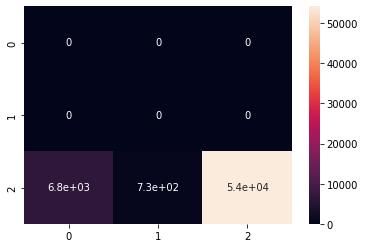

|    | Trained and Tested Deep Leaning Model: Bi-Lstm using Only cleaning (3 classes)   | Trained and Tested Deep Leaning Model: Bi-Lstm using Only cleaning (5 classes)   |
|---:|:---------------------------------------------------------------------------------|:---------------------------------------------------------------------------------|
|  0 | Average Accuracy of Bi-Lstm across 5-folds = 87.87%                              | Average Accuracy of Bi-Lstm across 5-folds = 79.15%                              |
|  1 | Average F1-Score of Bi-Lstm across 5-folds = 93.54%                              | Average F1-Score of Bi-Lstm across 5-folds = 78.65%                              |

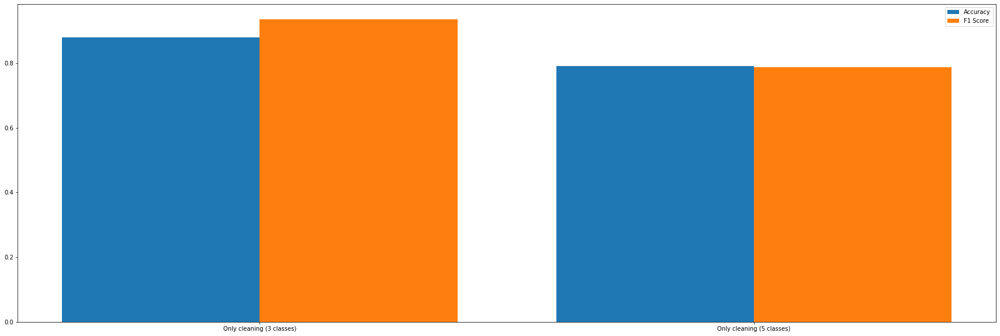

In [67]:
model_1, cM_1 = loadDLModel("lstm", "lstm/lstm3Classes")
prettyPrintDLModels(model_1, cM_1, "Bi-Lstm","only cleaning", 5)
model_2, cM_2 = loadDLModel("Transformer", "transformer/transformers_cleaning")
# prettyPrintDLModels(model, cM, "Transformer","only cleaning", 5)

info = [
    ["Bi-Lstm", "only cleaning (3 classes)", model_1, 5],
    ["Bi-Lstm", "only cleaning (5 classes)", model_2, 5]
]

models = [
    ['Only cleaning (3 classes)', (model_1, cM_1)],
    ['Only cleaning (5 classes)', (model_2, cM_2)]
]

plot_dl_cm(
    models,
    info,
    only_table=True,
)


From the results of the evaluation, similar to transformers it is clearly observed that bi-lstm performs much better on 3 classes rather than 5. To be honest it also difficult for a human to distinguish between rating 1 & 2 or 4 & 5. 

## Topic Modelling

### Pyldavis


In [ ]:
from gensim import corpora
from gensim.models import LsiModel
from gensim.models.coherencemodel import CoherenceModel
import re
import math

In [ ]:
tfidf_vectorizer = TfidfVectorizer(strip_accents = 'unicode',
                                stop_words = 'english',
                                lowercase = True,
                                token_pattern = r'\b[a-zA-Z]{3,}\b',
                                max_df = 0.5, 
                                min_df = 10)

#### Score = 1

In [ ]:
tfidf_score1 = tfidf_vectorizer.fit_transform(train[train['Score'] == 1]['Normalized_Review_text'].astype('str').values)
lda_tf_score1 = LatentDirichletAllocation(n_components=15, random_state=0)
lda_tf_score1.fit(tfidf_score1)

LatentDirichletAllocation(n_components=15, random_state=0)

In [ ]:
pyLDAvis.sklearn.prepare(lda_tf_score1, tfidf_score1, tfidf_vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
11     0.111451  0.059441       1        1  12.833306
0      0.055464  0.045824       2        1  10.162440
10     0.058851 -0.104592       3        1   9.468287
9      0.010691 -0.151274       4        1   9.092043
7     -0.052441  0.015339       5        1   8.894068
5     -0.169996 -0.024008       6        1   7.652998
4     -0.015176  0.026064       7        1   6.931962
6      0.095610 -0.042325       8        1   6.207138
8     -0.130632 -0.107366       9        1   5.878310
13    -0.011558 -0.088496      10        1   4.808424
1      0.052692  0.080359      11        1   4.659047
12     0.029756  0.027061      12        1   4.085328
3      0.069760  0.056659      13        1   3.676338
14     0.069235  0.048339      14        1   3.082134
2     -0.173707  0.158977      15        1   2.568175, topic_info=       Term        Freq        Total Category  logprob  loglift
972   coffe  984.000000   984.000000  Default  30.0000  30.0000
1498    dog  867.000000   867.000000  Default  29.0000  29.0000
1221    cup  600.000000   600.000000  Default  28.0000  28.0000
765     cat  543.000000   543.000000  Default  27.0000  27.0000
5000    tea  703.000000   703.000000  Default  26.0000  26.0000
...     ...         ...          ...      ...      ...      ...
4609   soda   17.111605    96.110481  Topic15  -5.5774   1.9362
5614   work   18.611273   291.565721  Topic15  -5.4934   0.9105
2873   like   20.364457  1273.180386  Topic15  -5.4034  -0.4735
676     buy   18.101591  1087.281607  Topic15  -5.5212  -0.4335
5371    use   16.408435   657.012710  Topic15  -5.6194  -0.0279

[1146 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1         7  0.808276        abc
16        1  0.068985       acai
16        5  0.068985       acai
16       11  0.758835       acai
31        5  0.928916  acesulfam
...     ...       ...        ...
5684      7  0.542793       zico
5684     11  0.434235       zico
5691      9  0.890900   ziwipeak
5694      6  0.191087       zuke
5694      9  0.764350       zuke

[4421 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[12, 1, 11, 10, 8, 6, 5, 7, 9, 14, 2, 13, 4, 15, 3])

##### Observations
* Topic 1
    * Talks about tea and coffee flavours and test and the ingreidients.
* Topic 2 
    * Topic about seasonings and sides, like sauce, cheese, salt, bread, spice, butter and their taste
* Topic 3
    * Topic on candys and describes the delivery service. Melted candys, ripped or torn packaging and the product being overpriced
* Topic 4
    * Topic on different shipment services
    * For example, returning the product, expired product and refunding of the product
* Topic 5 
    * Describes the ingredients of food products
* Topic 6
    * Topic on pet food
    * Terms describes the pet food causing diarrehea and sickness in cats and dogs
    * Also includes vomit
* Topic 7
    * Talks about fish food and them being smelly. Can be attributed to cat and human food
* Topic 8
    * Talks about the some machines for food , mostly the coffee machines
    * Describes them as being weak, defective, and also exploding
* Topic 9
    * About dog toys and treats
    * being dangerous and sickening for the dog
* Topic 10
    * Talks about tree , plant, seed, gardens, sprout, so probably gardening
* Topic 11
    * Talk about water, energy drink, sweetner, soda etc
* Topic 12
    * Talks about hair conditioner and shampoos
* Topic 13
    * Talks about noodles soup ingreidients like, mushroom truffle, noodle lentil, and them tasting wierd
* Topic 14
    * The topic has random terms
    * Cookies, mustard, sour gummy bear, honey, oyster, squirrel
* Topic 15
    * The topic has random terms
    * Trap, moth
    * beer meat carnivor corn
    * tortilla wasabi, soup, miso


In [ ]:
tfidf_score5 = tfidf_vectorizer.fit_transform(train[train['Score'] == 5]['Normalized_Review_text'].astype('str').values)
lda_tf_score5 = LatentDirichletAllocation(n_components=15, random_state=0)
lda_tf_score5.fit(tfidf_score5)

LatentDirichletAllocation(n_components=15, random_state=0)

### Score = 5

In [ ]:
pyLDAvis.sklearn.prepare(lda_tf_score5, tfidf_score5, tfidf_vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
10     0.097829 -0.116191       1        1  9.922021
8      0.027734  0.046383       2        1  9.294064
0      0.048044  0.040367       3        1  8.996534
5      0.050251  0.072365       4        1  8.450165
14    -0.168507 -0.000254       5        1  8.091033
12    -0.005502 -0.109688       6        1  8.015961
1      0.094758 -0.104338       7        1  7.778041
4      0.033306  0.001812       8        1  6.659015
11     0.024361  0.079315       9        1  6.245916
2     -0.189515  0.000458      10        1  6.218821
6      0.036388  0.020637      11        1  5.703859
3     -0.036934  0.049842      12        1  4.841635
7      0.069548  0.089311      13        1  3.604617
13    -0.093130 -0.071907      14        1  3.308313
9      0.011368  0.001890      15        1  2.870004, topic_info=          Term         Freq        Total Category  logprob  loglift
11294      tea  8057.000000  8057.000000  Default  30.0000  30.0000
2194     coffe  8053.000000  8053.000000  Default  29.0000  29.0000
3266       dog  6115.000000  6115.000000  Default  28.0000  28.0000
1730       cat  3597.000000  3597.000000  Default  27.0000  27.0000
8617   popcorn  1890.000000  1890.000000  Default  26.0000  26.0000
...        ...          ...          ...      ...      ...      ...
4177    flavor   148.089502  7241.368305  Topic15  -5.4371  -0.3389
8292   perfect   117.665879  3052.672762  Topic15  -5.6671   0.2949
11520     time   110.590692  4167.775158  Topic15  -5.7291  -0.0784
10923    stuff   101.377667  2704.375735  Topic15  -5.8161   0.2671
11711      tri   106.678226  5466.147004  Topic15  -5.7651  -0.3857

[1251 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
8         10  0.894122      abbi
15         8  0.910799      abit
88         5  0.023334       acn
88         6  0.163339       acn
88        14  0.793362       acn
...      ...       ...       ...
12887     15  0.941365      ziwi
12888      5  0.962637  ziwipeak
12898     11  0.924968      zotz
12902      5  0.018047      zuke
12902     10  0.974543      zuke

[5775 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 9, 1, 6, 15, 13, 2, 5, 12, 3, 7, 4, 8, 14, 10])

* Topic 1 
    * Talks about good coffee as strong and having greate taste
    * Also has topic on coffee brewer machines
* Topic 2
    * Healthy meals like cereal, snack bars, almond,  fibers, yogurts for breakfast
* Topic 3 
    * Asian meals, like rice, noodles and soup with their ingredients
* Topic 4
    * Snacks likes chips, cookies and cakes and them being very addictive
* Topic 5
    * Cat and dog loves the food and very health
* Topic 6 
    * Water and  energy drinks talks about their effectiveness and refresher
* Topic 7
    * Tea , chai herbal drink, all about different types of tea
* Topic 8
    * Fast delievery service, good package, good reviews about the seller
* Topic 9 
    * Pasta, bread, pizza all italian food and their description
    * Macaroni, flour yeast
* Topic 10
    * Dog food, dog treats, bone for chewing, dog's breath, vet and medicine
* Topic 11
    * Candy and gummy bears, reminding people of childhood memories or using in christmas or halloween, haribo
* Topic 12
    * Baby food, diapers and how they love the food
* Topic 13
    * Dressing on salad beside steak and seasonings and sauce
* Topic 14
    * Talks about shampoo, oil for hari care and washing liquids for skin a care as well
* Topic 15
    * Talks about popcorn and how they used them when watching movie in theaters and poped them in microwave




#### Conclusion

The LDA from both scores speaks about the same topics. The only difference between them is that Score = 1 LDA, displays a negative view on the topics where else the Score = 5 LDA shows positive view on the topics as expected.

### LSA

In [ ]:
def prepare_corpus(corpus): 
    # Creating the term dictionary of our courpus, where every unique term is assigned an index. dictionary = corpora.Dictionary(doc_clean)
    dictionary = corpora.Dictionary([str(doc).split() for doc in corpus['Normalized_Review_text']])
    # Converting list of documents (corpus) into Document Term Matrix using dictionary prepared a
    doc_term_matrix = [dictionary.doc2bow(str(doc).split()) for doc in corpus['Normalized_Review_text']]
    
    return [dictionary, doc_term_matrix]

In [ ]:
lsa_doc_score1 = train[train['Score'] == 1]
lsa_doc_score5 = train[train['Score'] == 5]


In [ ]:
corpus1 = prepare_corpus(lsa_doc_score1)
corpus5 = prepare_corpus(lsa_doc_score5)

In [ ]:
lsamodel1 = LsiModel(corpus1[1], num_topics=15, id2word = corpus1[0]) 

In [ ]:
lsamodel5 = LsiModel(corpus5[1], num_topics=15, id2word = corpus5[0]) 

In [ ]:
def print_topic_model(lsamodel):
    topic_dfs = []
    topics = lsamodel.print_topics(num_topics=15, num_words=15)
    for topic in topics:
        line = topic[1]
        values = re.findall("0\.[0-9]+(?=\*)", line, re.DOTALL)
        terms = re.findall("[a-z]+", line)
        obj = {'Terms': terms, "Values": values}
        topic_dfs.append(pd.DataFrame(data =obj))
    return topic_dfs


In [ ]:
def visualize_topic_model(model, rows):
    topic_dfs = print_topic_model(model)
    cols = math.ceil(len(topic_dfs)/rows)
    fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(15,15))
    for i in range(len(topic_dfs)):
        axes = ax[math.floor(i/cols)][i%cols]
        sns.barplot(x='Values', y='Terms', data=topic_dfs[i], ax=axes )
        axes.set(xlim=(0,0.8))
        axes.title.set_text('Topic' + str(i+1))
    fig.tight_layout()

### Score = 1

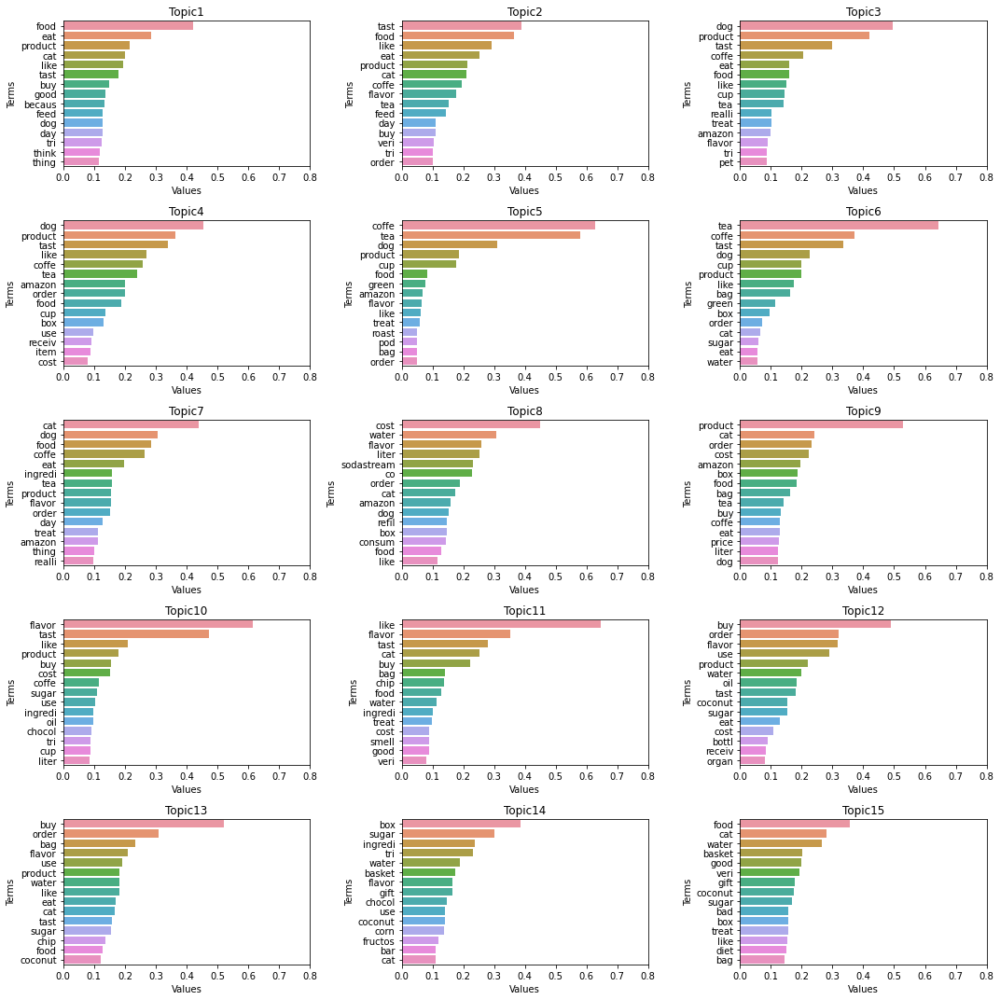

In [ ]:
visualize_topic_model(lsamodel1, 5)

### Score = 5

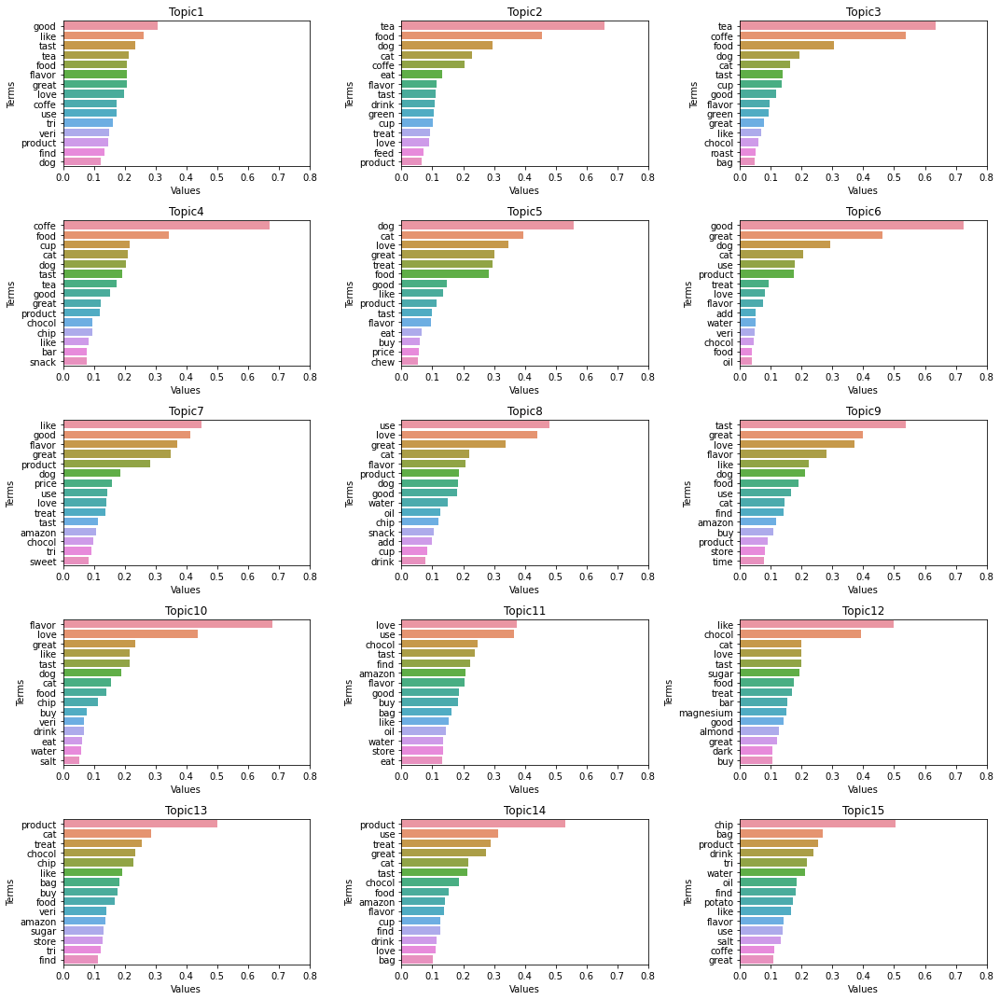

In [ ]:
visualize_topic_model(lsamodel5, 5)

#### Observations
* Most of the topics mentions cat and dog food
* Most topics talk about flavors
* Coconut are mentioned quite often along with sugar and food
* Both topics from score 1 and 5 are similar
* Score 5 have more positive word then score 1
* The topics analysed seems random
* LDA has much better combination of words to form a topic than LSA

# FOR KAGGLE COMPETITION
#### We used State of the art TRANSFORMER
After evaluating transformers using 5-fold crossvalidation we found that the transformer performs better on only clean text. Moreover, we tested different parameters for transformers using 5 fold cross validation on TPU on google colab to find the optimal parameters. Then we trained the transformer with optimal paramters on the full given train dataset to get the best result.

In [69]:
from re import L
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import MultiHeadAttention, LayerNormalization, Dropout, Layer
from tensorflow.keras.layers import Embedding, Input, GlobalAveragePooling1D, Dense
from tensorflow.keras.datasets import imdb
from tensorflow.keras.models import Sequential, Model
import numpy as np
import warnings
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score, precision_score, recall_score
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import pickle
from sklearn.preprocessing import OneHotEncoder
import gc
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)
import json


class TransformerBlock(Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = Sequential(
            [Dense(ff_dim, activation="relu"), 
             Dense(embed_dim),]
        )
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout1 = Dropout(rate)
        self.dropout2 = Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)
class TokenAndPositionEmbedding(Layer):
    def __init__(self, maxlen, vocab_size, embed_dim):
        super(TokenAndPositionEmbedding, self).__init__()
        self.token_emb = Embedding(input_dim=vocab_size, output_dim=embed_dim)
        self.pos_emb = Embedding(input_dim=maxlen, output_dim=embed_dim)

    def call(self, x):
        maxlen = tf.shape(x)[-1]
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        x = self.token_emb(x)
        return x + positions

class TransformerTensorflow(BaseEstimator, TransformerMixin):
    def __init__(self, vocab_size, maxlen, embed_dim , num_heads,ff_dim, n_epochs, batch_size, kFolds, debug, X, y):
        # Reproducing same results
        self.vocab_size = vocab_size
        self.maxlen = maxlen

        inputs = Input(shape=(maxlen,))
        embedding_layer = TokenAndPositionEmbedding(maxlen, vocab_size, embed_dim)
        inp = embedding_layer(inputs)
        transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
        tb = transformer_block(inp)
        GA = GlobalAveragePooling1D()(tb)
        GA = Dropout(0.25)(GA)
        l1 = Dense(100, activation="relu")(GA)
        l1 = Dropout(0.015)(l1)
        l2 = Dense(200, activation="relu")(l1)
        l2 = Dropout(0.055)(l2)
        # And can change the number of layers
        outputs = Dense(5, activation="softmax")(l2)

        self.model = Model(inputs=inputs, outputs=outputs)
        self.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=['accuracy'])
        self.n_epochs = n_epochs
        self.batch_size = batch_size
        self.kFolds = kFolds
        self.debug = debug
        self.X = X
        self.y = y
        self.tokenizer = keras.preprocessing.text.Tokenizer(num_words=vocab_size)
        self.le = LabelEncoder()
        
    def plot1(self,history):
        acc = history.history['accuracy']
        val_acc = history.history['val_accuracy']
        loss = history.history['loss']
        val_loss = history.history['val_loss']

        epochs = range(1, len(acc) + 1)
        ## Accuracy plot
        plt.plot(epochs, acc, 'bo', label='Training acc')
        plt.plot(epochs, val_acc, 'b', label='Validation acc')
        plt.title('Training and validation accuracy')
        plt.legend()
        ## Loss plot
        plt.figure()

        plt.plot(epochs, loss, 'bo', label='Training loss')
        plt.plot(epochs, val_loss, 'b', label='Validation loss')
        plt.title('Training and validation loss')
        plt.legend()
        plt.show()


    def plot2(self,history):
        pd.DataFrame(history.history).plot(figsize=(8, 5))
        plt.grid(True)
        #plt.gca().set_ylim(0,1)
        plt.show()
        
    def fit(self, X, y=None):
        xDf = pd.DataFrame(X, columns=[self.X])
        xDf[self.y] = y.to_list()
        totalFScore = 0
        totalAccuracy = 0
        totalConfusion_matrix = None
        kfold = StratifiedKFold(n_splits=self.kFolds,
                                shuffle=True, random_state=7)
        foldCounter = 0
        bestModel = None
        bestValidationF1 = 0
        # Do the test train split
        train_X, test_X, train_y, test_y = train_test_split(xDf[[self.X]], xDf[self.y], test_size=5/xDf.shape[0])

        self.tokenizer.fit_on_texts(list(train_X[self.X]))
        train_X = self.tokenizer.texts_to_sequences(train_X[self.X])

        test_X = self.tokenizer.texts_to_sequences(test_X[self.X])

        # Pad the sentences
        train_X = keras.preprocessing.sequence.pad_sequences(train_X, maxlen=self.maxlen)
        test_X = keras.preprocessing.sequence.pad_sequences(test_X, maxlen=self.maxlen)
        
        train_y = self.le.fit_transform(train_y)
        
        test_y = self.le.transform(test_y)

        history = self.model.fit(train_X, train_y, batch_size=self.batch_size, epochs=self.n_epochs, validation_data=(test_X, test_y) )
        self.plot1(history)
        self.plot2(history)
        results = self.model.predict(test_X,verbose=2).argmax(axis=1)
        
        fSc = f1_score(test_y, results, average='weighted')
        # if fSc > bestValidationF1:
        bestValidationF1 = fSc
        bestModel = self.model
        totalAccuracy += accuracy_score(test_y, results)
        totalFScore += fSc
        totalConfusion_matrix = totalConfusion_matrix + confusion_matrix(
            test_y, results) if totalConfusion_matrix is not None else confusion_matrix(test_y, results)

        bestModel.save_weights("predict_class.h5")
        # Save tokenizer 
        with open('tokenizer.pickle', 'wb') as handle:
            pickle.dump(self.tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)
        # Save label encoder
        with open('label_encoder.pickle', 'wb') as handle:
            pickle.dump(self.le, handle, protocol=pickle.HIGHEST_PROTOCOL)

        # totalAccuracy = totalAccuracy/self.k_fold
        # totalFScore = totalFScore/self.k_fold
        # totalConfusion_matrix = totalConfusion_matrix/self.k_fold
        # Save the confusion matrix np save
        with open(f"lstm_confusion_matrix.npy","wb") as of:
            np.save(of, totalConfusion_matrix)
        # Save the file as json
        with open(f"stats.json", 'w') as f:
            json.dump({'accuracy':totalAccuracy ,'fScore':totalFScore}, f)

        print("## Trained and Tested  Model: Transformer" +
                "\n\t - using lemmitization for tokenization" +
                f"\n\t - {'without stratification on an unbalanced dataset'if len(X)>2000 else 'on a balanced dataset'}")
        print("--"*10+"Results" + "--"*10)
        print(
            # f"- Average Accuracy of BiLSTM across {self.kFolds}-folds = {totalAccuracy/self.kFolds}")
            f"- Average Accuracy of Transformer across {self.kFolds}-folds = {totalAccuracy}")
        print(
            f"- Average F1-Score of Transformer across {self.kFolds}-folds = {totalFScore}")
            # f"- Average F1-Score of BiLSTM across {self.kFolds}-folds = {totalFScore/self.kFolds}")
        print(
            f"- Average Confustion Matrix of Transformer across {self.kFolds}-folds:")
        # sns.heatmap(totalConfusion_matrix/self.kFolds, annot=True)
        sns.heatmap(totalConfusion_matrix, annot=True)
        plt.show()

    def predict(self, X):
        # Load the model
        self.model.load_weights("kaggle/predict_class.h5")
        # Load the tokenizer
        with open('kaggle/tokenizer.pickle', 'rb') as handle:
            self.tokenizer = pickle.load(handle)
        # Load the label encoder
        with open('kaggle/label_encoder.pickle', 'rb') as handle:
            self.le = pickle.load(handle)

        test_X = self.tokenizer.texts_to_sequences(X[self.X])
        test_X = keras.preprocessing.sequence.pad_sequences(test_X, maxlen=self.maxlen)
        predictions = self.model.predict(test_X, verbose=2)


        results = predictions.argmax(axis=1)
        results = self.le.inverse_transform(results)
        return results

def main():
    
    # tqdm.pandas(desc='Progress')
    warnings.filterwarnings("ignore")


    df = pd.read_csv('data/train_cleaned_new.csv', encoding='utf-8')
    df['cleaned_text'] = df['cleaned_text'].astype(str)
    num_heads = 100  # Number of attention heads
    ff_dim = 50  # Hidden layer size in feed forward network inside transformer
    embed_dim = 50  # how big is each word vector
    # how many unique words to use (i.e num rows in embedding vector)
    vocab_size = 1000  # Only consider the top k words
    maxlen = 50  # Only consider the first 200 words of each movie review
    # maxlen = int(df['cleaned_text'].str.split().str.len().max())
    batch_size = 1000  # how many samples to process at once
    n_epochs = 200  # how many times to iterate over all samples
    n_splits = 5  # Number of K-fold Splits
    debug = 0
    model = TransformerTensorflow(vocab_size, maxlen, embed_dim , num_heads,ff_dim, n_epochs, batch_size, n_splits, debug, X="cleaned_text", y="Score")
    df['cleaned_text'] = df['cleaned_text'].astype(str)
    _=model.fit(df[['cleaned_text']],df['Score'])
    # load and  Take the index from the csv file
    new_df = pd.read_csv('data/test_cleaned_new.csv', encoding='utf-8')
    new_df ['cleaned_text'] = new_df ['cleaned_text'].astype(str)
    gc.collect()
    y_pred = model.predict(new_df [["cleaned_text"]])
    # save only y_pred to csv
    new_df ['Score'] = y_pred
    new_df [['Id','Score']].to_csv('data/predicted_test_data.csv', index=False)

'''
Run the main function to train and save results for the transformer.
'''

'\nRun the main function to train and save results for the transformer.\n'